<a href="https://colab.research.google.com/github/fbeilstein/algorithms/blob/master/lecture_06_linear_algorithms_on_arrays_1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Lecture objectives:

* What is subarray, subsequence, lexicographic order, in-place algos
* Learn that even algorithms with one/two variables can be quite challenging
* Understand how can we convert quadratic algorithms into linear ones
* Two pointers technique
* Cover simplest linear algorithms:
 * Third maximum number
 * Next permutation
 * Majority vote
 * Rotate array
 * Merge
 * Partition
 * Dutch flag, etc

Array is a playground data structure to learn how design linear algorithms even when we are tempted to come up with a quadratic algos.  

# Arrays et al.

A **subarray** is a contiguous part of array, i.e., subarray is an array that is inside another array. For an array of size $n$, there are $\frac{n(n+1)}{2}$ non-empty subarrays.

A **subsequence** is a sequence that can be derived from another sequence by removing zero or more elements, without changing the order of the remaining elements. For a sequence of size $n$, we can have $2^n-1$ non-empty sub-sequences in total.

In [ ]:
#@title Subarray / subsequence
%%html

<?xml version="1.0" encoding="UTF-8"?>
<svg width="108mm" height="47mm" version="1.1" viewBox="0 0 181.17 77.068" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:ns38="http://www.iki.fi/pav/software/textext/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(-288.71 228.51)">
  <g transform="matrix(.82755 0 0 .82755 80.675 -31.655)" style="fill-opacity:.54167;fill:#000000" ns38:alignment="middle center" ns38:jacobian_sqrt="1.0" ns38:pdfconverter="inkscape" ns38:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns38:scale="2.834645669291339" ns38:texconverter="pdflatex" ns38:text="$$local max$$\n$$local min$$\n$$buy/sell sequence$$\n$$profit$$" ns38:version="1.1.0">
   <rect x="251.61" y="-223.06" width="19.862" height="19.539" ry="3.3647" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="271.47" y="-223.06" width="19.862" height="19.539" ry="3.3647" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="291.33" y="-223.06" width="19.862" height="19.539" ry="3.3647" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="311.19" y="-223.06" width="19.862" height="19.539" ry="3.3647" style="fill-opacity:.21591;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="331.06" y="-223.06" width="19.862" height="19.539" ry="3.3647" style="fill-opacity:.21591;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="350.92" y="-223.06" width="19.862" height="19.539" ry="3.3647" style="fill-opacity:.21591;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="370.78" y="-223.06" width="19.862" height="19.539" ry="3.3647" style="fill-opacity:.21591;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="390.64" y="-223.06" width="19.862" height="19.539" ry="3.3647" style="fill-opacity:.21591;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="410.51" y="-223.06" width="19.862" height="19.539" ry="3.3647" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="430.37" y="-223.06" width="19.862" height="19.539" ry="3.3647" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="450.23" y="-223.06" width="19.862" height="19.539" ry="3.3647" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="251.61" y="-164.51" width="19.862" height="19.539" ry="3.3221" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="271.47" y="-164.51" width="19.862" height="19.539" ry="3.3221" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="291.33" y="-164.51" width="19.862" height="19.539" ry="3.3221" style="fill-opacity:.21591;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="311.19" y="-164.51" width="19.862" height="19.539" ry="3.3221" style="fill-opacity:.21591;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="331.06" y="-164.51" width="19.862" height="19.539" ry="3.3221" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="350.92" y="-164.51" width="19.862" height="19.539" ry="3.3221" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="370.78" y="-164.51" width="19.862" height="19.539" ry="3.3221" style="fill-opacity:.21591;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="390.64" y="-164.51" width="19.862" height="19.539" ry="3.3221" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="410.51" y="-164.51" width="19.862" height="19.539" ry="3.3221" style="fill-opacity:.21591;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="430.37" y="-164.51" width="19.862" height="19.539" ry="3.3221" style="fill-opacity:.21591;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <rect x="450.23" y="-164.51" width="19.862" height="19.539" ry="3.3221" style="fill-opacity:.21591;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-width:.44106;stroke:#afafaf"/>
   <g transform="matrix(1.1771 0 0 1.1771 244.19 -237.76)" ns38:alignment="middle center" ns38:inkscapeversion="1.0" ns38:jacobian_sqrt="1.0" ns38:pdfconverter="inkscape" ns38:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns38:scale="2.834645669291339" ns38:texconverter="pdflatex" ns38:text="$$subarray$$\n$$subsequence$$" ns38:version="1.1.0">
    <g transform="translate(-279.12 -139.8)">
     <g id="id-b015bca3-d4ab-44fd-aae6-2c6c49cb1b8f" transform="matrix(.90874 0 0 .90874 26.632 14.078)" style="fill-opacity:1;fill:#000000">
      <g transform="translate(285.64,146.72)">
       <path d="m3.8906-3.7344c-0.26562 0.015625-0.46875 0.23438-0.46875 0.45312 0 0.14062 0.09375 0.29688 0.3125 0.29688s0.45312-0.17188 0.45312-0.5625c0-0.45312-0.42188-0.85938-1.1875-0.85938-1.3125 0-1.6875 1.0156-1.6875 1.4531 0 0.78125 0.73438 0.92188 1.0312 0.98438 0.51562 0.10938 1.0312 0.21875 1.0312 0.76562 0 0.25-0.21875 1.0938-1.4219 1.0938-0.14062 0-0.90625 0-1.1406-0.53125 0.39062 0.046875 0.64062-0.25 0.64062-0.53125 0-0.21875-0.17188-0.34375-0.375-0.34375-0.26562 0-0.5625 0.20312-0.5625 0.65625 0 0.5625 0.57812 0.96875 1.4219 0.96875 1.625 0 2.0156-1.2031 2.0156-1.6562 0-0.35938-0.1875-0.60938-0.3125-0.71875-0.26562-0.28125-0.5625-0.34375-1-0.42188-0.35938-0.078125-0.75-0.15625-0.75-0.60938 0-0.28125 0.23438-0.89062 1.1094-0.89062 0.25 0 0.75 0.078125 0.89062 0.45312z"/>
      </g>
      <g transform="translate(290.31,146.72)">
       <path d="m3.4844-0.5625c0.10938 0.40625 0.46875 0.67188 0.89062 0.67188 0.34375 0 0.57812-0.23438 0.73438-0.54688 0.17188-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.10938 0-0.10938 0.046875-0.14062 0.1875-0.14062 0.5625-0.32812 1.2344-0.75 1.2344-0.20312 0-0.3125-0.125-0.3125-0.45312 0-0.21875 0.125-0.6875 0.20312-1.0469l0.28125-1.0781c0.03125-0.14062 0.125-0.51562 0.17188-0.67188 0.046875-0.23438 0.14062-0.60938 0.14062-0.67188 0-0.17188-0.14062-0.26562-0.28125-0.26562-0.046875 0-0.3125 0.015625-0.39062 0.34375-0.1875 0.73438-0.625 2.4844-0.75 3-0.015625 0.046875-0.40625 0.84375-1.1406 0.84375-0.51562 0-0.60938-0.45312-0.60938-0.8125 0-0.5625 0.28125-1.3438 0.53125-2.0312 0.125-0.3125 0.17188-0.45312 0.17188-0.64062 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.95312 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.25-0.85938 0.64062-1.2344 1.0156-1.2344 0.09375 0 0.25 0.015625 0.25 0.32812 0 0.23438-0.10938 0.53125-0.17188 0.67188-0.375 1-0.57812 1.6094-0.57812 2.0938 0 0.95312 0.6875 1.2031 1.2188 1.2031 0.65625 0 1.0156-0.45312 1.1875-0.67188z"/>
      </g>
      <g transform="translate(296.02,146.72)">
       <path id="id-d31f4486-5f17-488b-a980-2bdd449192de" d="m2.375-6.8125s0-0.10938-0.125-0.10938c-0.21875 0-0.95312 0.078125-1.2188 0.10938-0.078125 0-0.1875 0.015625-0.1875 0.1875 0 0.125 0.09375 0.125 0.25 0.125 0.46875 0 0.48438 0.0625 0.48438 0.17188 0 0.0625-0.078125 0.40625-0.125 0.60938l-0.82812 3.25c-0.10938 0.5-0.15625 0.67188-0.15625 1.0156 0 0.9375 0.53125 1.5625 1.2656 1.5625 1.1719 0 2.4062-1.4844 2.4062-2.9219 0-0.90625-0.53125-1.5938-1.3281-1.5938-0.45312 0-0.875 0.29688-1.1719 0.59375zm-0.92188 3.7656c0.046875-0.21875 0.046875-0.23438 0.14062-0.34375 0.48438-0.64062 0.9375-0.79688 1.2031-0.79688 0.35938 0 0.625 0.29688 0.625 0.9375 0 0.59375-0.32812 1.7344-0.51562 2.1094-0.32812 0.67188-0.78125 1.0312-1.1719 1.0312-0.34375 0-0.67188-0.26562-0.67188-1 0-0.20312 0-0.39062 0.15625-1.0156z"/>
      </g>
      <g transform="translate(300.29,146.72)">
       <path d="m3.7188-3.7656c-0.1875-0.375-0.46875-0.64062-0.92188-0.64062-1.1562 0-2.3906 1.4688-2.3906 2.9219 0 0.9375 0.54688 1.5938 1.3125 1.5938 0.20312 0 0.70312-0.046875 1.2969-0.75 0.078125 0.42188 0.4375 0.75 0.90625 0.75 0.35938 0 0.57812-0.23438 0.75-0.54688 0.15625-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.14062 0.1875-0.17188 0.64062-0.34375 1.2344-0.75 1.2344-0.28125 0-0.29688-0.26562-0.29688-0.45312 0-0.21875 0.015625-0.3125 0.125-0.75 0.10938-0.40625 0.125-0.51562 0.21875-0.89062l0.35938-1.3906c0.0625-0.28125 0.0625-0.29688 0.0625-0.34375 0-0.17188-0.10938-0.26562-0.28125-0.26562-0.25 0-0.39062 0.21875-0.42188 0.4375zm-0.64062 2.5781c-0.0625 0.1875-0.0625 0.20312-0.20312 0.375-0.4375 0.54688-0.84375 0.70312-1.125 0.70312-0.5 0-0.64062-0.54688-0.64062-0.9375 0-0.5 0.3125-1.7188 0.54688-2.1875 0.3125-0.57812 0.75-0.95312 1.1562-0.95312 0.64062 0 0.78125 0.8125 0.78125 0.875s-0.015625 0.125-0.03125 0.17188z"/>
      </g>
      <g transform="translate(305.56,146.72)">
       <path d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0.015625-0.03125 0.34375-1.3906 0.39062-1.5781 0.078125-0.32812 0.26562-1.0156 0.3125-1.2969 0.046875-0.125 0.32812-0.59375 0.5625-0.8125 0.078125-0.0625 0.375-0.32812 0.79688-0.32812 0.26562 0 0.40625 0.125 0.42188 0.125-0.29688 0.046875-0.51562 0.28125-0.51562 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375s0.54688-0.23438 0.54688-0.59375c0-0.34375-0.3125-0.64062-0.82812-0.64062-0.64062 0-1.0781 0.48438-1.2656 0.76562-0.09375-0.45312-0.45312-0.76562-0.92188-0.76562-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.15625 0 0.29688 0.078125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
      </g>
     </g>
     <g id="id-70bf0e81-50f8-4659-89c7-d2311e3eeece" transform="matrix(.90874 0 0 .90874 26.632 14.078)" style="fill-opacity:1;fill:#000000">
      <g transform="translate(310.33,146.72)">
       <path d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0.015625-0.03125 0.34375-1.3906 0.39062-1.5781 0.078125-0.32812 0.26562-1.0156 0.3125-1.2969 0.046875-0.125 0.32812-0.59375 0.5625-0.8125 0.078125-0.0625 0.375-0.32812 0.79688-0.32812 0.26562 0 0.40625 0.125 0.42188 0.125-0.29688 0.046875-0.51562 0.28125-0.51562 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375s0.54688-0.23438 0.54688-0.59375c0-0.34375-0.3125-0.64062-0.82812-0.64062-0.64062 0-1.0781 0.48438-1.2656 0.76562-0.09375-0.45312-0.45312-0.76562-0.92188-0.76562-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.15625 0 0.29688 0.078125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
      </g>
     </g>
     <g id="id-2f9c1082-33e2-4048-a8b0-49a5739caf3f" transform="matrix(.90874 0 0 .90874 26.632 14.078)" style="fill-opacity:1;fill:#000000">
      <g transform="translate(315.1,146.72)">
       <path d="m3.7188-3.7656c-0.1875-0.375-0.46875-0.64062-0.92188-0.64062-1.1562 0-2.3906 1.4688-2.3906 2.9219 0 0.9375 0.54688 1.5938 1.3125 1.5938 0.20312 0 0.70312-0.046875 1.2969-0.75 0.078125 0.42188 0.4375 0.75 0.90625 0.75 0.35938 0 0.57812-0.23438 0.75-0.54688 0.15625-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.14062 0.1875-0.17188 0.64062-0.34375 1.2344-0.75 1.2344-0.28125 0-0.29688-0.26562-0.29688-0.45312 0-0.21875 0.015625-0.3125 0.125-0.75 0.10938-0.40625 0.125-0.51562 0.21875-0.89062l0.35938-1.3906c0.0625-0.28125 0.0625-0.29688 0.0625-0.34375 0-0.17188-0.10938-0.26562-0.28125-0.26562-0.25 0-0.39062 0.21875-0.42188 0.4375zm-0.64062 2.5781c-0.0625 0.1875-0.0625 0.20312-0.20312 0.375-0.4375 0.54688-0.84375 0.70312-1.125 0.70312-0.5 0-0.64062-0.54688-0.64062-0.9375 0-0.5 0.3125-1.7188 0.54688-2.1875 0.3125-0.57812 0.75-0.95312 1.1562-0.95312 0.64062 0 0.78125 0.8125 0.78125 0.875s-0.015625 0.125-0.03125 0.17188z"/>
      </g>
      <g transform="translate(320.36,146.72)">
       <path d="m4.8438-3.7969c0.046875-0.14062 0.046875-0.15625 0.046875-0.23438 0-0.17188-0.14062-0.26562-0.29688-0.26562-0.09375 0-0.25 0.0625-0.34375 0.20312-0.015625 0.0625-0.10938 0.35938-0.14062 0.54688-0.078125 0.25-0.14062 0.53125-0.20312 0.79688l-0.45312 1.7969c-0.03125 0.14062-0.46875 0.84375-1.125 0.84375-0.5 0-0.60938-0.4375-0.60938-0.8125 0-0.45312 0.17188-1.0781 0.5-1.9531 0.15625-0.40625 0.20312-0.51562 0.20312-0.71875 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.95312 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.28125-0.9375 0.67188-1.2344 1.0156-1.2344 0.078125 0 0.25 0 0.25 0.3125 0 0.25-0.10938 0.51562-0.17188 0.70312-0.40625 1.0625-0.57812 1.625-0.57812 2.0938 0 0.89062 0.625 1.1875 1.2188 1.1875 0.39062 0 0.71875-0.17188 1-0.45312-0.125 0.51562-0.25 1.0156-0.64062 1.5469-0.26562 0.32812-0.64062 0.625-1.0938 0.625-0.14062 0-0.59375-0.03125-0.76562-0.42188 0.15625 0 0.29688 0 0.42188-0.125 0.10938-0.078125 0.20312-0.21875 0.20312-0.40625 0-0.3125-0.26562-0.34375-0.35938-0.34375-0.23438 0-0.5625 0.15625-0.5625 0.64062 0 0.5 0.4375 0.875 1.0625 0.875 1.0156 0 2.0469-0.90625 2.3281-2.0312z"/>
      </g>
     </g>
     <g transform="translate(6.3129 30.953)" style="fill-opacity:1;fill:#000000">
      <g transform="matrix(.90874 0 0 .90874 279.99 166.76)">
       <path d="m3.8906-3.7344c-0.26562 0.015625-0.46875 0.23438-0.46875 0.45312 0 0.14062 0.09375 0.29688 0.3125 0.29688s0.45312-0.17188 0.45312-0.5625c0-0.45312-0.42188-0.85938-1.1875-0.85938-1.3125 0-1.6875 1.0156-1.6875 1.4531 0 0.78125 0.73438 0.92188 1.0312 0.98438 0.51562 0.10938 1.0312 0.21875 1.0312 0.76562 0 0.25-0.21875 1.0938-1.4219 1.0938-0.14062 0-0.90625 0-1.1406-0.53125 0.39062 0.046875 0.64062-0.25 0.64062-0.53125 0-0.21875-0.17188-0.34375-0.375-0.34375-0.26562 0-0.5625 0.20312-0.5625 0.65625 0 0.5625 0.57812 0.96875 1.4219 0.96875 1.625 0 2.0156-1.2031 2.0156-1.6562 0-0.35938-0.1875-0.60938-0.3125-0.71875-0.26562-0.28125-0.5625-0.34375-1-0.42188-0.35938-0.078125-0.75-0.15625-0.75-0.60938 0-0.28125 0.23438-0.89062 1.1094-0.89062 0.25 0 0.75 0.078125 0.89062 0.45312z"/>
      </g>
      <g transform="matrix(.90874 0 0 .90874 284.23 160.97)">
       <path d="m3.4844 5.8081c0.10938 0.40625 0.46875 0.67188 0.89062 0.67188 0.34375 0 0.57812-0.23438 0.73438-0.54688 0.17188-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.10938 0-0.10938 0.046875-0.14062 0.1875-0.14062 0.5625-0.32812 1.2344-0.75 1.2344-0.20312 0-0.3125-0.125-0.3125-0.45312 0-0.21875 0.125-0.6875 0.20312-1.0469l0.28125-1.0781c0.03125-0.14062 0.125-0.51562 0.17188-0.67188 0.046875-0.23438 0.14062-0.60938 0.14062-0.67188 0-0.17188-0.14062-0.26562-0.28125-0.26562-0.046875 0-0.3125 0.015625-0.39062 0.34375-0.1875 0.73438-0.625 2.4844-0.75 3-0.015625 0.046875-0.40625 0.84375-1.1406 0.84375-0.51562 0-0.60938-0.45312-0.60938-0.8125 0-0.5625 0.28125-1.3438 0.53125-2.0312 0.125-0.3125 0.17188-0.45312 0.17188-0.64062 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.95312 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.25-0.85938 0.64062-1.2344 1.0156-1.2344 0.09375 0 0.25 0.015625 0.25 0.32812 0 0.23438-0.10938 0.53125-0.17188 0.67188-0.375 1-0.57812 1.6094-0.57812 2.0938 0 0.95312 0.6875 1.2031 1.2188 1.2031 0.65625 0 1.0156-0.45312 1.1875-0.67188z"/>
      </g>
      <g transform="matrix(.90874 0 0 .90874 289.41 166.76)">
       <path d="m2.375-6.8125s0-0.10938-0.125-0.10938c-0.21875 0-0.95312 0.078125-1.2188 0.10938-0.078125 0-0.1875 0.015625-0.1875 0.1875 0 0.125 0.09375 0.125 0.25 0.125 0.46875 0 0.48438 0.0625 0.48438 0.17188 0 0.0625-0.078125 0.40625-0.125 0.60938l-0.82812 3.25c-0.10938 0.5-0.15625 0.67188-0.15625 1.0156 0 0.9375 0.53125 1.5625 1.2656 1.5625 1.1719 0 2.4062-1.4844 2.4062-2.9219 0-0.90625-0.53125-1.5938-1.3281-1.5938-0.45312 0-0.875 0.29688-1.1719 0.59375zm-0.92188 3.7656c0.046875-0.21875 0.046875-0.23438 0.14062-0.34375 0.48438-0.64062 0.9375-0.79688 1.2031-0.79688 0.35938 0 0.625 0.29688 0.625 0.9375 0 0.59375-0.32812 1.7344-0.51562 2.1094-0.32812 0.67188-0.78125 1.0312-1.1719 1.0312-0.34375 0-0.67188-0.26562-0.67188-1 0-0.20312 0-0.39062 0.15625-1.0156z"/>
      </g>
      <g transform="matrix(.90874 0 0 .90874 293.3 166.76)">
       <path id="id-1be4e92f-6414-4b51-ac0b-46d0d0833e7a" d="m3.8906-3.7344c-0.26562 0.015625-0.46875 0.23438-0.46875 0.45312 0 0.14062 0.09375 0.29688 0.3125 0.29688s0.45312-0.17188 0.45312-0.5625c0-0.45312-0.42188-0.85938-1.1875-0.85938-1.3125 0-1.6875 1.0156-1.6875 1.4531 0 0.78125 0.73438 0.92188 1.0312 0.98438 0.51562 0.10938 1.0312 0.21875 1.0312 0.76562 0 0.25-0.21875 1.0938-1.4219 1.0938-0.14062 0-0.90625 0-1.1406-0.53125 0.39062 0.046875 0.64062-0.25 0.64062-0.53125 0-0.21875-0.17188-0.34375-0.375-0.34375-0.26562 0-0.5625 0.20312-0.5625 0.65625 0 0.5625 0.57812 0.96875 1.4219 0.96875 1.625 0 2.0156-1.2031 2.0156-1.6562 0-0.35938-0.1875-0.60938-0.3125-0.71875-0.26562-0.28125-0.5625-0.34375-1-0.42188-0.35938-0.078125-0.75-0.15625-0.75-0.60938 0-0.28125 0.23438-0.89062 1.1094-0.89062 0.25 0 0.75 0.078125 0.89062 0.45312z"/>
      </g>
      <g transform="matrix(.90874 0 0 .90874 297.55 166.76)">
       <path d="m1.8594-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z"/>
      </g>
      <g transform="matrix(.90874 0 0 .90874 301.76 166.76)">
       <path id="id-4e7cd1e4-43c1-4399-99b2-d5ab9fb8977c" d="m4.5-4.2969c0-0.046875-0.03125-0.09375-0.09375-0.09375-0.10938 0-0.51562 0.39062-0.67188 0.6875-0.21875-0.54688-0.60938-0.70312-0.9375-0.70312-1.1719 0-2.3906 1.4688-2.3906 2.9219 0 0.96875 0.57812 1.5938 1.3125 1.5938 0.42188 0 0.8125-0.23438 1.1719-0.59375-0.09375 0.34375-0.42188 1.6875-0.45312 1.7812-0.078125 0.28125-0.15625 0.3125-0.71875 0.32812-0.125 0-0.21875 0-0.21875 0.20312 0 0 0 0.10938 0.125 0.10938 0.3125 0 0.67188-0.03125 1-0.03125s0.6875 0.03125 1.0312 0.03125c0.046875 0 0.17188 0 0.17188-0.20312 0-0.10938-0.09375-0.10938-0.26562-0.10938-0.46875 0-0.46875-0.0625-0.46875-0.15625 0-0.078125 0.015625-0.14062 0.03125-0.21875zm-2.75 4.1875c-0.60938 0-0.64062-0.76562-0.64062-0.9375 0-0.48438 0.28125-1.5625 0.45312-1.9844 0.3125-0.73438 0.82812-1.1562 1.2344-1.1562 0.65625 0 0.79688 0.8125 0.79688 0.875s-0.54688 2.25-0.57812 2.2812c-0.15625 0.28125-0.71875 0.92188-1.2656 0.92188z"/>
      </g>
     </g>
     <g transform="matrix(.90874 0 0 .90874 33.117 48.089)" style="fill-opacity:1;fill:#000000">
      <g transform="translate(307.37,164.65)">
       <path id="id-bafbaaa5-1791-4d1f-889f-fed21b2eb58c" d="m3.4844-0.5625c0.10938 0.40625 0.46875 0.67188 0.89062 0.67188 0.34375 0 0.57812-0.23438 0.73438-0.54688 0.17188-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.10938 0-0.10938 0.046875-0.14062 0.1875-0.14062 0.5625-0.32812 1.2344-0.75 1.2344-0.20312 0-0.3125-0.125-0.3125-0.45312 0-0.21875 0.125-0.6875 0.20312-1.0469l0.28125-1.0781c0.03125-0.14062 0.125-0.51562 0.17188-0.67188 0.046875-0.23438 0.14062-0.60938 0.14062-0.67188 0-0.17188-0.14062-0.26562-0.28125-0.26562-0.046875 0-0.3125 0.015625-0.39062 0.34375-0.1875 0.73438-0.625 2.4844-0.75 3-0.015625 0.046875-0.40625 0.84375-1.1406 0.84375-0.51562 0-0.60938-0.45312-0.60938-0.8125 0-0.5625 0.28125-1.3438 0.53125-2.0312 0.125-0.3125 0.17188-0.45312 0.17188-0.64062 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.95312 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.25-0.85938 0.64062-1.2344 1.0156-1.2344 0.09375 0 0.25 0.015625 0.25 0.32812 0 0.23438-0.10938 0.53125-0.17188 0.67188-0.375 1-0.57812 1.6094-0.57812 2.0938 0 0.95312 0.6875 1.2031 1.2188 1.2031 0.65625 0 1.0156-0.45312 1.1875-0.67188z"/>
      </g>
      <g transform="translate(313.08,164.65)">
       <path id="id-727a99fd-c888-45c0-a72f-748e10f209cb" d="m1.8594-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z"/>
      </g>
      <g transform="translate(317.71,164.65)">
       <path id="id-7b033a8a-18ce-4778-a6dc-675f0bf5f41d" d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0-0.015625 0.125-0.48438 0.1875-0.73438l0.21875-0.89062c0.046875-0.23438 0.10938-0.45312 0.17188-0.67188 0.03125-0.17188 0.10938-0.46875 0.125-0.5 0.14062-0.3125 0.67188-1.2188 1.625-1.2188 0.45312 0 0.53125 0.375 0.53125 0.70312 0 0.60938-0.48438 1.8906-0.64062 2.3125-0.09375 0.23438-0.10938 0.35938-0.10938 0.46875 0 0.46875 0.35938 0.8125 0.82812 0.8125 0.9375 0 1.2969-1.4531 1.2969-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.10938 0-0.10938 0.03125-0.15625 0.1875-0.20312 0.67188-0.53125 1.2344-1.0156 1.2344-0.17188 0-0.23438-0.09375-0.23438-0.32812 0-0.25 0.078125-0.48438 0.17188-0.70312 0.1875-0.53125 0.60938-1.625 0.60938-2.2031 0-0.65625-0.42188-1.0625-1.1406-1.0625-0.90625 0-1.3906 0.64062-1.5625 0.875-0.046875-0.5625-0.45312-0.875-0.92188-0.875-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.1875 0 0.29688 0.125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
      </g>
      <g transform="translate(323.69,164.65)">
       <path d="m3.9531-3.7812c-0.17188 0-0.29688 0-0.4375 0.125-0.17188 0.15625-0.1875 0.32812-0.1875 0.39062 0 0.25 0.1875 0.35938 0.375 0.35938 0.28125 0 0.54688-0.25 0.54688-0.64062 0-0.48438-0.46875-0.85938-1.1719-0.85938-1.3438 0-2.6719 1.4219-2.6719 2.8281 0 0.90625 0.57812 1.6875 1.625 1.6875 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.625 0-0.90625-0.48438-0.90625-1.0938 0-0.40625 0.20312-1.375 0.54688-1.9844 0.3125-0.57812 0.85938-1 1.4062-1 0.32812 0 0.71875 0.125 0.85938 0.40625z"/>
      </g>
      <g transform="translate(328.01,164.65)">
       <path d="m1.8594-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z"/>
      </g>
     </g>
    </g>
   </g>
  </g>
 </g>
</svg>



In [ ]:
#@title Choose your representation
%%html

<svg width="219mm" height="58mm" version="1.1" viewBox="0 0 422.25 110.13" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:ns8="http://www.iki.fi/pav/software/textext/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(10.426 48.849)">
  <rect x="-10.142" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="11.24" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.621" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.003" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="160.91" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="139.53" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="61.504227" y="60.570686" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="61.504227" y="60.570686" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="125.69828" y="60.030804" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="125.69828" y="60.030804" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">j</tspan></text>
  <rect x="219.11" y="24.668" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="240.49" y="24.668" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="261.87" y="24.668" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="283.25" y="24.668" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="390.16" y="24.668" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="368.78" y="24.668" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="290.75473" y="60.480412" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="290.75473" y="60.480412" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="376.12061" y="59.940525" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="376.12061" y="59.940525" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">j</tspan></text>
  <rect x="304.63" y="24.668" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="326.02" y="24.668" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="347.4" y="24.668" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <path d="m78.447 17.746 121.51-44.687 124.52 45.692" style="fill:none;stroke-width:.40715px;stroke:#000000"/>
  <g transform="matrix(3.7795 0 0 3.7795 590.29 -17.957)" ns8:alignment="middle center" ns8:inkscapeversion="1.0" ns8:jacobian_sqrt="3.77952" ns8:pdfconverter="inkscape" ns8:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns8:scale="2.834645669291339" ns8:texconverter="pdflatex" ns8:text="$subarray$" ns8:version="1.1.0">
   <defs></defs>
   <g transform="matrix(.26379 0 0 .26379 -148.9 -41.697)">
    <g style="fill:#000000">
     <g transform="translate(148.71 134.76)">
      <path d="m3.8906-3.7344c-0.26562 0.015625-0.46875 0.23438-0.46875 0.45312 0 0.14062 0.09375 0.29688 0.3125 0.29688s0.45312-0.17188 0.45312-0.5625c0-0.45312-0.42188-0.85938-1.1875-0.85938-1.3125 0-1.6875 1.0156-1.6875 1.4531 0 0.78125 0.73438 0.92188 1.0312 0.98438 0.51562 0.10938 1.0312 0.21875 1.0312 0.76562 0 0.25-0.21875 1.0938-1.4219 1.0938-0.14062 0-0.90625 0-1.1406-0.53125 0.39062 0.046875 0.64062-0.25 0.64062-0.53125 0-0.21875-0.17188-0.34375-0.375-0.34375-0.26562 0-0.5625 0.20312-0.5625 0.65625 0 0.5625 0.57812 0.96875 1.4219 0.96875 1.625 0 2.0156-1.2031 2.0156-1.6562 0-0.35938-0.1875-0.60938-0.3125-0.71875-0.26562-0.28125-0.5625-0.34375-1-0.42188-0.35938-0.078125-0.75-0.15625-0.75-0.60938 0-0.28125 0.23438-0.89062 1.1094-0.89062 0.25 0 0.75 0.078125 0.89062 0.45312z"/>
     </g>
     <g transform="translate(153.38 134.76)">
      <path id="id-b77375c4-dd6c-4eee-9d75-1e3b76a5ea0b" d="m3.4844-0.5625c0.10938 0.40625 0.46875 0.67188 0.89062 0.67188 0.34375 0 0.57812-0.23438 0.73438-0.54688 0.17188-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.10938 0-0.10938 0.046875-0.14062 0.1875-0.14062 0.5625-0.32812 1.2344-0.75 1.2344-0.20312 0-0.3125-0.125-0.3125-0.45312 0-0.21875 0.125-0.6875 0.20312-1.0469l0.28125-1.0781c0.03125-0.14062 0.125-0.51562 0.17188-0.67188 0.046875-0.23438 0.14062-0.60938 0.14062-0.67188 0-0.17188-0.14062-0.26562-0.28125-0.26562-0.046875 0-0.3125 0.015625-0.39062 0.34375-0.1875 0.73438-0.625 2.4844-0.75 3-0.015625 0.046875-0.40625 0.84375-1.1406 0.84375-0.51562 0-0.60938-0.45312-0.60938-0.8125 0-0.5625 0.28125-1.3438 0.53125-2.0312 0.125-0.3125 0.17188-0.45312 0.17188-0.64062 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.95312 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.25-0.85938 0.64062-1.2344 1.0156-1.2344 0.09375 0 0.25 0.015625 0.25 0.32812 0 0.23438-0.10938 0.53125-0.17188 0.67188-0.375 1-0.57812 1.6094-0.57812 2.0938 0 0.95312 0.6875 1.2031 1.2188 1.2031 0.65625 0 1.0156-0.45312 1.1875-0.67188z"/>
     </g>
     <g transform="translate(159.09 134.76)">
      <path d="m2.375-6.8125s0-0.10938-0.125-0.10938c-0.21875 0-0.95312 0.078125-1.2188 0.10938-0.078125 0-0.1875 0.015625-0.1875 0.1875 0 0.125 0.09375 0.125 0.25 0.125 0.46875 0 0.48438 0.0625 0.48438 0.17188 0 0.0625-0.078125 0.40625-0.125 0.60938l-0.82812 3.25c-0.10938 0.5-0.15625 0.67188-0.15625 1.0156 0 0.9375 0.53125 1.5625 1.2656 1.5625 1.1719 0 2.4062-1.4844 2.4062-2.9219 0-0.90625-0.53125-1.5938-1.3281-1.5938-0.45312 0-0.875 0.29688-1.1719 0.59375zm-0.92188 3.7656c0.046875-0.21875 0.046875-0.23438 0.14062-0.34375 0.48438-0.64062 0.9375-0.79688 1.2031-0.79688 0.35938 0 0.625 0.29688 0.625 0.9375 0 0.59375-0.32812 1.7344-0.51562 2.1094-0.32812 0.67188-0.78125 1.0312-1.1719 1.0312-0.34375 0-0.67188-0.26562-0.67188-1 0-0.20312 0-0.39062 0.15625-1.0156z"/>
     </g>
     <g transform="translate(163.36 134.76)">
      <path d="m3.7188-3.7656c-0.1875-0.375-0.46875-0.64062-0.92188-0.64062-1.1562 0-2.3906 1.4688-2.3906 2.9219 0 0.9375 0.54688 1.5938 1.3125 1.5938 0.20312 0 0.70312-0.046875 1.2969-0.75 0.078125 0.42188 0.4375 0.75 0.90625 0.75 0.35938 0 0.57812-0.23438 0.75-0.54688 0.15625-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.14062 0.1875-0.17188 0.64062-0.34375 1.2344-0.75 1.2344-0.28125 0-0.29688-0.26562-0.29688-0.45312 0-0.21875 0.015625-0.3125 0.125-0.75 0.10938-0.40625 0.125-0.51562 0.21875-0.89062l0.35938-1.3906c0.0625-0.28125 0.0625-0.29688 0.0625-0.34375 0-0.17188-0.10938-0.26562-0.28125-0.26562-0.25 0-0.39062 0.21875-0.42188 0.4375zm-0.64062 2.5781c-0.0625 0.1875-0.0625 0.20312-0.20312 0.375-0.4375 0.54688-0.84375 0.70312-1.125 0.70312-0.5 0-0.64062-0.54688-0.64062-0.9375 0-0.5 0.3125-1.7188 0.54688-2.1875 0.3125-0.57812 0.75-0.95312 1.1562-0.95312 0.64062 0 0.78125 0.8125 0.78125 0.875s-0.015625 0.125-0.03125 0.17188z"/>
     </g>
     <g transform="translate(168.63 134.76)">
      <path d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0.015625-0.03125 0.34375-1.3906 0.39062-1.5781 0.078125-0.32812 0.26562-1.0156 0.3125-1.2969 0.046875-0.125 0.32812-0.59375 0.5625-0.8125 0.078125-0.0625 0.375-0.32812 0.79688-0.32812 0.26562 0 0.40625 0.125 0.42188 0.125-0.29688 0.046875-0.51562 0.28125-0.51562 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375s0.54688-0.23438 0.54688-0.59375c0-0.34375-0.3125-0.64062-0.82812-0.64062-0.64062 0-1.0781 0.48438-1.2656 0.76562-0.09375-0.45312-0.45312-0.76562-0.92188-0.76562-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.15625 0 0.29688 0.078125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
     </g>
    </g>
    <g style="fill:#000000">
     <g transform="translate(173.4 134.76)">
      <path id="id-59676018-0a5e-4c52-9ff3-6a26c0b7df9a" d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0.015625-0.03125 0.34375-1.3906 0.39062-1.5781 0.078125-0.32812 0.26562-1.0156 0.3125-1.2969 0.046875-0.125 0.32812-0.59375 0.5625-0.8125 0.078125-0.0625 0.375-0.32812 0.79688-0.32812 0.26562 0 0.40625 0.125 0.42188 0.125-0.29688 0.046875-0.51562 0.28125-0.51562 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375s0.54688-0.23438 0.54688-0.59375c0-0.34375-0.3125-0.64062-0.82812-0.64062-0.64062 0-1.0781 0.48438-1.2656 0.76562-0.09375-0.45312-0.45312-0.76562-0.92188-0.76562-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.15625 0 0.29688 0.078125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
     </g>
    </g>
    <g id="id-763ed493-1900-46a8-af3c-32393f6242fb" style="fill:#000000">
     <g transform="translate(178.17 134.76)">
      <path d="m3.7188-3.7656c-0.1875-0.375-0.46875-0.64062-0.92188-0.64062-1.1562 0-2.3906 1.4688-2.3906 2.9219 0 0.9375 0.54688 1.5938 1.3125 1.5938 0.20312 0 0.70312-0.046875 1.2969-0.75 0.078125 0.42188 0.4375 0.75 0.90625 0.75 0.35938 0 0.57812-0.23438 0.75-0.54688 0.15625-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.14062 0.1875-0.17188 0.64062-0.34375 1.2344-0.75 1.2344-0.28125 0-0.29688-0.26562-0.29688-0.45312 0-0.21875 0.015625-0.3125 0.125-0.75 0.10938-0.40625 0.125-0.51562 0.21875-0.89062l0.35938-1.3906c0.0625-0.28125 0.0625-0.29688 0.0625-0.34375 0-0.17188-0.10938-0.26562-0.28125-0.26562-0.25 0-0.39062 0.21875-0.42188 0.4375zm-0.64062 2.5781c-0.0625 0.1875-0.0625 0.20312-0.20312 0.375-0.4375 0.54688-0.84375 0.70312-1.125 0.70312-0.5 0-0.64062-0.54688-0.64062-0.9375 0-0.5 0.3125-1.7188 0.54688-2.1875 0.3125-0.57812 0.75-0.95312 1.1562-0.95312 0.64062 0 0.78125 0.8125 0.78125 0.875s-0.015625 0.125-0.03125 0.17188z"/>
     </g>
     <g transform="translate(183.43 134.76)">
      <path d="m4.8438-3.7969c0.046875-0.14062 0.046875-0.15625 0.046875-0.23438 0-0.17188-0.14062-0.26562-0.29688-0.26562-0.09375 0-0.25 0.0625-0.34375 0.20312-0.015625 0.0625-0.10938 0.35938-0.14062 0.54688-0.078125 0.25-0.14062 0.53125-0.20312 0.79688l-0.45312 1.7969c-0.03125 0.14062-0.46875 0.84375-1.125 0.84375-0.5 0-0.60938-0.4375-0.60938-0.8125 0-0.45312 0.17188-1.0781 0.5-1.9531 0.15625-0.40625 0.20312-0.51562 0.20312-0.71875 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.95312 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.28125-0.9375 0.67188-1.2344 1.0156-1.2344 0.078125 0 0.25 0 0.25 0.3125 0 0.25-0.10938 0.51562-0.17188 0.70312-0.40625 1.0625-0.57812 1.625-0.57812 2.0938 0 0.89062 0.625 1.1875 1.2188 1.1875 0.39062 0 0.71875-0.17188 1-0.45312-0.125 0.51562-0.25 1.0156-0.64062 1.5469-0.26562 0.32812-0.64062 0.625-1.0938 0.625-0.14062 0-0.59375-0.03125-0.76562-0.42188 0.15625 0 0.29688 0 0.42188-0.125 0.10938-0.078125 0.20312-0.21875 0.20312-0.40625 0-0.3125-0.26562-0.34375-0.35938-0.34375-0.23438 0-0.5625 0.15625-0.5625 0.64062 0 0.5 0.4375 0.875 1.0625 0.875 1.0156 0 2.0469-0.90625 2.3281-2.0312z"/>
     </g>
    </g>
   </g>
  </g>
  <g transform="matrix(.96501 0 0 .96501 166.43 -37.999)" ns8:alignment="middle center" ns8:inkscapeversion="1.0" ns8:jacobian_sqrt="3.77952" ns8:pdfconverter="inkscape" ns8:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns8:scale="2.834645669291339" ns8:texconverter="pdflatex" ns8:text="$representation$" ns8:version="1.1.0">
   <defs></defs>
   <g transform="translate(-149.01 -128.17)">
    <g id="id-f64cf7d5-919e-4cad-abe9-2a190a695ddf" style="fill:#000000">
     <g transform="translate(148.71 134.76)">
      <path d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0.015625-0.03125 0.34375-1.3906 0.39062-1.5781 0.078125-0.32812 0.26562-1.0156 0.3125-1.2969 0.046875-0.125 0.32812-0.59375 0.5625-0.8125 0.078125-0.0625 0.375-0.32812 0.79688-0.32812 0.26562 0 0.40625 0.125 0.42188 0.125-0.29688 0.046875-0.51562 0.28125-0.51562 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375s0.54688-0.23438 0.54688-0.59375c0-0.34375-0.3125-0.64062-0.82812-0.64062-0.64062 0-1.0781 0.48438-1.2656 0.76562-0.09375-0.45312-0.45312-0.76562-0.92188-0.76562-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.15625 0 0.29688 0.078125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
     </g>
    </g>
    <g style="fill:#000000">
     <g transform="translate(153.49 134.76)">
      <path d="m1.8594-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z"/>
     </g>
     <g transform="translate(158.12 134.76)">
      <path id="id-60a2d2c9-47ea-4f19-abb3-b1dd05a14d1c" d="m0.45312 1.2188c-0.078125 0.34375-0.10938 0.40625-0.54688 0.40625-0.10938 0-0.21875 0-0.21875 0.1875 0 0.078125 0.046875 0.125 0.125 0.125 0.26562 0 0.5625-0.03125 0.82812-0.03125 0.34375 0 0.67188 0.03125 1 0.03125 0.046875 0 0.17188 0 0.17188-0.20312 0-0.10938-0.09375-0.10938-0.23438-0.10938-0.5 0-0.5-0.0625-0.5-0.15625 0-0.125 0.42188-1.75 0.48438-2 0.125 0.29688 0.40625 0.64062 0.92188 0.64062 1.1562 0 2.4062-1.4531 2.4062-2.9219 0-0.9375-0.57812-1.5938-1.3281-1.5938-0.5 0-0.98438 0.35938-1.3125 0.75-0.09375-0.54688-0.53125-0.75-0.89062-0.75-0.46875 0-0.65625 0.39062-0.73438 0.5625-0.1875 0.34375-0.3125 0.9375-0.3125 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.17188 0 0.3125 0.078125 0.3125 0.45312 0 0.23438-0.03125 0.34375-0.078125 0.51562zm1.75-4.3281c0.0625-0.26562 0.34375-0.54688 0.51562-0.70312 0.35938-0.29688 0.64062-0.375 0.8125-0.375 0.39062 0 0.64062 0.34375 0.64062 0.9375s-0.32812 1.7344-0.51562 2.1094c-0.34375 0.70312-0.8125 1.0312-1.1875 1.0312-0.65625 0-0.78125-0.82812-0.78125-0.89062 0-0.015625 0-0.03125 0.03125-0.15625z"/>
     </g>
     <g transform="translate(163.14 134.76)">
      <path id="id-cde1d416-b17f-4d50-83ce-b0ac9686952e" d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0.015625-0.03125 0.34375-1.3906 0.39062-1.5781 0.078125-0.32812 0.26562-1.0156 0.3125-1.2969 0.046875-0.125 0.32812-0.59375 0.5625-0.8125 0.078125-0.0625 0.375-0.32812 0.79688-0.32812 0.26562 0 0.40625 0.125 0.42188 0.125-0.29688 0.046875-0.51562 0.28125-0.51562 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375s0.54688-0.23438 0.54688-0.59375c0-0.34375-0.3125-0.64062-0.82812-0.64062-0.64062 0-1.0781 0.48438-1.2656 0.76562-0.09375-0.45312-0.45312-0.76562-0.92188-0.76562-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.15625 0 0.29688 0.078125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
     </g>
    </g>
    <g id="id-4d9ef91e-4038-4151-99ae-4b3981e9fabc" style="fill:#000000">
     <g transform="translate(167.91 134.76)">
      <path d="m1.8594-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z"/>
     </g>
     <g transform="translate(172.55 134.76)">
      <path d="m3.8906-3.7344c-0.26562 0.015625-0.46875 0.23438-0.46875 0.45312 0 0.14062 0.09375 0.29688 0.3125 0.29688s0.45312-0.17188 0.45312-0.5625c0-0.45312-0.42188-0.85938-1.1875-0.85938-1.3125 0-1.6875 1.0156-1.6875 1.4531 0 0.78125 0.73438 0.92188 1.0312 0.98438 0.51562 0.10938 1.0312 0.21875 1.0312 0.76562 0 0.25-0.21875 1.0938-1.4219 1.0938-0.14062 0-0.90625 0-1.1406-0.53125 0.39062 0.046875 0.64062-0.25 0.64062-0.53125 0-0.21875-0.17188-0.34375-0.375-0.34375-0.26562 0-0.5625 0.20312-0.5625 0.65625 0 0.5625 0.57812 0.96875 1.4219 0.96875 1.625 0 2.0156-1.2031 2.0156-1.6562 0-0.35938-0.1875-0.60938-0.3125-0.71875-0.26562-0.28125-0.5625-0.34375-1-0.42188-0.35938-0.078125-0.75-0.15625-0.75-0.60938 0-0.28125 0.23438-0.89062 1.1094-0.89062 0.25 0 0.75 0.078125 0.89062 0.45312z"/>
     </g>
     <g transform="translate(177.22 134.76)">
      <path id="id-b9fc6792-b65b-4644-8958-16b7440e2f4f" d="m1.8594-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z"/>
     </g>
     <g transform="translate(181.86 134.76)">
      <path d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0-0.015625 0.125-0.48438 0.1875-0.73438l0.21875-0.89062c0.046875-0.23438 0.10938-0.45312 0.17188-0.67188 0.03125-0.17188 0.10938-0.46875 0.125-0.5 0.14062-0.3125 0.67188-1.2188 1.625-1.2188 0.45312 0 0.53125 0.375 0.53125 0.70312 0 0.60938-0.48438 1.8906-0.64062 2.3125-0.09375 0.23438-0.10938 0.35938-0.10938 0.46875 0 0.46875 0.35938 0.8125 0.82812 0.8125 0.9375 0 1.2969-1.4531 1.2969-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.10938 0-0.10938 0.03125-0.15625 0.1875-0.20312 0.67188-0.53125 1.2344-1.0156 1.2344-0.17188 0-0.23438-0.09375-0.23438-0.32812 0-0.25 0.078125-0.48438 0.17188-0.70312 0.1875-0.53125 0.60938-1.625 0.60938-2.2031 0-0.65625-0.42188-1.0625-1.1406-1.0625-0.90625 0-1.3906 0.64062-1.5625 0.875-0.046875-0.5625-0.45312-0.875-0.92188-0.875-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.1875 0 0.29688 0.125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
     </g>
     <g transform="translate(187.84 134.76)">
      <path d="m2.0469-3.9844h0.9375c0.20312 0 0.3125 0 0.3125-0.20312 0-0.10938-0.10938-0.10938-0.28125-0.10938h-0.875c0.35938-1.4219 0.40625-1.6094 0.40625-1.6719 0-0.17188-0.125-0.26562-0.29688-0.26562-0.03125 0-0.3125 0-0.39062 0.35938l-0.39062 1.5781h-0.9375c-0.20312 0-0.29688 0-0.29688 0.1875 0 0.125 0.078125 0.125 0.28125 0.125h0.875c-0.71875 2.8281-0.76562 3-0.76562 3.1719 0 0.54688 0.375 0.92188 0.92188 0.92188 1.0156 0 1.5781-1.4531 1.5781-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.09375 0-0.10938 0.03125-0.15625 0.14062-0.42188 1.0469-0.95312 1.2812-1.2969 1.2812-0.20312 0-0.3125-0.125-0.3125-0.45312 0-0.25 0.03125-0.3125 0.0625-0.48438z"/>
     </g>
     <g transform="translate(191.44 134.76)">
      <path d="m3.7188-3.7656c-0.1875-0.375-0.46875-0.64062-0.92188-0.64062-1.1562 0-2.3906 1.4688-2.3906 2.9219 0 0.9375 0.54688 1.5938 1.3125 1.5938 0.20312 0 0.70312-0.046875 1.2969-0.75 0.078125 0.42188 0.4375 0.75 0.90625 0.75 0.35938 0 0.57812-0.23438 0.75-0.54688 0.15625-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.14062 0.1875-0.17188 0.64062-0.34375 1.2344-0.75 1.2344-0.28125 0-0.29688-0.26562-0.29688-0.45312 0-0.21875 0.015625-0.3125 0.125-0.75 0.10938-0.40625 0.125-0.51562 0.21875-0.89062l0.35938-1.3906c0.0625-0.28125 0.0625-0.29688 0.0625-0.34375 0-0.17188-0.10938-0.26562-0.28125-0.26562-0.25 0-0.39062 0.21875-0.42188 0.4375zm-0.64062 2.5781c-0.0625 0.1875-0.0625 0.20312-0.20312 0.375-0.4375 0.54688-0.84375 0.70312-1.125 0.70312-0.5 0-0.64062-0.54688-0.64062-0.9375 0-0.5 0.3125-1.7188 0.54688-2.1875 0.3125-0.57812 0.75-0.95312 1.1562-0.95312 0.64062 0 0.78125 0.8125 0.78125 0.875s-0.015625 0.125-0.03125 0.17188z"/>
     </g>
     <g transform="translate(196.7 134.76)">
      <path d="m2.0469-3.9844h0.9375c0.20312 0 0.3125 0 0.3125-0.20312 0-0.10938-0.10938-0.10938-0.28125-0.10938h-0.875c0.35938-1.4219 0.40625-1.6094 0.40625-1.6719 0-0.17188-0.125-0.26562-0.29688-0.26562-0.03125 0-0.3125 0-0.39062 0.35938l-0.39062 1.5781h-0.9375c-0.20312 0-0.29688 0-0.29688 0.1875 0 0.125 0.078125 0.125 0.28125 0.125h0.875c-0.71875 2.8281-0.76562 3-0.76562 3.1719 0 0.54688 0.375 0.92188 0.92188 0.92188 1.0156 0 1.5781-1.4531 1.5781-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.09375 0-0.10938 0.03125-0.15625 0.14062-0.42188 1.0469-0.95312 1.2812-1.2969 1.2812-0.20312 0-0.3125-0.125-0.3125-0.45312 0-0.25 0.03125-0.3125 0.0625-0.48438z"/>
     </g>
     <g transform="translate(200.3 134.76)">
      <path d="m2.8281-6.2344c0-0.20312-0.14062-0.35938-0.35938-0.35938-0.28125 0-0.54688 0.26562-0.54688 0.53125 0 0.1875 0.14062 0.35938 0.375 0.35938s0.53125-0.23438 0.53125-0.53125zm-0.75 3.75c0.10938-0.28125 0.10938-0.3125 0.21875-0.57812 0.078125-0.20312 0.125-0.34375 0.125-0.53125 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.9375 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.28125-0.9375 0.67188-1.2344 1.0156-1.2344 0.078125 0 0.25 0 0.25 0.3125 0 0.21875-0.078125 0.42188-0.10938 0.53125-0.078125 0.25-0.53125 1.4062-0.6875 1.8438-0.10938 0.25-0.23438 0.57812-0.23438 0.79688 0 0.46875 0.34375 0.8125 0.8125 0.8125 0.9375 0 1.3125-1.4375 1.3125-1.5312 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.09375 0.03125-0.14062 0.1875-0.1875 0.625-0.51562 1.2344-1.0156 1.2344-0.17188 0-0.25-0.09375-0.25-0.32812 0-0.25 0.0625-0.39062 0.29688-1z"/>
     </g>
     <g transform="translate(203.73 134.76)">
      <path id="id-4dd348ff-0b3d-4685-a687-0c05fafa74db" d="m4.6719-2.7188c0-1.0469-0.6875-1.6875-1.5938-1.6875-1.3281 0-2.6719 1.4219-2.6719 2.8281 0 0.98438 0.67188 1.6875 1.5938 1.6875 1.3281 0 2.6719-1.375 2.6719-2.8281zm-2.6562 2.6094c-0.4375 0-0.875-0.3125-0.875-1.0938 0-0.48438 0.26562-1.5625 0.57812-2.0625 0.5-0.76562 1.0781-0.92188 1.3594-0.92188 0.57812 0 0.875 0.48438 0.875 1.0781 0 0.39062-0.20312 1.4375-0.57812 2.0781-0.35938 0.57812-0.90625 0.92188-1.3594 0.92188z"/>
     </g>
     <g transform="translate(208.56 134.76)">
      <path d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0-0.015625 0.125-0.48438 0.1875-0.73438l0.21875-0.89062c0.046875-0.23438 0.10938-0.45312 0.17188-0.67188 0.03125-0.17188 0.10938-0.46875 0.125-0.5 0.14062-0.3125 0.67188-1.2188 1.625-1.2188 0.45312 0 0.53125 0.375 0.53125 0.70312 0 0.60938-0.48438 1.8906-0.64062 2.3125-0.09375 0.23438-0.10938 0.35938-0.10938 0.46875 0 0.46875 0.35938 0.8125 0.82812 0.8125 0.9375 0 1.2969-1.4531 1.2969-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.10938 0-0.10938 0.03125-0.15625 0.1875-0.20312 0.67188-0.53125 1.2344-1.0156 1.2344-0.17188 0-0.23438-0.09375-0.23438-0.32812 0-0.25 0.078125-0.48438 0.17188-0.70312 0.1875-0.53125 0.60938-1.625 0.60938-2.2031 0-0.65625-0.42188-1.0625-1.1406-1.0625-0.90625 0-1.3906 0.64062-1.5625 0.875-0.046875-0.5625-0.45312-0.875-0.92188-0.875-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.1875 0 0.29688 0.125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
     </g>
    </g>
   </g>
  </g>
 </g>
 <rect x="85.81" y="73.607" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="107.19" y="73.607" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="128.57" y="73.607" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
</svg>




Linear algos:
* with/out memory
 * one additional variable (accumulator variable, element of an array, pointer)
 * two additional variables(two pointers, counter `+` pointer or two variables with other meaning)
 * three variables
 * accociative array/array/stack
* one pass/multiple passes

An array is characterised by
* size
* range

Pay attention to the range of the numbers in the array. If this range is small you can use this fact to your advantage! ASCII strings are arrays with limited range so sometimes you can exploit it and come up with a solution like this:




In [ ]:
s = "abdbg...bd"

for c in s:
  for c1 in "abcdefghiklmnopqrstvwxyz":
    ...

that is still `O(N)` time.

### One additional variable

Additional variable can store semantically different pieces of information.
They can contain:
* an element of an array;
* pointer(index) of an element of an array;
* a counter of some sort (sum, number of occurences);
* some kind of accumulator variable;
* etc.

It should be said that sometimes an algorithm that uses additional memory could be rewritten using some smart(or not trick) to get rid of it.

In [ ]:
nums = [1,2,3,4,5]

def sum1(nums):
  sum = 0
  for n in nums:
    sum += n
  return sum

def sum2(nums):
  return sum(nums)

def sum3(nums):
  for i in range(1, len(nums)):
    nums[0] += nums[i]
  return nums[0]

print(sum1(nums))
print(sum2(nums))
print(sum3(nums))

15
15
15


### Two additional variables

Again, two additional variables can store semantically different pieces of information.
They may contain:
* two elements of an array;
* two pointers;
* a pointer and a counter of some sort;
* etc.

## Two pointers

Two pointer programs are often used to solve the problems that ask
* to count the number of subarrays that satisfy certain property;
* the "maximum/minimum" subarray among all subarrays that satisfy certain property;



Basic two pointer algorithms works like this:

In [ ]:
#@title Two pointers scheme
%%html

<svg width="166mm" height="40mm" version="1.1" viewBox="0 0 260.12 62.524" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:ns9="http://www.iki.fi/pav/software/textext/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <defs>
  <marker id="Arrow1Mend" style="overflow:visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-opacity:.62121;fill-rule:evenodd;fill:#009500;stroke-opacity:.62121;stroke-width:1pt;stroke:#009500"/>
  </marker>
  <marker id="Arrow1Mend-9" style="overflow:visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-opacity:.52652;fill-rule:evenodd;fill:#ff0000;stroke-opacity:.52652;stroke-width:1pt;stroke:#ff0000"/>
  </marker>
 </defs>
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(26.312 -13.135)">
  <path d="m103.92 13.135-45.32 16.27 45.337 16.424 46.025-16.464z" style="fill-opacity:.10985;fill:#000000"/>
  <path d="m58.482 29.462h-31.088v23.508" style="fill:none;marker-end:url(#Arrow1Mend);stroke-opacity:.62121;stroke-width:.65448;stroke:#009500"/>
  <path d="m150.08 29.433h31.088v23.508" style="fill:none;marker-end:url(#Arrow1Mend-9);stroke-opacity:.52652;stroke-width:.65448;stroke:#ff0000"/>
  <g transform="matrix(.81944 0 0 .81944 87.015 26.127)" ns9:alignment="middle center" ns9:jacobian_sqrt="1.0" ns9:pdfconverter="inkscape" ns9:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns9:scale="2.834645669291339" ns9:texconverter="pdflatex" ns9:text="$$condition$$" ns9:version="1.1.0">
   <defs></defs>
   <g id="id-387cdc7e-a34b-4c1a-9081-3fb11ee2d83b" transform="translate(-285.24 -139.8)">
    <g id="id-0f503bef-ffaf-42de-afef-396d919446ed" style="fill:#000000">
     <g transform="translate(284.84 146.72)">
      <path d="m3.9531-3.7812c-0.17188 0-0.29688 0-0.4375 0.125-0.17188 0.15625-0.1875 0.32812-0.1875 0.39062 0 0.25 0.1875 0.35938 0.375 0.35938 0.28125 0 0.54688-0.25 0.54688-0.64062 0-0.48438-0.46875-0.85938-1.1719-0.85938-1.3438 0-2.6719 1.4219-2.6719 2.8281 0 0.90625 0.57812 1.6875 1.625 1.6875 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.625 0-0.90625-0.48438-0.90625-1.0938 0-0.40625 0.20312-1.375 0.54688-1.9844 0.3125-0.57812 0.85938-1 1.4062-1 0.32812 0 0.71875 0.125 0.85938 0.40625z"/>
     </g>
     <g transform="translate(289.15 146.72)">
      <path id="id-4dfa4dff-dc71-48eb-9a30-43d53c0ff7be" d="m4.6719-2.7188c0-1.0469-0.6875-1.6875-1.5938-1.6875-1.3281 0-2.6719 1.4219-2.6719 2.8281 0 0.98438 0.67188 1.6875 1.5938 1.6875 1.3281 0 2.6719-1.375 2.6719-2.8281zm-2.6562 2.6094c-0.4375 0-0.875-0.3125-0.875-1.0938 0-0.48438 0.26562-1.5625 0.57812-2.0625 0.5-0.76562 1.0781-0.92188 1.3594-0.92188 0.57812 0 0.875 0.48438 0.875 1.0781 0 0.39062-0.20312 1.4375-0.57812 2.0781-0.35938 0.57812-0.90625 0.92188-1.3594 0.92188z"/>
     </g>
     <g transform="translate(293.98 146.72)">
      <path d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0-0.015625 0.125-0.48438 0.1875-0.73438l0.21875-0.89062c0.046875-0.23438 0.10938-0.45312 0.17188-0.67188 0.03125-0.17188 0.10938-0.46875 0.125-0.5 0.14062-0.3125 0.67188-1.2188 1.625-1.2188 0.45312 0 0.53125 0.375 0.53125 0.70312 0 0.60938-0.48438 1.8906-0.64062 2.3125-0.09375 0.23438-0.10938 0.35938-0.10938 0.46875 0 0.46875 0.35938 0.8125 0.82812 0.8125 0.9375 0 1.2969-1.4531 1.2969-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.10938 0-0.10938 0.03125-0.15625 0.1875-0.20312 0.67188-0.53125 1.2344-1.0156 1.2344-0.17188 0-0.23438-0.09375-0.23438-0.32812 0-0.25 0.078125-0.48438 0.17188-0.70312 0.1875-0.53125 0.60938-1.625 0.60938-2.2031 0-0.65625-0.42188-1.0625-1.1406-1.0625-0.90625 0-1.3906 0.64062-1.5625 0.875-0.046875-0.5625-0.45312-0.875-0.92188-0.875-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.1875 0 0.29688 0.125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
     </g>
     <g transform="translate(299.96 146.72)">
      <path d="m5.1406-6.8125s0-0.10938-0.125-0.10938c-0.15625 0-1.0938 0.09375-1.2656 0.10938-0.078125 0.015625-0.14062 0.0625-0.14062 0.1875s0.09375 0.125 0.23438 0.125c0.48438 0 0.5 0.0625 0.5 0.17188l-0.03125 0.20312-0.59375 2.3594c-0.1875-0.375-0.46875-0.64062-0.92188-0.64062-1.1562 0-2.3906 1.4688-2.3906 2.9219 0 0.9375 0.54688 1.5938 1.3125 1.5938 0.20312 0 0.70312-0.046875 1.2969-0.75 0.078125 0.42188 0.4375 0.75 0.90625 0.75 0.35938 0 0.57812-0.23438 0.75-0.54688 0.15625-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.14062 0.1875-0.17188 0.64062-0.34375 1.2344-0.75 1.2344-0.28125 0-0.29688-0.26562-0.29688-0.45312 0-0.25 0.015625-0.3125 0.046875-0.48438zm-2.0625 5.625c-0.0625 0.1875-0.0625 0.20312-0.20312 0.375-0.4375 0.54688-0.84375 0.70312-1.125 0.70312-0.5 0-0.64062-0.54688-0.64062-0.9375 0-0.5 0.3125-1.7188 0.54688-2.1875 0.3125-0.57812 0.75-0.95312 1.1562-0.95312 0.64062 0 0.78125 0.8125 0.78125 0.875s-0.015625 0.125-0.03125 0.17188z"/>
     </g>
     <g transform="translate(305.14 146.72)">
      <path id="id-0c11e7c7-f64a-4273-85ef-a08211fe436a" d="m2.8281-6.2344c0-0.20312-0.14062-0.35938-0.35938-0.35938-0.28125 0-0.54688 0.26562-0.54688 0.53125 0 0.1875 0.14062 0.35938 0.375 0.35938s0.53125-0.23438 0.53125-0.53125zm-0.75 3.75c0.10938-0.28125 0.10938-0.3125 0.21875-0.57812 0.078125-0.20312 0.125-0.34375 0.125-0.53125 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.9375 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.28125-0.9375 0.67188-1.2344 1.0156-1.2344 0.078125 0 0.25 0 0.25 0.3125 0 0.21875-0.078125 0.42188-0.10938 0.53125-0.078125 0.25-0.53125 1.4062-0.6875 1.8438-0.10938 0.25-0.23438 0.57812-0.23438 0.79688 0 0.46875 0.34375 0.8125 0.8125 0.8125 0.9375 0 1.3125-1.4375 1.3125-1.5312 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.09375 0.03125-0.14062 0.1875-0.1875 0.625-0.51562 1.2344-1.0156 1.2344-0.17188 0-0.25-0.09375-0.25-0.32812 0-0.25 0.0625-0.39062 0.29688-1z"/>
     </g>
     <g transform="translate(308.57 146.72)">
      <path id="id-80d6a90f-913a-4a5f-8684-cf767c36bbdf" d="m2.0469-3.9844h0.9375c0.20312 0 0.3125 0 0.3125-0.20312 0-0.10938-0.10938-0.10938-0.28125-0.10938h-0.875c0.35938-1.4219 0.40625-1.6094 0.40625-1.6719 0-0.17188-0.125-0.26562-0.29688-0.26562-0.03125 0-0.3125 0-0.39062 0.35938l-0.39062 1.5781h-0.9375c-0.20312 0-0.29688 0-0.29688 0.1875 0 0.125 0.078125 0.125 0.28125 0.125h0.875c-0.71875 2.8281-0.76562 3-0.76562 3.1719 0 0.54688 0.375 0.92188 0.92188 0.92188 1.0156 0 1.5781-1.4531 1.5781-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.09375 0-0.10938 0.03125-0.15625 0.14062-0.42188 1.0469-0.95312 1.2812-1.2969 1.2812-0.20312 0-0.3125-0.125-0.3125-0.45312 0-0.25 0.03125-0.3125 0.0625-0.48438z"/>
     </g>
     <g transform="translate(312.17,146.72)">
      <path d="m2.8281-6.2344c0-0.20312-0.14062-0.35938-0.35938-0.35938-0.28125 0-0.54688 0.26562-0.54688 0.53125 0 0.1875 0.14062 0.35938 0.375 0.35938s0.53125-0.23438 0.53125-0.53125zm-0.75 3.75c0.10938-0.28125 0.10938-0.3125 0.21875-0.57812 0.078125-0.20312 0.125-0.34375 0.125-0.53125 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.9375 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.28125-0.9375 0.67188-1.2344 1.0156-1.2344 0.078125 0 0.25 0 0.25 0.3125 0 0.21875-0.078125 0.42188-0.10938 0.53125-0.078125 0.25-0.53125 1.4062-0.6875 1.8438-0.10938 0.25-0.23438 0.57812-0.23438 0.79688 0 0.46875 0.34375 0.8125 0.8125 0.8125 0.9375 0 1.3125-1.4375 1.3125-1.5312 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.09375 0.03125-0.14062 0.1875-0.1875 0.625-0.51562 1.2344-1.0156 1.2344-0.17188 0-0.25-0.09375-0.25-0.32812 0-0.25 0.0625-0.39062 0.29688-1z"/>
     </g>
     <g transform="translate(315.6 146.72)">
      <path d="m4.6719-2.7188c0-1.0469-0.6875-1.6875-1.5938-1.6875-1.3281 0-2.6719 1.4219-2.6719 2.8281 0 0.98438 0.67188 1.6875 1.5938 1.6875 1.3281 0 2.6719-1.375 2.6719-2.8281zm-2.6562 2.6094c-0.4375 0-0.875-0.3125-0.875-1.0938 0-0.48438 0.26562-1.5625 0.57812-2.0625 0.5-0.76562 1.0781-0.92188 1.3594-0.92188 0.57812 0 0.875 0.48438 0.875 1.0781 0 0.39062-0.20312 1.4375-0.57812 2.0781-0.35938 0.57812-0.90625 0.92188-1.3594 0.92188z"/>
     </g>
     <g transform="translate(320.43 146.72)">
      <path id="id-1ade41ac-7bdf-4a5c-b885-feba9ddffdfe" d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0-0.015625 0.125-0.48438 0.1875-0.73438l0.21875-0.89062c0.046875-0.23438 0.10938-0.45312 0.17188-0.67188 0.03125-0.17188 0.10938-0.46875 0.125-0.5 0.14062-0.3125 0.67188-1.2188 1.625-1.2188 0.45312 0 0.53125 0.375 0.53125 0.70312 0 0.60938-0.48438 1.8906-0.64062 2.3125-0.09375 0.23438-0.10938 0.35938-0.10938 0.46875 0 0.46875 0.35938 0.8125 0.82812 0.8125 0.9375 0 1.2969-1.4531 1.2969-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.10938 0-0.10938 0.03125-0.15625 0.1875-0.20312 0.67188-0.53125 1.2344-1.0156 1.2344-0.17188 0-0.23438-0.09375-0.23438-0.32812 0-0.25 0.078125-0.48438 0.17188-0.70312 0.1875-0.53125 0.60938-1.625 0.60938-2.2031 0-0.65625-0.42188-1.0625-1.1406-1.0625-0.90625 0-1.3906 0.64062-1.5625 0.875-0.046875-0.5625-0.45312-0.875-0.92188-0.875-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.1875 0 0.29688 0.125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
     </g>
    </g>
   </g>
  </g>
  <text x="-20.759649" y="67.303139" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:7.8578px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-opacity:.52652;stroke-width:.19644;word-spacing:0px" xml:space="preserve"><tspan x="-20.759649" y="67.303139" style="fill-opacity:.49242;fill:#000000;stroke-opacity:.52652;stroke-width:.19644">advance first pointer</tspan></text>
  <rect x="123.19" y="54.234" width="110.62" height="21.425" style="fill-opacity:.10985;fill:#000000;opacity:.999"/>
  <text x="126.36543" y="67.800781" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:7.8578px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-opacity:.52652;stroke-width:.19644;word-spacing:0px" xml:space="preserve"><tspan x="126.36543" y="67.800781" style="fill-opacity:.49242;fill:#000000;stroke-opacity:.52652;stroke-width:.19644">advance second pointer</tspan></text>
  <rect x="-26.312" y="54.234" width="110.62" height="21.425" style="fill-opacity:.10985;fill:#000000;opacity:.999"/>
 </g>
</svg>


The technique works because
* a subarray is defined by a startpoint and an endpoint = two pointers;
* the problem formulation allows for the greedy strategy when you don't have to explore **all** endpoints given a startpoint, instead you reuse previous results and proceed from the place where you stopped. This allows to reduce time complexity from `N^2` to `N`.

**The main rule of repeated calculations: Don't start over, reuse previous results instead!**

In [ ]:
lst = list(range(100))

idx1, idx2 = 0, 0

while idx1 < len(lst) and idx2 < len(lst):
  if ...:
    idx1 += 1
  else:
    idx2 += 1

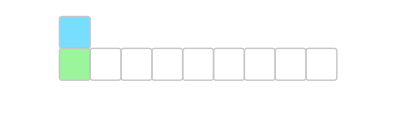

Sometimes an algo is written not with one loop but with two nested loops (the algorithm is still linear). I call this technique *fast-forwarding*.

In [ ]:
lst = list(range(100))

for idx1 in lst:
  while idx2 < len(lst) and ...:
    ...
    idx2 += 1
  ...

Sometimes two pointers traverse two separate arrays.

In [ ]:
lst1 = list(range(100))
lst2 = list(range(200))

idx1, idx2 = 0, 0

while idx1 < len(lst1) and idx2 < len(lst2):
  if ...:
    idx1 += 1
  else:
    idx2 += 1


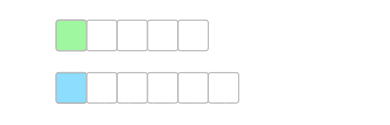

Another important two-pointer technique involves two pointers that move towards each other from the opposite sides of an array.

In [ ]:
lst = list(range(100))

idx1, idx2 = 0, len(lst) - 1

while idx1 < idx2:
  if ...:
    idx1 += 1
  else:
    idx2 -= 1


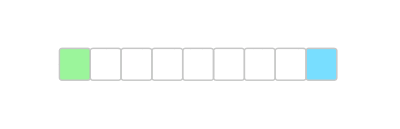

Sometimes the behaviour of pointers is more complex. For example in U-turn algorithm the `j`-poiners starts by advancing backwards an then changes the direction.

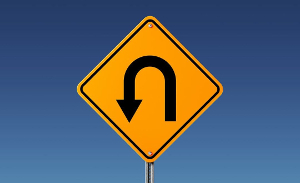




In [ ]:
idx1, idx2 = 0, len(lst) - 1

while ...:
  idx2 -= 1

while ...:
  if ...:
    idx1 += 1
  else:
    idx2 += 1


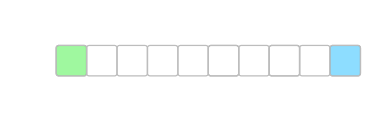

# Problems:

One of the simplest linear algorithms on an array with one additional variable finds `maximum/minimum` of an array.

## Calculate max

```
Given an array nums of none-negative integers, return the maximum element
```

In [ ]:
# time: O(N); space: O(1)
def maximum(nums):
  out = -1
  for n in nums:
    out = max(out, n)
  return out

In [ ]:
# time: O(N); space: O(1)
def maximum(nums):
  out = nums[0]
  for n in nums:
    out = max(out, n)
  return out

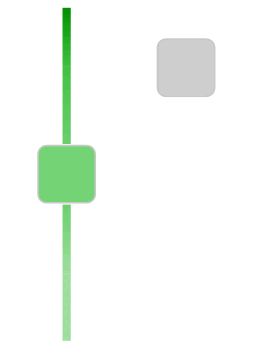

In fact any **fold** (also termed **reduce**, **accumulate**, **aggregate**, **compress**, or **inject**) algorithm can be implemented like this. Basically these algorithms count stuff, find stuff, test preposition.

In [3]:
from operator import add

def reduce(nums, f, start):
  out = start
  for n in nums:
    out = f(out, n)
  return out


print(reduce([1,2,4,6], max, -1))
print(reduce([1,2,4,6], min, 1000))
print(reduce([1,2,4,6], add, 0))
print(reduce([1,2,4,6], lambda out,n : out and n<3, True))
print(reduce([1,2,4,6], lambda out,n : out or n==4, False))


6
1
13
False
True


This is the iterative versions of the recursive algorithms we've seen in the previous lecture.

# Count downhill segments

[2645. Minimum Additions to Make Valid String](https://leetcode.com/problems/minimum-additions-to-make-valid-string/)

```
Given a string word to which you can insert letters "a", "b" or "c" anywhere and any number of times,
return the minimum number of letters that must be inserted so that word becomes valid.
A string is called valid if it can be formed by concatenating the string "abc" several times.

Example 1:
Input: word = "b"
Output: 2
Explanation: Insert the letter "a" right before "b", and the letter "c" right next to "a" to obtain the valid string "abc".

Example 2:
Input: word = "aaa"
Output: 6
Explanation: Insert letters "b" and "c" next to each "a" to obtain the valid string "abcabcabc".

Example 3:
Input: word = "abc"
Output: 0
Explanation: word is already valid. No modifications are needed.

Constraints:
1 <= word.length <= 50
word consists of letters "a", "b" and "c" only.
```

This is the problem that could be reduced to a simple one-auxilary-variable linear algorithm that counts downhill/flat segments.

In [ ]:
#@title Count downhill segments
%%html

<svg width="224mm" height="52mm" version="1.1" viewBox="0 0 229.97 53.102" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:ns38="http://www.iki.fi/pav/software/textext/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(-16.422 -11.484)">
  <path d="m246.29 47.283h-222.07" style="fill:none;stroke-dasharray:1.12214, 1.12214;stroke-opacity:.37879;stroke-width:.37405;stroke:#000000"/>
  <path d="m246.34 14.137h-222.23" style="fill:none;stroke-dasharray:1.12214, 1.12214;stroke-opacity:.37879;stroke-width:.37405;stroke:#000000"/>
  <path d="m246.39 30.465h-224.76" style="fill:none;stroke-dasharray:1.12214, 1.12214;stroke-opacity:.37879;stroke-width:.37405;stroke:#000000"/>
  <path d="m32.408 13.948 18.254 33.401 17.62-33.41 35.522 33.344 17.581-16.757 17.989 16.767 35.407-33.244 18.183 0.12689 17.742-0.2002 17.759 16.413" style="fill:none;stroke-opacity:.27652;stroke-width:.42333;stroke:#000000"/>
  <circle cx="68.196" cy="13.735" r="2.0907" style="fill:#cdcdcd;opacity:.999"/>
  <circle cx="85.727" cy="30.421" r="2.0907" style="fill:#cdcdcd;opacity:.999"/>
  <circle cx="157.2" cy="30.285" r="2.0907" style="fill:#cdcdcd;opacity:.999"/>
  <circle cx="174.95" cy="13.419" r="2.0907" style="fill:#cdcdcd;opacity:.999"/>
  <circle cx="210.77" cy="13.56" r="2.0907" style="fill:#cdcdcd;opacity:.999"/>
  <circle cx="228.31" cy="30.174" r="2.0907" style="fill:#cdcdcd;opacity:.999"/>
  <g transform="matrix(.82755 0 0 .82755 80.675 -31.655)" style="fill-opacity:.54167;fill:#000000" ns38:alignment="middle center" ns38:jacobian_sqrt="1.0" ns38:pdfconverter="inkscape" ns38:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns38:scale="2.834645669291339" ns38:texconverter="pdflatex" ns38:text="$$local max$$\n$$local min$$\n$$buy/sell sequence$$\n$$profit$$" ns38:version="1.1.0"></g>
  <rect transform="matrix(-.72478 -.68898 .72181 -.69209 0 0)" x="-177.61" y="134.4" width="19.062" height="2.1153" style="fill:#ffb4b6;opacity:.999;stroke-width:.95126"/>
  <circle cx="192.74" cy="13.937" r="2.0907" style="fill:#cdcdcd;opacity:.999"/>
  <circle cx="32.368" cy="13.704" r="2.0907" style="fill:#cdcdcd;opacity:.999"/>
  <text x="30.628889" y="64.4748" style="fill-opacity:.64773;fill:#000000;font-family:'Courier New';font-size:5.9091px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.14773;word-spacing:0px" xml:space="preserve"><tspan x="30.628889" y="64.4748" style="fill-opacity:.64773;fill:#000000;stroke-width:.14773">c</tspan></text>
  <text x="48.883209" y="63.963417" style="fill-opacity:.64773;fill:#000000;font-family:'Courier New';font-size:5.9091px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.14773;word-spacing:0px" xml:space="preserve"><tspan x="48.883209" y="63.963417" style="fill-opacity:.64773;fill:#000000;stroke-width:.14773">a</tspan></text>
  <text x="66.41478" y="63.975967" style="fill-opacity:.64773;fill:#000000;font-family:'Courier New';font-size:5.9091px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.14773;word-spacing:0px" xml:space="preserve"><tspan x="66.41478" y="63.975967" style="fill-opacity:.64773;fill:#000000;stroke-width:.14773">c</tspan></text>
  <text x="84.431717" y="64.055199" style="fill-opacity:.64773;fill:#000000;font-family:'Courier New';font-size:5.9091px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.14773;word-spacing:0px" xml:space="preserve"><tspan x="84.431717" y="64.055199" style="fill-opacity:.64773;fill:#000000;stroke-width:.14773">b</tspan></text>
  <text x="101.7657" y="64.016754" style="fill-opacity:.64773;fill:#000000;font-family:'Courier New';font-size:5.9091px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.14773;word-spacing:0px" xml:space="preserve"><tspan x="101.7657" y="64.016754" style="fill-opacity:.64773;fill:#000000;stroke-width:.14773">a</tspan></text>
  <text x="119.74812" y="64.101486" style="fill-opacity:.64773;fill:#000000;font-family:'Courier New';font-size:5.9091px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.14773;word-spacing:0px" xml:space="preserve"><tspan x="119.74812" y="64.101486" style="fill-opacity:.64773;fill:#000000;stroke-width:.14773">b</tspan></text>
  <text x="137.85487" y="63.95713" style="fill-opacity:.64773;fill:#000000;font-family:'Courier New';font-size:5.9091px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.14773;word-spacing:0px" xml:space="preserve"><tspan x="137.85487" y="63.95713" style="fill-opacity:.64773;fill:#000000;stroke-width:.14773">a</tspan></text>
  <text x="155.88589" y="63.964493" style="fill-opacity:.64773;fill:#000000;font-family:'Courier New';font-size:5.9091px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.14773;word-spacing:0px" xml:space="preserve"><tspan x="155.88589" y="63.964493" style="fill-opacity:.64773;fill:#000000;stroke-width:.14773">b</tspan></text>
  <text x="173.60294" y="64.087357" style="fill-opacity:.64773;fill:#000000;font-family:'Courier New';font-size:5.9091px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.14773;word-spacing:0px" xml:space="preserve"><tspan x="173.60294" y="64.087357" style="fill-opacity:.64773;fill:#000000;stroke-width:.14773">c</tspan></text>
  <text x="191.03111" y="63.951935" style="fill-opacity:.64773;fill:#000000;font-family:'Courier New';font-size:5.9091px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.14773;word-spacing:0px" xml:space="preserve"><tspan x="191.03111" y="63.951935" style="fill-opacity:.64773;fill:#000000;stroke-width:.14773">c</tspan></text>
  <text x="208.85637" y="63.950623" style="fill-opacity:.64773;fill:#000000;font-family:'Courier New';font-size:5.9091px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.14773;word-spacing:0px" xml:space="preserve"><tspan x="208.85637" y="63.950623" style="fill-opacity:.64773;fill:#000000;stroke-width:.14773">c</tspan></text>
  <text x="226.8475" y="64.005531" style="fill-opacity:.64773;fill:#000000;font-family:'Courier New';font-size:5.9091px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.14773;word-spacing:0px" xml:space="preserve"><tspan x="226.8475" y="64.005531" style="fill-opacity:.64773;fill:#000000;stroke-width:.14773">b</tspan></text>
  <g transform="matrix(.57314 0 0 .57314 16.422 44.604)" ns38:alignment="middle center" ns38:jacobian_sqrt="3.77952" ns38:pdfconverter="inkscape" ns38:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns38:scale="2.834645669291339" ns38:texconverter="pdflatex" ns38:text="$abc$" ns38:version="1.1.0">
   <defs id="id-79450ad8-86dd-455d-aa01-9d4c78a77d7d"></defs>
   <g transform="translate(-149.12 -127.84)">
    <g style="fill:#000000">
     <g transform="translate(148.71 134.76)">
      <path id="id-44753c85-18be-4ad4-9626-cbe637853d6d" d="m3.7188-3.7656c-0.1875-0.375-0.46875-0.64062-0.92188-0.64062-1.1562 0-2.3906 1.4688-2.3906 2.9219 0 0.9375 0.54688 1.5938 1.3125 1.5938 0.20312 0 0.70312-0.046875 1.2969-0.75 0.078125 0.42188 0.4375 0.75 0.90625 0.75 0.35938 0 0.57812-0.23438 0.75-0.54688 0.15625-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.14062 0.1875-0.17188 0.64062-0.34375 1.2344-0.75 1.2344-0.28125 0-0.29688-0.26562-0.29688-0.45312 0-0.21875 0.015625-0.3125 0.125-0.75 0.10938-0.40625 0.125-0.51562 0.21875-0.89062l0.35938-1.3906c0.0625-0.28125 0.0625-0.29688 0.0625-0.34375 0-0.17188-0.10938-0.26562-0.28125-0.26562-0.25 0-0.39062 0.21875-0.42188 0.4375zm-0.64062 2.5781c-0.0625 0.1875-0.0625 0.20312-0.20312 0.375-0.4375 0.54688-0.84375 0.70312-1.125 0.70312-0.5 0-0.64062-0.54688-0.64062-0.9375 0-0.5 0.3125-1.7188 0.54688-2.1875 0.3125-0.57812 0.75-0.95312 1.1562-0.95312 0.64062 0 0.78125 0.8125 0.78125 0.875s-0.015625 0.125-0.03125 0.17188z"/>
     </g>
     <g transform="translate(149 106.48)">
      <path id="id-e5e9f42b-df72-436d-876f-029f0333cc5b" d="m2.375-6.8125s0-0.10938-0.125-0.10938c-0.21875 0-0.95312 0.078125-1.2188 0.10938-0.078125 0-0.1875 0.015625-0.1875 0.1875 0 0.125 0.09375 0.125 0.25 0.125 0.46875 0 0.48438 0.0625 0.48438 0.17188 0 0.0625-0.078125 0.40625-0.125 0.60938l-0.82812 3.25c-0.10938 0.5-0.15625 0.67188-0.15625 1.0156 0 0.9375 0.53125 1.5625 1.2656 1.5625 1.1719 0 2.4062-1.4844 2.4062-2.9219 0-0.90625-0.53125-1.5938-1.3281-1.5938-0.45312 0-0.875 0.29688-1.1719 0.59375zm-0.92188 3.7656c0.046875-0.21875 0.046875-0.23438 0.14062-0.34375 0.48438-0.64062 0.9375-0.79688 1.2031-0.79688 0.35938 0 0.625 0.29688 0.625 0.9375 0 0.59375-0.32812 1.7344-0.51562 2.1094-0.32812 0.67188-0.78125 1.0312-1.1719 1.0312-0.34375 0-0.67188-0.26562-0.67188-1 0-0.20312 0-0.39062 0.15625-1.0156z"/>
     </g>
     <g transform="translate(149.06 77.745)">
      <path d="m3.9531-3.7812c-0.17188 0-0.29688 0-0.4375 0.125-0.17188 0.15625-0.1875 0.32812-0.1875 0.39062 0 0.25 0.1875 0.35938 0.375 0.35938 0.28125 0 0.54688-0.25 0.54688-0.64062 0-0.48438-0.46875-0.85938-1.1719-0.85938-1.3438 0-2.6719 1.4219-2.6719 2.8281 0 0.90625 0.57812 1.6875 1.625 1.6875 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.625 0-0.90625-0.48438-0.90625-1.0938 0-0.40625 0.20312-1.375 0.54688-1.9844 0.3125-0.57812 0.85938-1 1.4062-1 0.32812 0 0.71875 0.125 0.85938 0.40625z"/>
     </g>
    </g>
   </g>
  </g>
  <circle cx="50.606" cy="46.961" r="2.0907" style="fill:#cdcdcd;opacity:.999"/>
  <rect transform="matrix(-1 .00069986 .031522 -.9995 0 0)" x="-208.75" y="-15.392" width="13.099" height="2.1141" style="fill:#ffb4b6;opacity:.999;stroke-width:.78834"/>
  <rect transform="matrix(-1 .00069986 .031522 -.9995 0 0)" x="-190.73" y="-15.338" width="13.099" height="2.1141" style="fill:#ffb4b6;opacity:.999;stroke-width:.78834"/>
  <rect transform="matrix(-1 .00069986 .031522 -.9995 0 0)" x="-192.66" y="-60.099" width="13.099" height="2.1141" style="fill-opacity:.31061;fill:#ff0000;opacity:.999;stroke-width:.78834"/>
  <rect transform="matrix(-1 .00069986 .031522 -.9995 0 0)" x="-211.04" y="-60.215" width="13.099" height="2.1141" style="fill-opacity:.31061;fill:#ff0000;opacity:.999;stroke-width:.78834"/>
  <rect transform="matrix(-1 .00069986 .031522 -.9995 0 0)" x="-228.11" y="-60.268" width="13.099" height="2.1141" style="fill-opacity:.31061;fill:#ff0000;opacity:.999;stroke-width:.78834"/>
  <rect transform="matrix(-1 .00069986 .031522 -.9995 0 0)" x="-246.04" y="-60.255" width="13.099" height="2.1141" style="fill-opacity:.31061;fill:#ff0000;opacity:.999;stroke-width:.78834"/>
  <rect transform="matrix(-1 .00069986 .031522 -.9995 0 0)" x="-139" y="-60.685" width="13.099" height="2.1141" style="fill-opacity:.31061;fill:#ff0000;opacity:.999;stroke-width:.78834"/>
  <rect transform="matrix(-.73505 -.67802 .70306 -.71113 0 0)" x="-130.04" y="58.949" width="20.042" height="1.8657" style="fill:#ffb4b6;opacity:.999;stroke-width:.91606"/>
  <rect transform="matrix(-1 .00069986 .031522 -.9995 0 0)" x="-84.674" y="-60.023" width="13.099" height="2.1141" style="fill-opacity:.31061;fill:#ff0000;opacity:.999;stroke-width:.78834"/>
  <rect transform="matrix(-1 .00069986 .031522 -.9995 0 0)" x="-102.9" y="-60.139" width="13.099" height="2.1141" style="fill-opacity:.31061;fill:#ff0000;opacity:.999;stroke-width:.78834"/>
  <rect transform="matrix(-1 .00069986 .031522 -.9995 0 0)" x="-49.482" y="-60.483" width="13.099" height="2.1141" style="fill-opacity:.31061;fill:#ff0000;opacity:.999;stroke-width:.78834"/>
  <rect transform="matrix(-.72633 -.68735 .72171 -.69219 0 0)" x="-79.04" y="35.784" width="19.525" height="2.1155" style="fill:#ffb4b6;opacity:.999;stroke-width:.96278"/>
  <rect transform="matrix(-.72633 -.68735 .72171 -.69219 0 0)" x="-103.37" y="35.941" width="19.525" height="2.1155" style="fill:#ffb4b6;opacity:.999;stroke-width:.96278"/>
  <rect transform="matrix(-.47777 -.87848 .90949 -.41572 0 0)" x="-61.296" y="21.016" width="32.241" height="2.1182" style="fill:#ffb4b6;opacity:.999;stroke-width:1.238"/>
  <circle cx="139.37" cy="47.245" r="2.0907" style="fill:#cdcdcd;opacity:.999"/>
  <circle cx="121.35" cy="30.224" r="2.0907" style="fill:#cdcdcd;opacity:.999"/>
  <circle cx="103.68" cy="47.21" r="2.0907" style="fill:#cdcdcd;opacity:.999"/>
 </g>
</svg>


In [ ]:
def addMinimum(word):
  n = 1
  for i in range(1, len(word)):
    n += word[i]<=word[i-1]
  return 3*n-len(word)

So basically this problem is a simple counting algorithm obfuscated by convoluted problem desciption.

Here's another problem that counts stuff in an array.

## Add up uphills
[122. Best Time to Buy and Sell Stock II](https://leetcode.com/problems/best-time-to-buy-and-sell-stock-ii/discuss/1050256/greedy)

```
You are given an integer array prices where prices[i] is the price of a given stock on the ith day.
On each day, you may decide to buy and/or sell the stock. You can only hold at most one share of the stock at any time.
However, you can buy it then immediately sell it on the same day. Find and return the maximum profit you can achieve.

Example 1:
Input: prices = [7,1,5,3,6,4]
Output: 7
Explanation: Buy on day 2 (price = 1) and sell on day 3 (price = 5), profit = 5-1 = 4.
Then buy on day 4 (price = 3) and sell on day 5 (price = 6), profit = 6-3 = 3.
Total profit is 4 + 3 = 7.

Example 2:
Input: prices = [1,2,3,4,5]
Output: 4
Explanation: Buy on day 1 (price = 1) and sell on day 5 (price = 5), profit = 5-1 = 4.
Total profit is 4.

Example 3:
Input: prices = [7,6,4,3,1]
Output: 0
Explanation: There is no way to make a positive profit, so we never buy the stock to achieve the maximum profit of 0.

Constraints:
1 <= prices.length <= 3 * 10^4
0 <= prices[i] <= 10^4

```



In [ ]:
#@title How to Become a Millionaire
%%html

<?xml version="1.0" encoding="UTF-8"?>
<svg width="195mm" height="99mm" version="1.1" viewBox="0 0 229.73 116.32" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:ns38="http://www.iki.fi/pav/software/textext/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <defs>
  <marker id="marker2637" style="overflow:visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-opacity:.61742;fill-rule:evenodd;fill:#00a600;stroke-width:1pt;stroke:#00b700"/>
  </marker>
  <marker id="marker2637-6" style="overflow:visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-opacity:.68182;fill-rule:evenodd;fill:#00af00;stroke-opacity:.68182;stroke-width:1pt;stroke:#00af00"/>
  </marker>
  <marker id="marker2637-6-2" style="overflow:visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-opacity:.68182;fill-rule:evenodd;fill:#ff0000;stroke-opacity:.68182;stroke-width:1pt;stroke:#ff0000"/>
  </marker>
  <marker id="marker2637-6-2-4" style="overflow:visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-opacity:.61742;fill-rule:evenodd;fill:#00a600;stroke-width:1pt;stroke:#00b700"/>
  </marker>
  <marker id="marker2637-6-2-4-7" style="overflow:visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-opacity:.68182;fill-rule:evenodd;fill:#ff0000;stroke-opacity:.68182;stroke-width:1pt;stroke:#ff0000"/>
  </marker>
  <marker id="marker2637-6-2-4-3" style="overflow:visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-opacity:.68182;fill-rule:evenodd;fill:#ff0000;stroke-opacity:.68182;stroke-width:1pt;stroke:#ff0000"/>
  </marker>
 </defs>
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(-.78998 12.411)">
  <path d="m32.382 13.534 17.841-16.699 53.581 50.448 17.581-16.757 17.989 16.767 53.434-50.511 35.656 33.606" style="fill:none;stroke-opacity:.27652;stroke-width:.42333;stroke:#000000"/>
  <path d="m32.174 16.395 0.09449 53.673" style="fill:none;stroke-dasharray:1.98438, 1.98438;stroke-opacity:.25;stroke-width:.66146;stroke:#000000"/>
  <path d="m50.459 1.6531 0.09408 68.51" style="fill:none;stroke-dasharray:1.98438, 1.98438;stroke-opacity:.25;stroke-width:.66146;stroke:#000000"/>
  <path d="m68.217 16.739 0.09449 53.673" style="fill:none;stroke-dasharray:1.98438, 1.98438;stroke-opacity:.25;stroke-width:.66146;stroke:#000000"/>
  <path d="m86.234 33.9 0.09408 37.409" style="fill:none;stroke-dasharray:1.98438, 1.98438;stroke-opacity:.25;stroke-width:.66146;stroke:#000000"/>
  <path d="m228.26 32.56 0.0945 38.409" style="fill:none;stroke-dasharray:1.98438, 1.98438;stroke-opacity:.25;stroke-width:.66146;stroke:#000000"/>
  <path d="m210.67 15.805 0.0782 54.716" style="fill:none;stroke-dasharray:1.98438, 1.98438;stroke-opacity:.25;stroke-width:.66146;stroke:#000000"/>
  <path d="m192.73 0.49486 0.07788 70.152" style="fill:none;stroke-dasharray:1.98438, 1.98438;stroke-opacity:.25;stroke-width:.66146;stroke:#000000"/>
  <path d="m175.14 15.877 0.0782 54.323" style="fill:none;stroke-dasharray:1.98438, 1.98438;stroke-opacity:.25;stroke-width:.66146;stroke:#000000"/>
  <path d="m139.5 49.85 0.0791 20.463" style="fill:none;stroke-dasharray:1.98438, 1.98438;stroke-opacity:.25;stroke-width:.66146;stroke:#000000"/>
  <path d="m157.25 32.714 0.0778 37.708" style="fill:none;stroke-dasharray:1.98438, 1.98438;stroke-opacity:.25;stroke-width:.66146;stroke:#000000"/>
  <path d="m121.42 33.324 0.0778 38.259" style="fill:none;stroke-dasharray:1.98438, 1.98438;stroke-opacity:.25;stroke-width:.66146;stroke:#000000"/>
  <path d="m103.57 50.108 0.0785 20.617" style="fill:none;stroke-dasharray:1.98438, 1.98438;stroke-opacity:.25;stroke-width:.66146;stroke:#000000"/>
  <circle cx="157.49" cy="74.663" r="2.0907" style="fill-opacity:.17424;fill:#000000;opacity:.999"/>
  <circle cx="175.17" cy="74.773" r="2.0907" style="fill-opacity:.17424;fill:#000000;opacity:.999"/>
  <circle cx="210.72" cy="74.305" r="2.0907" style="fill-opacity:.17424;fill:#000000;opacity:.999"/>
  <circle cx="228.42" cy="74.605" r="2.0907" style="fill-opacity:.17424;fill:#000000;opacity:.999"/>
  <circle cx="68.33" cy="74.505" r="2.0907" style="fill-opacity:.17424;fill:#000000;opacity:.999"/>
  <circle cx="86.304" cy="74.572" r="2.0907" style="fill-opacity:.17424;fill:#000000;opacity:.999"/>
  <circle cx="103.51" cy="74.271" r="2.0907" style="fill-opacity:.55682;fill:#00ac00;opacity:.999"/>
  <circle cx="32.573" cy="75.476" r="2.0907" style="fill-opacity:.55682;fill:#00ac00;opacity:.999"/>
  <circle cx="139.36" cy="47.277" r="2.0907" style="fill-opacity:.55682;fill:#00ac00;opacity:.999"/>
  <circle cx="103.68" cy="47.144" r="2.0907" style="fill-opacity:.55682;fill:#00ac00;opacity:.999"/>
  <circle cx="121.32" cy="74.94" r="2.0907" style="fill-opacity:.53788;fill:#ff0000;opacity:.999"/>
  <circle cx="121.38" cy="30.239" r="2.0907" style="fill-opacity:.53788;fill:#ff0000;opacity:.999"/>
  <circle cx="50.884" cy="74.84" r="2.0907" style="fill-opacity:.53788;fill:#ff0000;opacity:.999"/>
  <circle cx="50.133" cy="-3.2414" r="2.0907" style="fill-opacity:.53788;fill:#ff0000;opacity:.999"/>
  <circle cx="139.52" cy="74.415" r="2.0907" style="fill-opacity:.55682;fill:#00ac00;opacity:.999"/>
  <circle cx="192.84" cy="75.107" r="2.0907" style="fill-opacity:.53788;fill:#ff0000;opacity:.999"/>
  <circle cx="192.81" cy="-3.1178" r="2.0907" style="fill-opacity:.53788;fill:#ff0000;opacity:.999"/>
  <circle cx="32.516" cy="13.534" r="2.0907" style="fill-opacity:.55682;fill:#00ac00;opacity:.999"/>
  <circle cx="68.196" cy="13.735" r="2.0907" style="fill-opacity:.17424;fill:#000000;opacity:.999"/>
  <circle cx="86.404" cy="31.007" r="2.0907" style="fill-opacity:.17424;fill:#000000;opacity:.999"/>
  <circle cx="157.12" cy="30.233" r="2.0907" style="fill-opacity:.17424;fill:#000000;opacity:.999"/>
  <circle cx="174.95" cy="13.419" r="2.0907" style="fill-opacity:.17424;fill:#000000;opacity:.999"/>
  <circle cx="210.77" cy="13.56" r="2.0907" style="fill-opacity:.17424;fill:#000000;opacity:.999"/>
  <circle cx="228.31" cy="30.174" r="2.0907" style="fill-opacity:.17424;fill:#000000;opacity:.999"/>
  <rect transform="matrix(.72558 -.68814 .66262 .74896 0 0)" x="75.259" y="129.4" width="69.14" height="2.0776" style="fill-opacity:.31061;fill:#00ac00;opacity:.999"/>
  <rect transform="matrix(.72558 -.68814 .66262 .74896 0 0)" x="48.688" y="104.66" width="20.038" height="2.2237" style="fill-opacity:.31061;fill:#00ac00;opacity:.999"/>
  <rect transform="matrix(.72558 -.68814 .66262 .74896 0 0)" x="17.526" y="31.16" width="20.038" height="2.2237" style="fill-opacity:.31061;fill:#00ac00;opacity:.999"/>
  <rect transform="matrix(1 .0018231 -.042417 .9991 0 0)" x="107.06" y="69.496" width="17.018" height="1.9252" style="fill-opacity:.31061;fill:#00ac00;opacity:.999"/>
  <rect transform="matrix(1 .0018084 -.046582 .99891 0 0)" x="143.35" y="69.48" width="52.2" height="1.8519" style="fill-opacity:.31061;fill:#00ac00;opacity:.999"/>
  <rect transform="matrix(1 .0016965 -.045578 .99896 0 0)" x="36.196" y="69.818" width="17.018" height="1.7917" style="fill-opacity:.31061;fill:#00ac00;opacity:.999"/>
  <g transform="matrix(.82755 0 0 .82755 80.675 -31.655)" style="fill-opacity:.54167;fill:#000000" ns38:alignment="middle center" ns38:jacobian_sqrt="1.0" ns38:pdfconverter="inkscape" ns38:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns38:scale="2.834645669291339" ns38:texconverter="pdflatex" ns38:text="$$local max$$\n$$local min$$\n$$buy/sell sequence$$\n$$profit$$" ns38:version="1.1.0">
   <g transform="translate(-268.48 -139.8)" style="fill-opacity:.61742;fill:#000000">
    <g transform="matrix(.86719 0 0 .86719 -20.711 41.82)" style="fill-opacity:.61742;fill:#000000">
     <g transform="translate(285.4 146.72)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-6b8ee89d-d577-418b-be8c-85c84faddf8f" d="m2.5781-6.8125s0-0.10938-0.14062-0.10938c-0.21875 0-0.95312 0.078125-1.2188 0.10938-0.078125 0-0.1875 0.015625-0.1875 0.20312 0 0.10938 0.10938 0.10938 0.25 0.10938 0.48438 0 0.5 0.09375 0.5 0.17188l-0.03125 0.20312-1.2656 4.9844c-0.03125 0.10938-0.046875 0.17188-0.046875 0.32812 0 0.57812 0.4375 0.92188 0.90625 0.92188 0.32812 0 0.57812-0.20312 0.75-0.5625 0.17188-0.375 0.29688-0.95312 0.29688-0.96875 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.125 0.1875-0.17188 0.64062-0.35938 1.2344-0.76562 1.2344-0.29688 0-0.29688-0.3125-0.29688-0.45312 0-0.25 0.015625-0.29688 0.0625-0.48438z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <g transform="matrix(.86719 0 0 .86719 -20.711 41.82)" style="fill-opacity:.61742;fill:#000000">
     <g transform="translate(288.57,146.72)" style="fill-opacity:.61742;fill:#000000">
      <path d="m4.6719-2.7188c0-1.0469-0.6875-1.6875-1.5938-1.6875-1.3281 0-2.6719 1.4219-2.6719 2.8281 0 0.98438 0.67188 1.6875 1.5938 1.6875 1.3281 0 2.6719-1.375 2.6719-2.8281zm-2.6562 2.6094c-0.4375 0-0.875-0.3125-0.875-1.0938 0-0.48438 0.26562-1.5625 0.57812-2.0625 0.5-0.76562 1.0781-0.92188 1.3594-0.92188 0.57812 0 0.875 0.48438 0.875 1.0781 0 0.39062-0.20312 1.4375-0.57812 2.0781-0.35938 0.57812-0.90625 0.92188-1.3594 0.92188z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(293.4 146.72)" style="fill-opacity:.61742;fill:#000000">
      <path d="m3.9531-3.7812c-0.17188 0-0.29688 0-0.4375 0.125-0.17188 0.15625-0.1875 0.32812-0.1875 0.39062 0 0.25 0.1875 0.35938 0.375 0.35938 0.28125 0 0.54688-0.25 0.54688-0.64062 0-0.48438-0.46875-0.85938-1.1719-0.85938-1.3438 0-2.6719 1.4219-2.6719 2.8281 0 0.90625 0.57812 1.6875 1.625 1.6875 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.625 0-0.90625-0.48438-0.90625-1.0938 0-0.40625 0.20312-1.375 0.54688-1.9844 0.3125-0.57812 0.85938-1 1.4062-1 0.32812 0 0.71875 0.125 0.85938 0.40625z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(297.71 146.72)" style="fill-opacity:.61742;fill:#000000">
      <path d="m3.7188-3.7656c-0.1875-0.375-0.46875-0.64062-0.92188-0.64062-1.1562 0-2.3906 1.4688-2.3906 2.9219 0 0.9375 0.54688 1.5938 1.3125 1.5938 0.20312 0 0.70312-0.046875 1.2969-0.75 0.078125 0.42188 0.4375 0.75 0.90625 0.75 0.35938 0 0.57812-0.23438 0.75-0.54688 0.15625-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.14062 0.1875-0.17188 0.64062-0.34375 1.2344-0.75 1.2344-0.28125 0-0.29688-0.26562-0.29688-0.45312 0-0.21875 0.015625-0.3125 0.125-0.75 0.10938-0.40625 0.125-0.51562 0.21875-0.89062l0.35938-1.3906c0.0625-0.28125 0.0625-0.29688 0.0625-0.34375 0-0.17188-0.10938-0.26562-0.28125-0.26562-0.25 0-0.39062 0.21875-0.42188 0.4375zm-0.64062 2.5781c-0.0625 0.1875-0.0625 0.20312-0.20312 0.375-0.4375 0.54688-0.84375 0.70312-1.125 0.70312-0.5 0-0.64062-0.54688-0.64062-0.9375 0-0.5 0.3125-1.7188 0.54688-2.1875 0.3125-0.57812 0.75-0.95312 1.1562-0.95312 0.64062 0 0.78125 0.8125 0.78125 0.875s-0.015625 0.125-0.03125 0.17188z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(302.98 146.72)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-65fc5ee7-283f-44b0-a784-1fcd9910a67f" d="m2.5781-6.8125s0-0.10938-0.14062-0.10938c-0.21875 0-0.95312 0.078125-1.2188 0.10938-0.078125 0-0.1875 0.015625-0.1875 0.20312 0 0.10938 0.10938 0.10938 0.25 0.10938 0.48438 0 0.5 0.09375 0.5 0.17188l-0.03125 0.20312-1.2656 4.9844c-0.03125 0.10938-0.046875 0.17188-0.046875 0.32812 0 0.57812 0.4375 0.92188 0.90625 0.92188 0.32812 0 0.57812-0.20312 0.75-0.5625 0.17188-0.375 0.29688-0.95312 0.29688-0.96875 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.125 0.1875-0.17188 0.64062-0.35938 1.2344-0.76562 1.2344-0.29688 0-0.29688-0.3125-0.29688-0.45312 0-0.25 0.015625-0.29688 0.0625-0.48438z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <g transform="translate(-70.11 20.185)" style="fill-opacity:.61742;fill:#000000">
     <g transform="matrix(.86719 0 0 .86719 316.46 148.87)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-1001ec15-2277-4578-bef7-033e6d03ba1a" d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0-0.015625 0.125-0.48438 0.1875-0.73438l0.21875-0.89062c0.046875-0.23438 0.10938-0.45312 0.17188-0.67188 0.03125-0.17188 0.10938-0.46875 0.125-0.5 0.14062-0.3125 0.67188-1.2188 1.625-1.2188 0.45312 0 0.53125 0.375 0.53125 0.70312 0 0.25-0.0625 0.53125-0.14062 0.82812l-0.28125 1.1562-0.20312 0.75c-0.03125 0.20312-0.125 0.54688-0.125 0.59375 0 0.17188 0.14062 0.26562 0.28125 0.26562 0.3125 0 0.375-0.25 0.45312-0.5625 0.14062-0.5625 0.51562-2.0156 0.59375-2.4062 0.03125-0.125 0.5625-1.3281 1.6562-1.3281 0.42188 0 0.53125 0.34375 0.53125 0.70312 0 0.5625-0.42188 1.7031-0.625 2.2344-0.078125 0.23438-0.125 0.34375-0.125 0.54688 0 0.46875 0.34375 0.8125 0.8125 0.8125 0.9375 0 1.3125-1.4531 1.3125-1.5312 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.09375 0.03125-0.14062 0.1875-0.15625 0.53125-0.46875 1.2344-1.0156 1.2344-0.17188 0-0.25-0.09375-0.25-0.32812 0-0.25 0.09375-0.48438 0.1875-0.70312 0.1875-0.53125 0.60938-1.625 0.60938-2.2031 0-0.64062-0.40625-1.0625-1.1562-1.0625-0.73438 0-1.25 0.4375-1.625 0.96875 0-0.125-0.03125-0.46875-0.3125-0.70312-0.25-0.21875-0.5625-0.26562-0.8125-0.26562-0.90625 0-1.3906 0.64062-1.5625 0.875-0.046875-0.57812-0.46875-0.875-0.92188-0.875s-0.64062 0.39062-0.73438 0.5625c-0.17188 0.35938-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.15625 0 0.29688 0.078125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="matrix(.86719 0 0 .86719 324.04 148.87)" style="fill-opacity:.61742;fill:#000000">
      <path d="m3.7188-3.7656c-0.1875-0.375-0.46875-0.64062-0.92188-0.64062-1.1562 0-2.3906 1.4688-2.3906 2.9219 0 0.9375 0.54688 1.5938 1.3125 1.5938 0.20312 0 0.70312-0.046875 1.2969-0.75 0.078125 0.42188 0.4375 0.75 0.90625 0.75 0.35938 0 0.57812-0.23438 0.75-0.54688 0.15625-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.14062 0.1875-0.17188 0.64062-0.34375 1.2344-0.75 1.2344-0.28125 0-0.29688-0.26562-0.29688-0.45312 0-0.21875 0.015625-0.3125 0.125-0.75 0.10938-0.40625 0.125-0.51562 0.21875-0.89062l0.35938-1.3906c0.0625-0.28125 0.0625-0.29688 0.0625-0.34375 0-0.17188-0.10938-0.26562-0.28125-0.26562-0.25 0-0.39062 0.21875-0.42188 0.4375zm-0.64062 2.5781c-0.0625 0.1875-0.0625 0.20312-0.20312 0.375-0.4375 0.54688-0.84375 0.70312-1.125 0.70312-0.5 0-0.64062-0.54688-0.64062-0.9375 0-0.5 0.3125-1.7188 0.54688-2.1875 0.3125-0.57812 0.75-0.95312 1.1562-0.95312 0.64062 0 0.78125 0.8125 0.78125 0.875s-0.015625 0.125-0.03125 0.17188z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="matrix(.86719 0 0 .86719 328.61 148.87)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-d43ee97a-5b75-4b57-a487-c712ba42b8de" d="m3.3281-3.0156c0.0625-0.25 0.29688-1.1719 0.98438-1.1719 0.046875 0 0.29688 0 0.5 0.125-0.28125 0.0625-0.46875 0.29688-0.46875 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375 0.21875 0 0.53125-0.17188 0.53125-0.57812 0-0.51562-0.57812-0.65625-0.92188-0.65625-0.57812 0-0.92188 0.53125-1.0469 0.75-0.25-0.65625-0.78125-0.75-1.0781-0.75-1.0312 0-1.6094 1.2812-1.6094 1.5312 0 0.10938 0.10938 0.10938 0.125 0.10938 0.078125 0 0.10938-0.03125 0.125-0.10938 0.34375-1.0625 1-1.3125 1.3438-1.3125 0.1875 0 0.53125 0.09375 0.53125 0.67188 0 0.3125-0.17188 0.96875-0.53125 2.375-0.15625 0.60938-0.51562 1.0312-0.95312 1.0312-0.0625 0-0.28125 0-0.5-0.125 0.25-0.0625 0.46875-0.26562 0.46875-0.54688 0-0.26562-0.21875-0.34375-0.35938-0.34375-0.3125 0-0.54688 0.25-0.54688 0.57812 0 0.45312 0.48438 0.65625 0.92188 0.65625 0.67188 0 1.0312-0.70312 1.0469-0.75 0.125 0.35938 0.48438 0.75 1.0781 0.75 1.0312 0 1.5938-1.2812 1.5938-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.09375 0-0.10938 0.046875-0.14062 0.10938-0.32812 1.0781-1 1.3125-1.3125 1.3125-0.39062 0-0.54688-0.3125-0.54688-0.65625 0-0.21875 0.046875-0.4375 0.15625-0.875z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <g id="id-08126c03-ea3e-49e1-9292-1f1c605aeb6d" transform="matrix(.86719 0 0 .86719 -76.602 54.825)" style="fill-opacity:.61742;fill:#000000">
     <g transform="translate(286.17 164.65)" style="fill-opacity:.61742;fill:#000000">
      <path d="m2.5781-6.8125s0-0.10938-0.14062-0.10938c-0.21875 0-0.95312 0.078125-1.2188 0.10938-0.078125 0-0.1875 0.015625-0.1875 0.20312 0 0.10938 0.10938 0.10938 0.25 0.10938 0.48438 0 0.5 0.09375 0.5 0.17188l-0.03125 0.20312-1.2656 4.9844c-0.03125 0.10938-0.046875 0.17188-0.046875 0.32812 0 0.57812 0.4375 0.92188 0.90625 0.92188 0.32812 0 0.57812-0.20312 0.75-0.5625 0.17188-0.375 0.29688-0.95312 0.29688-0.96875 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.125 0.1875-0.17188 0.64062-0.35938 1.2344-0.76562 1.2344-0.29688 0-0.29688-0.3125-0.29688-0.45312 0-0.25 0.015625-0.29688 0.0625-0.48438z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <g transform="matrix(.86719 0 0 .86719 -76.602 54.825)" style="fill-opacity:.61742;fill:#000000">
     <g transform="translate(289.34 164.65)" style="fill-opacity:.61742;fill:#000000">
      <path d="m4.6719-2.7188c0-1.0469-0.6875-1.6875-1.5938-1.6875-1.3281 0-2.6719 1.4219-2.6719 2.8281 0 0.98438 0.67188 1.6875 1.5938 1.6875 1.3281 0 2.6719-1.375 2.6719-2.8281zm-2.6562 2.6094c-0.4375 0-0.875-0.3125-0.875-1.0938 0-0.48438 0.26562-1.5625 0.57812-2.0625 0.5-0.76562 1.0781-0.92188 1.3594-0.92188 0.57812 0 0.875 0.48438 0.875 1.0781 0 0.39062-0.20312 1.4375-0.57812 2.0781-0.35938 0.57812-0.90625 0.92188-1.3594 0.92188z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(294.17 164.65)" style="fill-opacity:.61742;fill:#000000">
      <path d="m3.9531-3.7812c-0.17188 0-0.29688 0-0.4375 0.125-0.17188 0.15625-0.1875 0.32812-0.1875 0.39062 0 0.25 0.1875 0.35938 0.375 0.35938 0.28125 0 0.54688-0.25 0.54688-0.64062 0-0.48438-0.46875-0.85938-1.1719-0.85938-1.3438 0-2.6719 1.4219-2.6719 2.8281 0 0.90625 0.57812 1.6875 1.625 1.6875 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.625 0-0.90625-0.48438-0.90625-1.0938 0-0.40625 0.20312-1.375 0.54688-1.9844 0.3125-0.57812 0.85938-1 1.4062-1 0.32812 0 0.71875 0.125 0.85938 0.40625z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(298.48 164.65)" style="fill-opacity:.61742;fill:#000000">
      <path d="m3.7188-3.7656c-0.1875-0.375-0.46875-0.64062-0.92188-0.64062-1.1562 0-2.3906 1.4688-2.3906 2.9219 0 0.9375 0.54688 1.5938 1.3125 1.5938 0.20312 0 0.70312-0.046875 1.2969-0.75 0.078125 0.42188 0.4375 0.75 0.90625 0.75 0.35938 0 0.57812-0.23438 0.75-0.54688 0.15625-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.14062 0.1875-0.17188 0.64062-0.34375 1.2344-0.75 1.2344-0.28125 0-0.29688-0.26562-0.29688-0.45312 0-0.21875 0.015625-0.3125 0.125-0.75 0.10938-0.40625 0.125-0.51562 0.21875-0.89062l0.35938-1.3906c0.0625-0.28125 0.0625-0.29688 0.0625-0.34375 0-0.17188-0.10938-0.26562-0.28125-0.26562-0.25 0-0.39062 0.21875-0.42188 0.4375zm-0.64062 2.5781c-0.0625 0.1875-0.0625 0.20312-0.20312 0.375-0.4375 0.54688-0.84375 0.70312-1.125 0.70312-0.5 0-0.64062-0.54688-0.64062-0.9375 0-0.5 0.3125-1.7188 0.54688-2.1875 0.3125-0.57812 0.75-0.95312 1.1562-0.95312 0.64062 0 0.78125 0.8125 0.78125 0.875s-0.015625 0.125-0.03125 0.17188z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(303.75 164.65)" style="fill-opacity:.61742;fill:#000000">
      <path d="m2.5781-6.8125s0-0.10938-0.14062-0.10938c-0.21875 0-0.95312 0.078125-1.2188 0.10938-0.078125 0-0.1875 0.015625-0.1875 0.20312 0 0.10938 0.10938 0.10938 0.25 0.10938 0.48438 0 0.5 0.09375 0.5 0.17188l-0.03125 0.20312-1.2656 4.9844c-0.03125 0.10938-0.046875 0.17188-0.046875 0.32812 0 0.57812 0.4375 0.92188 0.90625 0.92188 0.32812 0 0.57812-0.20312 0.75-0.5625 0.17188-0.375 0.29688-0.95312 0.29688-0.96875 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.125 0.1875-0.17188 0.64062-0.35938 1.2344-0.76562 1.2344-0.29688 0-0.29688-0.3125-0.29688-0.45312 0-0.25 0.015625-0.29688 0.0625-0.48438z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <g id="id-61bcfcc6-feb9-437b-bd70-38ca631a657c" transform="matrix(.86719 0 0 .86719 -75.662 54.825)" style="fill-opacity:.61742;fill:#000000">
     <g transform="translate(306.91 164.65)" style="fill-opacity:.61742;fill:#000000">
      <path d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0-0.015625 0.125-0.48438 0.1875-0.73438l0.21875-0.89062c0.046875-0.23438 0.10938-0.45312 0.17188-0.67188 0.03125-0.17188 0.10938-0.46875 0.125-0.5 0.14062-0.3125 0.67188-1.2188 1.625-1.2188 0.45312 0 0.53125 0.375 0.53125 0.70312 0 0.25-0.0625 0.53125-0.14062 0.82812l-0.28125 1.1562-0.20312 0.75c-0.03125 0.20312-0.125 0.54688-0.125 0.59375 0 0.17188 0.14062 0.26562 0.28125 0.26562 0.3125 0 0.375-0.25 0.45312-0.5625 0.14062-0.5625 0.51562-2.0156 0.59375-2.4062 0.03125-0.125 0.5625-1.3281 1.6562-1.3281 0.42188 0 0.53125 0.34375 0.53125 0.70312 0 0.5625-0.42188 1.7031-0.625 2.2344-0.078125 0.23438-0.125 0.34375-0.125 0.54688 0 0.46875 0.34375 0.8125 0.8125 0.8125 0.9375 0 1.3125-1.4531 1.3125-1.5312 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.09375 0.03125-0.14062 0.1875-0.15625 0.53125-0.46875 1.2344-1.0156 1.2344-0.17188 0-0.25-0.09375-0.25-0.32812 0-0.25 0.09375-0.48438 0.1875-0.70312 0.1875-0.53125 0.60938-1.625 0.60938-2.2031 0-0.64062-0.40625-1.0625-1.1562-1.0625-0.73438 0-1.25 0.4375-1.625 0.96875 0-0.125-0.03125-0.46875-0.3125-0.70312-0.25-0.21875-0.5625-0.26562-0.8125-0.26562-0.90625 0-1.3906 0.64062-1.5625 0.875-0.046875-0.57812-0.46875-0.875-0.92188-0.875s-0.64062 0.39062-0.73438 0.5625c-0.17188 0.35938-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.15625 0 0.29688 0.078125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(315.66 164.65)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-200655df-6164-4fd6-b9cc-90f2079e84cd" d="m2.8281-6.2344c0-0.20312-0.14062-0.35938-0.35938-0.35938-0.28125 0-0.54688 0.26562-0.54688 0.53125 0 0.1875 0.14062 0.35938 0.375 0.35938s0.53125-0.23438 0.53125-0.53125zm-0.75 3.75c0.10938-0.28125 0.10938-0.3125 0.21875-0.57812 0.078125-0.20312 0.125-0.34375 0.125-0.53125 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.9375 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.28125-0.9375 0.67188-1.2344 1.0156-1.2344 0.078125 0 0.25 0 0.25 0.3125 0 0.21875-0.078125 0.42188-0.10938 0.53125-0.078125 0.25-0.53125 1.4062-0.6875 1.8438-0.10938 0.25-0.23438 0.57812-0.23438 0.79688 0 0.46875 0.34375 0.8125 0.8125 0.8125 0.9375 0 1.3125-1.4375 1.3125-1.5312 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.09375 0.03125-0.14062 0.1875-0.1875 0.625-0.51562 1.2344-1.0156 1.2344-0.17188 0-0.25-0.09375-0.25-0.32812 0-0.25 0.0625-0.39062 0.29688-1z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(319.09 164.65)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-d9329c03-3743-48e6-85ec-a970700a2ace" d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0-0.015625 0.125-0.48438 0.1875-0.73438l0.21875-0.89062c0.046875-0.23438 0.10938-0.45312 0.17188-0.67188 0.03125-0.17188 0.10938-0.46875 0.125-0.5 0.14062-0.3125 0.67188-1.2188 1.625-1.2188 0.45312 0 0.53125 0.375 0.53125 0.70312 0 0.60938-0.48438 1.8906-0.64062 2.3125-0.09375 0.23438-0.10938 0.35938-0.10938 0.46875 0 0.46875 0.35938 0.8125 0.82812 0.8125 0.9375 0 1.2969-1.4531 1.2969-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.10938 0-0.10938 0.03125-0.15625 0.1875-0.20312 0.67188-0.53125 1.2344-1.0156 1.2344-0.17188 0-0.23438-0.09375-0.23438-0.32812 0-0.25 0.078125-0.48438 0.17188-0.70312 0.1875-0.53125 0.60938-1.625 0.60938-2.2031 0-0.65625-0.42188-1.0625-1.1406-1.0625-0.90625 0-1.3906 0.64062-1.5625 0.875-0.046875-0.5625-0.45312-0.875-0.92188-0.875-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.1875 0 0.29688 0.125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <g id="id-b585118a-72d4-48da-a128-a57cc59fb23c" transform="translate(10.012 118.53)" style="fill-opacity:.61742;fill:#000000">
     <g transform="translate(268.01 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path d="m2.375-6.8125s0-0.10938-0.125-0.10938c-0.21875 0-0.95312 0.078125-1.2188 0.10938-0.078125 0-0.1875 0.015625-0.1875 0.1875 0 0.125 0.09375 0.125 0.25 0.125 0.46875 0 0.48438 0.0625 0.48438 0.17188 0 0.0625-0.078125 0.40625-0.125 0.60938l-0.82812 3.25c-0.10938 0.5-0.15625 0.67188-0.15625 1.0156 0 0.9375 0.53125 1.5625 1.2656 1.5625 1.1719 0 2.4062-1.4844 2.4062-2.9219 0-0.90625-0.53125-1.5938-1.3281-1.5938-0.45312 0-0.875 0.29688-1.1719 0.59375zm-0.92188 3.7656c0.046875-0.21875 0.046875-0.23438 0.14062-0.34375 0.48438-0.64062 0.9375-0.79688 1.2031-0.79688 0.35938 0 0.625 0.29688 0.625 0.9375 0 0.59375-0.32812 1.7344-0.51562 2.1094-0.32812 0.67188-0.78125 1.0312-1.1719 1.0312-0.34375 0-0.67188-0.26562-0.67188-1 0-0.20312 0-0.39062 0.15625-1.0156z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(272.28 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path d="m3.4844-0.5625c0.10938 0.40625 0.46875 0.67188 0.89062 0.67188 0.34375 0 0.57812-0.23438 0.73438-0.54688 0.17188-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.10938 0-0.10938 0.046875-0.14062 0.1875-0.14062 0.5625-0.32812 1.2344-0.75 1.2344-0.20312 0-0.3125-0.125-0.3125-0.45312 0-0.21875 0.125-0.6875 0.20312-1.0469l0.28125-1.0781c0.03125-0.14062 0.125-0.51562 0.17188-0.67188 0.046875-0.23438 0.14062-0.60938 0.14062-0.67188 0-0.17188-0.14062-0.26562-0.28125-0.26562-0.046875 0-0.3125 0.015625-0.39062 0.34375-0.1875 0.73438-0.625 2.4844-0.75 3-0.015625 0.046875-0.40625 0.84375-1.1406 0.84375-0.51562 0-0.60938-0.45312-0.60938-0.8125 0-0.5625 0.28125-1.3438 0.53125-2.0312 0.125-0.3125 0.17188-0.45312 0.17188-0.64062 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.95312 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.25-0.85938 0.64062-1.2344 1.0156-1.2344 0.09375 0 0.25 0.015625 0.25 0.32812 0 0.23438-0.10938 0.53125-0.17188 0.67188-0.375 1-0.57812 1.6094-0.57812 2.0938 0 0.95312 0.6875 1.2031 1.2188 1.2031 0.65625 0 1.0156-0.45312 1.1875-0.67188z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(277.99 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path d="m4.8438-3.7969c0.046875-0.14062 0.046875-0.15625 0.046875-0.23438 0-0.17188-0.14062-0.26562-0.29688-0.26562-0.09375 0-0.25 0.0625-0.34375 0.20312-0.015625 0.0625-0.10938 0.35938-0.14062 0.54688-0.078125 0.25-0.14062 0.53125-0.20312 0.79688l-0.45312 1.7969c-0.03125 0.14062-0.46875 0.84375-1.125 0.84375-0.5 0-0.60938-0.4375-0.60938-0.8125 0-0.45312 0.17188-1.0781 0.5-1.9531 0.15625-0.40625 0.20312-0.51562 0.20312-0.71875 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.95312 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.28125-0.9375 0.67188-1.2344 1.0156-1.2344 0.078125 0 0.25 0 0.25 0.3125 0 0.25-0.10938 0.51562-0.17188 0.70312-0.40625 1.0625-0.57812 1.625-0.57812 2.0938 0 0.89062 0.625 1.1875 1.2188 1.1875 0.39062 0 0.71875-0.17188 1-0.45312-0.125 0.51562-0.25 1.0156-0.64062 1.5469-0.26562 0.32812-0.64062 0.625-1.0938 0.625-0.14062 0-0.59375-0.03125-0.76562-0.42188 0.15625 0 0.29688 0 0.42188-0.125 0.10938-0.078125 0.20312-0.21875 0.20312-0.40625 0-0.3125-0.26562-0.34375-0.35938-0.34375-0.23438 0-0.5625 0.15625-0.5625 0.64062 0 0.5 0.4375 0.875 1.0625 0.875 1.0156 0 2.0469-0.90625 2.3281-2.0312z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <g transform="translate(10.012 118.53)" style="fill-opacity:.61742;fill:#000000">
     <g transform="translate(283.23 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path d="m4.375-7.0938c0.046875-0.14062 0.046875-0.17188 0.046875-0.1875 0-0.10938-0.078125-0.20312-0.1875-0.20312-0.078125 0-0.14062 0.03125-0.17188 0.09375l-3.4688 9.5c-0.046875 0.14062-0.046875 0.17188-0.046875 0.1875 0 0.10938 0.09375 0.20312 0.20312 0.20312 0.125 0 0.15625-0.078125 0.21875-0.25z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(288.21 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path d="m3.8906-3.7344c-0.26562 0.015625-0.46875 0.23438-0.46875 0.45312 0 0.14062 0.09375 0.29688 0.3125 0.29688s0.45312-0.17188 0.45312-0.5625c0-0.45312-0.42188-0.85938-1.1875-0.85938-1.3125 0-1.6875 1.0156-1.6875 1.4531 0 0.78125 0.73438 0.92188 1.0312 0.98438 0.51562 0.10938 1.0312 0.21875 1.0312 0.76562 0 0.25-0.21875 1.0938-1.4219 1.0938-0.14062 0-0.90625 0-1.1406-0.53125 0.39062 0.046875 0.64062-0.25 0.64062-0.53125 0-0.21875-0.17188-0.34375-0.375-0.34375-0.26562 0-0.5625 0.20312-0.5625 0.65625 0 0.5625 0.57812 0.96875 1.4219 0.96875 1.625 0 2.0156-1.2031 2.0156-1.6562 0-0.35938-0.1875-0.60938-0.3125-0.71875-0.26562-0.28125-0.5625-0.34375-1-0.42188-0.35938-0.078125-0.75-0.15625-0.75-0.60938 0-0.28125 0.23438-0.89062 1.1094-0.89062 0.25 0 0.75 0.078125 0.89062 0.45312z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(292.88 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-98924cba-ffca-4e4a-8e4e-978f0158745e" d="m1.8594-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(297.52 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-bb8d1540-23d2-449c-b714-d43d353301ed" d="m2.5781-6.8125s0-0.10938-0.14062-0.10938c-0.21875 0-0.95312 0.078125-1.2188 0.10938-0.078125 0-0.1875 0.015625-0.1875 0.20312 0 0.10938 0.10938 0.10938 0.25 0.10938 0.48438 0 0.5 0.09375 0.5 0.17188l-0.03125 0.20312-1.2656 4.9844c-0.03125 0.10938-0.046875 0.17188-0.046875 0.32812 0 0.57812 0.4375 0.92188 0.90625 0.92188 0.32812 0 0.57812-0.20312 0.75-0.5625 0.17188-0.375 0.29688-0.95312 0.29688-0.96875 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.125 0.1875-0.17188 0.64062-0.35938 1.2344-0.76562 1.2344-0.29688 0-0.29688-0.3125-0.29688-0.45312 0-0.25 0.015625-0.29688 0.0625-0.48438z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <g transform="translate(10.012 118.53)" style="fill-opacity:.61742;fill:#000000">
     <g transform="translate(300.68 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-1cfc6b16-e973-433a-896a-d84006fdfc8d" d="m2.5781-6.8125s0-0.10938-0.14062-0.10938c-0.21875 0-0.95312 0.078125-1.2188 0.10938-0.078125 0-0.1875 0.015625-0.1875 0.20312 0 0.10938 0.10938 0.10938 0.25 0.10938 0.48438 0 0.5 0.09375 0.5 0.17188l-0.03125 0.20312-1.2656 4.9844c-0.03125 0.10938-0.046875 0.17188-0.046875 0.32812 0 0.57812 0.4375 0.92188 0.90625 0.92188 0.32812 0 0.57812-0.20312 0.75-0.5625 0.17188-0.375 0.29688-0.95312 0.29688-0.96875 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.10938 0.046875-0.125 0.1875-0.17188 0.64062-0.35938 1.2344-0.76562 1.2344-0.29688 0-0.29688-0.3125-0.29688-0.45312 0-0.25 0.015625-0.29688 0.0625-0.48438z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <g transform="translate(10.012 118.53)" style="fill-opacity:.61742;fill:#000000">
     <g transform="translate(303.85 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path d="m6.9039-3.7344c-0.26562 0.015625-0.46875 0.23438-0.46875 0.45312 0 0.14062 0.09375 0.29688 0.3125 0.29688s0.45312-0.17188 0.45312-0.5625c0-0.45312-0.42188-0.85938-1.1875-0.85938-1.3125 0-1.6875 1.0156-1.6875 1.4531 0 0.78125 0.73438 0.92188 1.0312 0.98438 0.51562 0.10938 1.0312 0.21875 1.0312 0.76562 0 0.25-0.21875 1.0938-1.4219 1.0938-0.14062 0-0.90625 0-1.1406-0.53125 0.39062 0.046875 0.64062-0.25 0.64062-0.53125 0-0.21875-0.17188-0.34375-0.375-0.34375-0.26562 0-0.5625 0.20312-0.5625 0.65625 0 0.5625 0.57812 0.96875 1.4219 0.96875 1.625 0 2.0156-1.2031 2.0156-1.6562 0-0.35938-0.1875-0.60938-0.3125-0.71875-0.26562-0.28125-0.5625-0.34375-1-0.42188-0.35938-0.078125-0.75-0.15625-0.75-0.60938 0-0.28125 0.23438-0.89062 1.1094-0.89062 0.25 0 0.75 0.078125 0.89062 0.45312z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(308.52 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-b5d59fd7-9215-40c8-8310-104e2a76b7bc" d="m4.8727-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(313.16 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path d="m7.5133-4.2969c0-0.046875-0.03125-0.09375-0.09375-0.09375-0.10938 0-0.51562 0.39062-0.67188 0.6875-0.21875-0.54688-0.60938-0.70312-0.9375-0.70312-1.1719 0-2.3906 1.4688-2.3906 2.9219 0 0.96875 0.57812 1.5938 1.3125 1.5938 0.42188 0 0.8125-0.23438 1.1719-0.59375-0.09375 0.34375-0.42188 1.6875-0.45312 1.7812-0.078125 0.28125-0.15625 0.3125-0.71875 0.32812-0.125 0-0.21875 0-0.21875 0.20312 0 0 0 0.10938 0.125 0.10938 0.3125 0 0.67188-0.03125 1-0.03125s0.6875 0.03125 1.0312 0.03125c0.046875 0 0.17188 0 0.17188-0.20312 0-0.10938-0.09375-0.10938-0.26562-0.10938-0.46875 0-0.46875-0.0625-0.46875-0.15625 0-0.078125 0.015625-0.14062 0.03125-0.21875zm-2.75 4.1875c-0.60938 0-0.64062-0.76562-0.64062-0.9375 0-0.48438 0.28125-1.5625 0.45312-1.9844 0.3125-0.73438 0.82812-1.1562 1.2344-1.1562 0.65625 0 0.79688 0.8125 0.79688 0.875s-0.54688 2.25-0.57812 2.2812c-0.15625 0.28125-0.71875 0.92188-1.2656 0.92188z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <g id="id-82a0a6e6-fcb9-409b-8726-606393561cbc" transform="translate(10.012 118.53)" style="fill-opacity:.61742;fill:#000000">
     <g transform="translate(317.97 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path d="m6.4977-0.5625c0.10938 0.40625 0.46875 0.67188 0.89062 0.67188 0.34375 0 0.57812-0.23438 0.73438-0.54688 0.17188-0.35938 0.29688-0.96875 0.29688-0.98438 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.10938 0-0.10938 0.046875-0.14062 0.1875-0.14062 0.5625-0.32812 1.2344-0.75 1.2344-0.20312 0-0.3125-0.125-0.3125-0.45312 0-0.21875 0.125-0.6875 0.20312-1.0469l0.28125-1.0781c0.03125-0.14062 0.125-0.51562 0.17188-0.67188 0.046875-0.23438 0.14062-0.60938 0.14062-0.67188 0-0.17188-0.14062-0.26562-0.28125-0.26562-0.046875 0-0.3125 0.015625-0.39062 0.34375-0.1875 0.73438-0.625 2.4844-0.75 3-0.015625 0.046875-0.40625 0.84375-1.1406 0.84375-0.51562 0-0.60938-0.45312-0.60938-0.8125 0-0.5625 0.28125-1.3438 0.53125-2.0312 0.125-0.3125 0.17188-0.45312 0.17188-0.64062 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.95312 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.25-0.85938 0.64062-1.2344 1.0156-1.2344 0.09375 0 0.25 0.015625 0.25 0.32812 0 0.23438-0.10938 0.53125-0.17188 0.67188-0.375 1-0.57812 1.6094-0.57812 2.0938 0 0.95312 0.6875 1.2031 1.2188 1.2031 0.65625 0 1.0156-0.45312 1.1875-0.67188z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(323.67 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path d="m4.8727-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(328.31 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-ac6fec75-2f7c-4006-9e41-eb7e93bd79bb" d="m3.8883-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0-0.015625 0.125-0.48438 0.1875-0.73438l0.21875-0.89062c0.046875-0.23438 0.10938-0.45312 0.17188-0.67188 0.03125-0.17188 0.10938-0.46875 0.125-0.5 0.14062-0.3125 0.67188-1.2188 1.625-1.2188 0.45312 0 0.53125 0.375 0.53125 0.70312 0 0.60938-0.48438 1.8906-0.64062 2.3125-0.09375 0.23438-0.10938 0.35938-0.10938 0.46875 0 0.46875 0.35938 0.8125 0.82812 0.8125 0.9375 0 1.2969-1.4531 1.2969-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.10938 0-0.10938 0.03125-0.15625 0.1875-0.20312 0.67188-0.53125 1.2344-1.0156 1.2344-0.17188 0-0.23438-0.09375-0.23438-0.32812 0-0.25 0.078125-0.48438 0.17188-0.70312 0.1875-0.53125 0.60938-1.625 0.60938-2.2031 0-0.65625-0.42188-1.0625-1.1406-1.0625-0.90625 0-1.3906 0.64062-1.5625 0.875-0.046875-0.5625-0.45312-0.875-0.92188-0.875-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.1875 0 0.29688 0.125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(334.29 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path d="m6.9664-3.7812c-0.17188 0-0.29688 0-0.4375 0.125-0.17188 0.15625-0.1875 0.32812-0.1875 0.39062 0 0.25 0.1875 0.35938 0.375 0.35938 0.28125 0 0.54688-0.25 0.54688-0.64062 0-0.48438-0.46875-0.85938-1.1719-0.85938-1.3438 0-2.6719 1.4219-2.6719 2.8281 0 0.90625 0.57812 1.6875 1.625 1.6875 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.625 0-0.90625-0.48438-0.90625-1.0938 0-0.40625 0.20312-1.375 0.54688-1.9844 0.3125-0.57812 0.85938-1 1.4062-1 0.32812 0 0.71875 0.125 0.85938 0.40625z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(338.6 182.59)" style="fill-opacity:.61742;fill:#000000">
      <path d="m4.8727-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <g transform="matrix(.86719 0 0 .86719 -54.254 9.1437)" style="fill-opacity:.61742;fill:#000000">
     <g transform="translate(291.83 200.52)" style="fill-opacity:.61742;fill:#000000">
      <path d="m0.45312 1.2188c-0.078125 0.34375-0.10938 0.40625-0.54688 0.40625-0.10938 0-0.21875 0-0.21875 0.1875 0 0.078125 0.046875 0.125 0.125 0.125 0.26562 0 0.5625-0.03125 0.82812-0.03125 0.34375 0 0.67188 0.03125 1 0.03125 0.046875 0 0.17188 0 0.17188-0.20312 0-0.10938-0.09375-0.10938-0.23438-0.10938-0.5 0-0.5-0.0625-0.5-0.15625 0-0.125 0.42188-1.75 0.48438-2 0.125 0.29688 0.40625 0.64062 0.92188 0.64062 1.1562 0 2.4062-1.4531 2.4062-2.9219 0-0.9375-0.57812-1.5938-1.3281-1.5938-0.5 0-0.98438 0.35938-1.3125 0.75-0.09375-0.54688-0.53125-0.75-0.89062-0.75-0.46875 0-0.65625 0.39062-0.73438 0.5625-0.1875 0.34375-0.3125 0.9375-0.3125 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.17188 0 0.3125 0.078125 0.3125 0.45312 0 0.23438-0.03125 0.34375-0.078125 0.51562zm1.75-4.3281c0.0625-0.26562 0.34375-0.54688 0.51562-0.70312 0.35938-0.29688 0.64062-0.375 0.8125-0.375 0.39062 0 0.64062 0.34375 0.64062 0.9375s-0.32812 1.7344-0.51562 2.1094c-0.34375 0.70312-0.8125 1.0312-1.1875 1.0312-0.65625 0-0.78125-0.82812-0.78125-0.89062 0-0.015625 0-0.03125 0.03125-0.15625z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(296.84 200.52)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-64f58cc7-8af5-4794-b009-197259e32b9f" d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0.015625-0.03125 0.34375-1.3906 0.39062-1.5781 0.078125-0.32812 0.26562-1.0156 0.3125-1.2969 0.046875-0.125 0.32812-0.59375 0.5625-0.8125 0.078125-0.0625 0.375-0.32812 0.79688-0.32812 0.26562 0 0.40625 0.125 0.42188 0.125-0.29688 0.046875-0.51562 0.28125-0.51562 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375s0.54688-0.23438 0.54688-0.59375c0-0.34375-0.3125-0.64062-0.82812-0.64062-0.64062 0-1.0781 0.48438-1.2656 0.76562-0.09375-0.45312-0.45312-0.76562-0.92188-0.76562-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.15625 0 0.29688 0.078125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <g id="id-39c11d79-952a-44ed-a3c6-ff5304fa1b3c" transform="matrix(.86719 0 0 .86719 -56.172 9.1437)" style="fill-opacity:.61742;fill:#000000">
     <g transform="translate(303.09 200.52)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-ad425ecc-ef54-4f98-b6de-7b780be6d6bb" d="m4.6719-2.7188c0-1.0469-0.6875-1.6875-1.5938-1.6875-1.3281 0-2.6719 1.4219-2.6719 2.8281 0 0.98438 0.67188 1.6875 1.5938 1.6875 1.3281 0 2.6719-1.375 2.6719-2.8281zm-2.6562 2.6094c-0.4375 0-0.875-0.3125-0.875-1.0938 0-0.48438 0.26562-1.5625 0.57812-2.0625 0.5-0.76562 1.0781-0.92188 1.3594-0.92188 0.57812 0 0.875 0.48438 0.875 1.0781 0 0.39062-0.20312 1.4375-0.57812 2.0781-0.35938 0.57812-0.90625 0.92188-1.3594 0.92188z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(306.44 200.52)" style="fill-opacity:.61742;fill:#000000">
      <path d="m3.6562-3.9844h0.85938c0.20312 0 0.29688 0 0.29688-0.20312 0-0.10938-0.09375-0.10938-0.26562-0.10938h-0.82812l0.20312-1.1406c0.046875-0.20312 0.1875-0.90625 0.25-1.0312 0.078125-0.1875 0.25-0.34375 0.46875-0.34375 0.03125 0 0.29688 0 0.48438 0.1875-0.4375 0.03125-0.54688 0.39062-0.54688 0.53125 0 0.23438 0.1875 0.35938 0.375 0.35938 0.26562 0 0.54688-0.23438 0.54688-0.60938 0-0.45312-0.45312-0.6875-0.85938-0.6875-0.34375 0-0.96875 0.1875-1.2656 1.1719-0.0625 0.20312-0.09375 0.3125-0.32812 1.5625h-0.6875c-0.20312 0-0.3125 0-0.3125 0.1875 0 0.125 0.09375 0.125 0.28125 0.125h0.65625l-0.73438 3.9375c-0.1875 0.96875-0.35938 1.875-0.875 1.875-0.046875 0-0.28125 0-0.48438-0.1875 0.46875-0.03125 0.5625-0.39062 0.5625-0.53125 0-0.23438-0.1875-0.35938-0.375-0.35938-0.26562 0-0.54688 0.23438-0.54688 0.60938 0 0.4375 0.4375 0.6875 0.84375 0.6875 0.54688 0 0.95312-0.59375 1.125-0.96875 0.32812-0.625 0.54688-1.8281 0.5625-1.9062z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <g transform="matrix(.86719 0 0 .86719 -56.812 9.1437)" style="fill-opacity:.61742;fill:#000000">
     <g transform="translate(312.39 200.52)" style="fill-opacity:.61742;fill:#000000">
      <path id="id-1c656242-f1cf-4556-9f28-8fc5089af9ac" d="m2.8281-6.2344c0-0.20312-0.14062-0.35938-0.35938-0.35938-0.28125 0-0.54688 0.26562-0.54688 0.53125 0 0.1875 0.14062 0.35938 0.375 0.35938s0.53125-0.23438 0.53125-0.53125zm-0.75 3.75c0.10938-0.28125 0.10938-0.3125 0.21875-0.57812 0.078125-0.20312 0.125-0.34375 0.125-0.53125 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.9375 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.28125-0.9375 0.67188-1.2344 1.0156-1.2344 0.078125 0 0.25 0 0.25 0.3125 0 0.21875-0.078125 0.42188-0.10938 0.53125-0.078125 0.25-0.53125 1.4062-0.6875 1.8438-0.10938 0.25-0.23438 0.57812-0.23438 0.79688 0 0.46875 0.34375 0.8125 0.8125 0.8125 0.9375 0 1.3125-1.4375 1.3125-1.5312 0-0.10938-0.09375-0.10938-0.125-0.10938-0.09375 0-0.09375 0.03125-0.14062 0.1875-0.1875 0.625-0.51562 1.2344-1.0156 1.2344-0.17188 0-0.25-0.09375-0.25-0.32812 0-0.25 0.0625-0.39062 0.29688-1z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
     <g transform="translate(315.82 200.52)" style="fill-opacity:.61742;fill:#000000">
      <path d="m2.0469-3.9844h0.9375c0.20312 0 0.3125 0 0.3125-0.20312 0-0.10938-0.10938-0.10938-0.28125-0.10938h-0.875c0.35938-1.4219 0.40625-1.6094 0.40625-1.6719 0-0.17188-0.125-0.26562-0.29688-0.26562-0.03125 0-0.3125 0-0.39062 0.35938l-0.39062 1.5781h-0.9375c-0.20312 0-0.29688 0-0.29688 0.1875 0 0.125 0.078125 0.125 0.28125 0.125h0.875c-0.71875 2.8281-0.76562 3-0.76562 3.1719 0 0.54688 0.375 0.92188 0.92188 0.92188 1.0156 0 1.5781-1.4531 1.5781-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.09375 0-0.10938 0.03125-0.15625 0.14062-0.42188 1.0469-0.95312 1.2812-1.2969 1.2812-0.20312 0-0.3125-0.125-0.3125-0.45312 0-0.25 0.03125-0.3125 0.0625-0.48438z" style="fill-opacity:.61742;fill:#000000"/>
     </g>
    </g>
    <path d="m308.14 290.33c-1.4534 0-94.791-16.794-94.791-16.794" style="fill-opacity:.61742;fill:#00a600;marker-end:url(#marker2637);stroke-width:.25578;stroke:#00b700"/>
    <path d="m308.14 290.33c-0.16057 0-10.473-17.592-10.473-17.592" style="fill:none;marker-end:url(#marker2637-6);stroke-opacity:.68182;stroke-width:.25578;stroke:#00af00"/>
    <path d="m308.14 290.33c-0.16057 0 9.8343-16.942 9.8343-16.942" style="fill:none;marker-end:url(#marker2637-6-2);stroke-opacity:.68182;stroke-width:.25578;stroke:#ff0000"/>
    <path d="m308.14 290.33c-0.16057 0 31.364-17.101 31.364-17.101" style="fill-opacity:.61742;fill:#00a600;marker-end:url(#marker2637-6-2-4);stroke-width:.25578;stroke:#00b700"/>
    <path d="m308.14 290.33 93.096-17.238" style="fill:none;marker-end:url(#marker2637-6-2-4-7);stroke-opacity:.68182;stroke-width:.25578;stroke:#ff0000"/>
    <path d="m308.14 290.33-74.133-17.281" style="fill:none;marker-end:url(#marker2637-6-2-4-3);stroke-opacity:.68182;stroke-width:.25578;stroke:#ff0000"/>
   </g>
  </g>
 </g>
</svg>



In [ ]:
# time: O(N); space: O(1)
def maxProfit(p):
  out = 0
  for i in range(1,len(p)):
    if p[i]>=p[i-1]:
      out += p[i]-p[i-1]
  return out

The next problem requires two variables: two elements of an array that have certain property.

## Tracking elements that do/don't have left-smaller elements

[334. Increasing Triplet Subsequence](https://leetcode.com/problems/increasing-triplet-subsequence/)

```
Given an integer array nums, return true if there exists a triple of indices (i,j,k) such that i<j<k
and nums[i]<nums[j]<nums[k]. If no such indices exists, return false.

Example 1:
Input: nums = [1,2,3,4,5]
Output: true
Explanation: Any triplet where i<j<k is valid.

Example 2:
Input: nums = [5,4,3,2,1]
Output: false
Explanation: No triplet exists.

Example 3:
Input: nums = [2,1,5,0,4,6]
Output: true
Explanation: The triplet (3, 4, 5) is valid because nums[3]==0 < nums[4]==4 < nums[5]==6.

Constraints:
1 <= nums.length <= 5 * 10^5
-2^31 <= nums[i] <= 2^31 - 1
```

Here's a straightforward `O(N^3)` algo:

In [ ]:
# time: O(N^3); space: O(1)
def increasingTriplet(nums):
  for i in range(len(nums)):
    for j in range(i+1, len(nums)):
      for k in range(j+1, len(nums)):
        if nums[i]<nums[j]<nums[k]:
          return True
  return False

In [ ]:
#@title Two kinds of points
%%html

<?xml version="1.0" encoding="UTF-8"?>
<svg width="228.94mm" height="105.86mm" version="1.1" viewBox="0 0 228.94 105.86" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:ns38="http://www.iki.fi/pav/software/textext/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <defs>
  <marker id="marker6258" style="overflow:visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-rule:evenodd;fill:#ff00ff;stroke-width:1pt;stroke:#ff00ff"/>
  </marker>
 </defs>
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(-288.83 216.24)">
  <g transform="matrix(.82755 0 0 .82755 80.675 -31.655)" style="fill-opacity:.54167;fill:#000000" ns38:alignment="middle center" ns38:jacobian_sqrt="1.0" ns38:pdfconverter="inkscape" ns38:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns38:scale="2.834645669291339" ns38:texconverter="pdflatex" ns38:text="$$local max$$\n$$local min$$\n$$buy/sell sequence$$\n$$profit$$" ns38:version="1.1.0">
   <path d="m260.73-160.67 29.39-53.37 60.033 96.091 25.23-27.945 30.682 42.309 44.731-58.457" style="fill:none;stroke-opacity:.16667;stroke-width:.5619;stroke:#000000"/>
   <circle cx="260.76" cy="-160.69" r="2.3408" style="fill-opacity:.42046;fill:#ff0000;opacity:.999"/>
   <circle cx="350.04" cy="-117.78" r="2.3408" style="fill-opacity:.42046;fill:#ff0000;opacity:.999"/>
   <circle cx="338.77" cy="-135.96" r="2.3408" style="fill-opacity:.42046;fill:#ff0000;opacity:.999"/>
   <circle cx="325.24" cy="-157.6" r="2.3408" style="fill-opacity:.42046;fill:#ff0000;opacity:.999"/>
   <circle cx="405.95" cy="-103.69" r="2.3408" style="fill-opacity:.42046;fill:#ff0000;opacity:.999"/>
   <circle cx="375.3" cy="-145.88" r="2.3408" style="fill-opacity:.51894;fill:#00b60e;opacity:.999"/>
   <circle cx="382.71" cy="-135.41" r="2.3408" style="fill-opacity:.51894;fill:#00b60e;opacity:.999"/>
   <circle cx="389.61" cy="-126.01" r="2.3408" style="fill-opacity:.51894;fill:#00b60e;opacity:.999"/>
   <circle cx="312.01" cy="-178.84" r="2.3408" style="fill-opacity:.51894;fill:#00b60e;opacity:.999"/>
   <circle cx="300.53" cy="-197.22" r="2.3408" style="fill-opacity:.51894;fill:#00b60e;opacity:.999"/>
   <circle cx="290.1" cy="-214.24" r="2.3408" style="fill-opacity:.51894;fill:#00b60e;opacity:.999"/>
   <circle cx="450.77" cy="-162.14" r="2.3408" style="fill-opacity:1;fill:#ff6fff;opacity:.999"/>
   <path d="m455.23-156.14v-10.981h13.322" style="fill:none;marker-end:url(#marker6258);stroke-width:.68274;stroke:#ff00ff"/>
   <text x="442.97375" y="-161.98738" style="fill-opacity:.76515;fill:#000000;font-family:'Courier New';font-size:8.5708px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.21427;word-spacing:0px" xml:space="preserve"><tspan x="442.97375" y="-161.98738" style="fill-opacity:.76515;fill:#000000;stroke-width:.21427">z</tspan></text>
   <text x="390.73575" y="-130.90215" style="fill-opacity:.76515;fill:#000000;font-family:'Courier New';font-size:8.5708px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.21427;word-spacing:0px" xml:space="preserve"><tspan x="390.73575" y="-130.90215" style="fill-opacity:.76515;fill:#000000;stroke-width:.21427">y</tspan></text>
   <text x="384.44101" y="-138.94295" style="fill-opacity:.35985;fill:#000000;font-family:'Courier New';font-size:8.5708px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.21427;word-spacing:0px" xml:space="preserve"><tspan x="384.44101" y="-138.94295" style="fill-opacity:.35985;fill:#000000;stroke-width:.21427">y</tspan></text>
   <text x="374.7572" y="-150.9198" style="fill-opacity:.35985;fill:#000000;font-family:'Courier New';font-size:8.5708px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.21427;word-spacing:0px" xml:space="preserve"><tspan x="374.7572" y="-150.9198" style="fill-opacity:.35985;fill:#000000;stroke-width:.21427">y</tspan></text>
   <text x="312.64362" y="-183.80371" style="fill-opacity:.35985;fill:#000000;font-family:'Courier New';font-size:8.5708px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.21427;word-spacing:0px" xml:space="preserve"><tspan x="312.64362" y="-183.80371" style="fill-opacity:.35985;fill:#000000;stroke-width:.21427">y</tspan></text>
   <text x="302.06644" y="-201.00169" style="fill-opacity:.35985;fill:#000000;font-family:'Courier New';font-size:8.5708px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.21427;word-spacing:0px" xml:space="preserve"><tspan x="302.06644" y="-201.00169" style="fill-opacity:.35985;fill:#000000;stroke-width:.21427">y</tspan></text>
   <text x="289.87445" y="-219.2493" style="fill-opacity:.35985;fill:#000000;font-family:'Courier New';font-size:8.5708px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.21427;word-spacing:0px" xml:space="preserve"><tspan x="289.87445" y="-219.2493" style="fill-opacity:.35985;fill:#000000;stroke-width:.21427">y</tspan></text>
   <text x="403.78891" y="-95.126968" style="fill-opacity:.76515;fill:#000000;font-family:'Courier New';font-size:8.5708px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.21427;word-spacing:0px" xml:space="preserve"><tspan x="403.78891" y="-95.126968" style="fill-opacity:.76515;fill:#000000;stroke-width:.21427">x</tspan></text>
   <text x="251.35605" y="-158.57957" style="fill-opacity:.34848;fill:#000000;font-family:'Courier New';font-size:8.5708px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.21427;word-spacing:0px" xml:space="preserve"><tspan x="251.35605" y="-158.57957" style="fill-opacity:.34848;fill:#000000;stroke-width:.21427">x</tspan></text>
   <text x="316.3598" y="-154.72929" style="fill-opacity:.34848;fill:#000000;font-family:'Courier New';font-size:8.5708px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.21427;word-spacing:0px" xml:space="preserve"><tspan x="316.3598" y="-154.72929" style="fill-opacity:.34848;fill:#000000;stroke-width:.21427">x</tspan></text>
   <text x="330.24738" y="-133.17128" style="fill-opacity:.34848;fill:#000000;font-family:'Courier New';font-size:8.5708px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.21427;word-spacing:0px" xml:space="preserve"><tspan x="330.24738" y="-133.17128" style="fill-opacity:.34848;fill:#000000;stroke-width:.21427">x</tspan></text>
   <text x="341.79343" y="-114.27773" style="fill-opacity:.34848;fill:#000000;font-family:'Courier New';font-size:8.5708px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.21427;word-spacing:0px" xml:space="preserve"><tspan x="341.79343" y="-114.27773" style="fill-opacity:.34848;fill:#000000;stroke-width:.21427">x</tspan></text>
   <text x="472.06546" y="-164.98013" style="fill-opacity:.76515;fill:#ff00ea;font-family:'Courier New';font-size:8.5708px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.21427;word-spacing:0px" xml:space="preserve"><tspan x="472.06546" y="-164.98013" style="fill-opacity:.76515;fill:#ff00ea;stroke-width:.21427">return True</tspan></text>
   <path d="m350.15-117.95 39.672-7.8995 60.97-36.194" style="fill:none;stroke-dasharray:2.24761, 0.561903;stroke-width:.5619;stroke:#000000"/>
  </g>
 </g>
 <path d="m63.454 73.049h-56.438" style="fill:none;stroke-width:.18521;stroke:#000000"/>
 <path d="m9.0796 71.476-2.0635 1.5735" style="fill:none;stroke-width:.21167;stroke:#000000"/>
 <path d="m9.0796 74.623-2.0635-1.5735" style="fill:none;stroke-width:.21167;stroke:#000000"/>
 <path d="m47.861 36.628h-31.933" style="fill:none;stroke-width:.18521;stroke:#000000"/>
 <path d="m17.991 35.054-2.0635 1.5735" style="fill:none;stroke-width:.21167;stroke:#000000"/>
 <path d="m17.991 38.201-2.0635-1.5735" style="fill:none;stroke-width:.21167;stroke:#000000"/>
</svg>



Every point of an array falls into one of two classes:
* points that have at least one smaller point on the left (green);
* points that don't have smaller points on the left (red).

The two variables we use store:
* `x` - the rightmost = the smallest red point we have encountered;
* `y` - the rightmost = the smallest green point we have encountered.

Notet that `x` and `y` can only decrease.

When a new point arrives we need to decide:
* make it red (if it's smaller or equal than x);
* make it green (if it's larger than x but smaller or equal than y);
* make it purple = `return True`.

`n<x:`

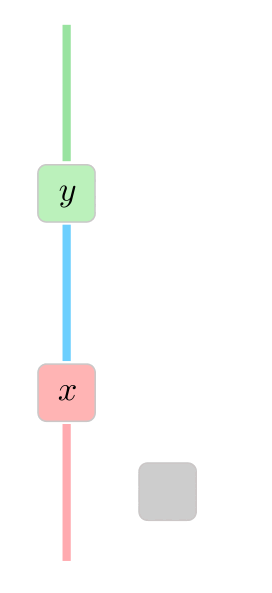

`x<=n<=y:`

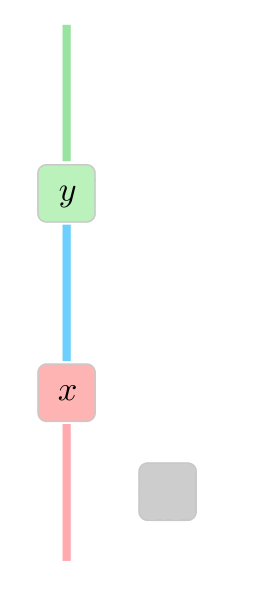

`y<=n:`

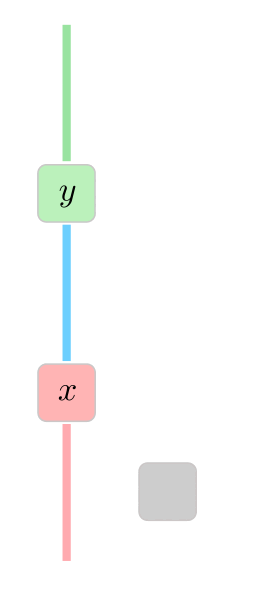

In [ ]:
# time: O(N); space: O(1)
def increasingTriplet(nums):
  x = y = 2**31
  for n in nums:
    if n<=x:
      x=n
    elif n<=y:
      y=n
    else:
      return True
  return False

As you can see on this gif the algo decomposes the subsequence into two nonincreasing subsequences. The first point that violates this nonincreasing property of green points renders the algo to `return True`.

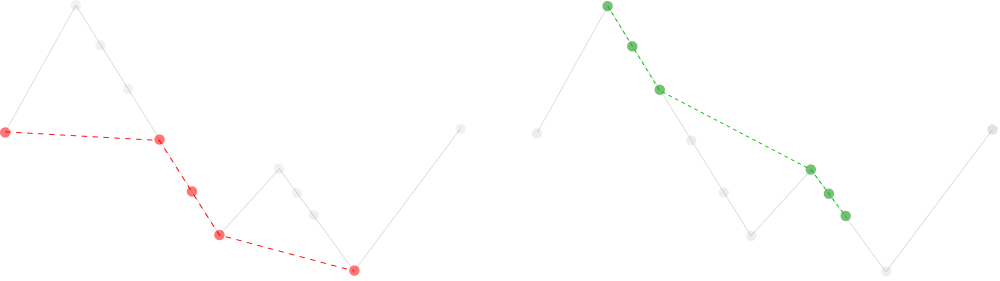

Here's another problem that requires two variables: an element of an array and a counter.

## Find the majority number

[169. Majority Element](https://leetcode.com/problems/majority-element/)

```
Given an array nums of size n, return the majority element.
The majority element is the element that appears more than ⌊n/2⌋ times. You may assume that the majority element always exists in the array.

Example 1:
Input: nums = [3,2,3]
Output: 3

Example 2:
Input: nums = [2,2,1,1,1,2,2]
Output: 2

Constraints:
n == nums.length
1 <= n <= 5 * 10^4
-10^9 <= nums[i] <= 10^9
```

**Explanation 1: runs of 50 %**

The algorithm breaks an array into segments (runs). In each run the first element (leader) of the run "dominates" all the other elements. "Dominates" means that it occurs more times than all the others elements in the run combined. We terminate the run when all the other elements combined occur as much times as the leader (`cnt == 0`).


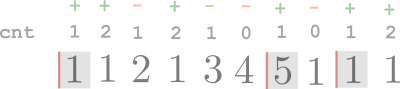


This tells us that the leader as well as every other element occurs 50% of maybe less in the run. The same is true if we consider few consecutive runs stacked together: in each of them every element can occur 50% or less that's why in all of them combined the same is true. The last run can be unfinished. In all previous runs combined no element occured more than 50% that's why if the array has the majority element this element necessarily has to be the leader of the last run and has to occupy more than 50% of it (otherwise the last run would not be the last or the array wouldn't have the majority element).

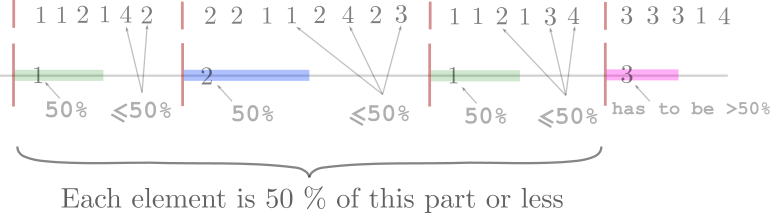

So in fact all the decisive staff occurs in the last run, but we have to do all the other runs to determine when the last run starts and what element will be its leader

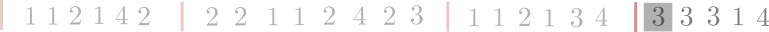

Note that there could be many small 2-element runs or one giant run

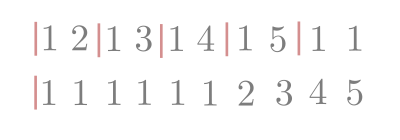

so we can't say that we are reducing our problem into a smaller one. Breaking down into runs is kinda 'magical' as at the end it leaves us with the run whose leader is majority element of the initial array (if it existed).

**Explanation 2: pairing**

Suppose we have an array of numbers and we want to make pairs of different elements. This means that a pair say `(1,2)` is valid while `(1,1)` is not.
If all the elements in the array were unique we would traverse the array and pair up each element with the next one.

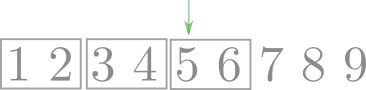


We run into problem if the array has repeating elements. Now we have to "save" (using a stack perhaps) the excess element

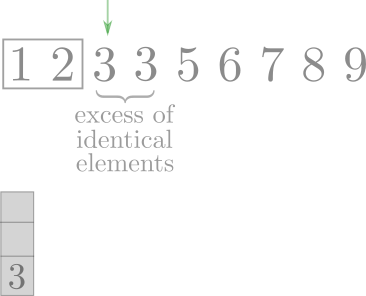

and fastforward to the element different from the saved one.

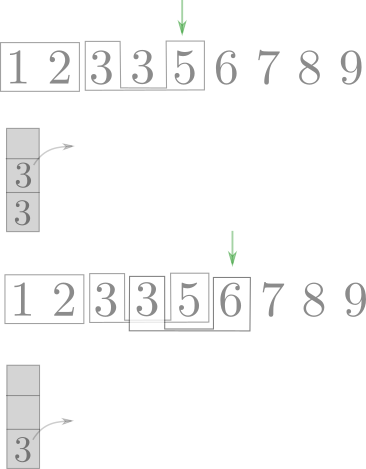

We do this untill the stack containing excess element is empty, after that we can fill it with another excess element if we'll encounter it.
In fact the stack contains the same element multiple times so there's actually no need in the stack: we can store the element and it's abundance in two variables `c` and `cnt`.
Thus with our algorithm we can maintain production of pairs of different elements, the `c` variable stores the element that is currently in excess and `cnt` stores the excess itself. Pairing of elements is useful because the leftover element after we reach the end of the array will be the majority element (if it exists). Let me explain why. All in all we will have `⌊ n/2 ⌋` pairs and even if majority element was present in each of them we would still have some of if left (by definition majority should occur more than `⌊ n/2 ⌋` times in the array). If majority occures not in each pair, we will have even more unpaired instances of it.

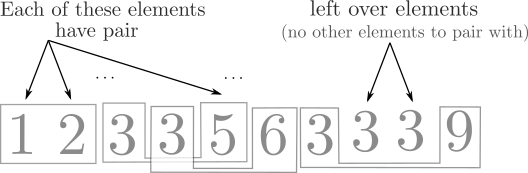


In [ ]:
# time: O(N); space: O(1)
def majorityElement(nums):
  c = cnt = 0
  for n in nums:
    if cnt==0:
      c=n
    cnt += 2*(c==n)-1
  return c

The next problem requires three variables.

## Maximum value of ordered triplet

[2873. Maximum Value of an Ordered Triplet I](https://leetcode.com/problems/maximum-value-of-an-ordered-triplet-i/)

```
You are given a 0-indexed integer array nums.
Return the maximum value over all triplets of indices (i,j,k) such that i<j<k. If all such triplets have a negative value, return 0.
The value of a triplet of indices (i,j,k) is equal to (nums[i]-nums[j])*nums[k].

Example 1:
Input: nums = [12,6,1,2,7]
Output: 77
Explanation: The value of the triplet (0, 2, 4) is (nums[0] - nums[2]) * nums[4] = 77.
It can be shown that there are no ordered triplets of indices with a value greater than 77.

Example 2:
Input: nums = [1,10,3,4,19]
Output: 133
Explanation: The value of the triplet (1, 2, 4) is (nums[1] - nums[2]) * nums[4] = 133.
It can be shown that there are no ordered triplets of indices with a value greater than 133.

Example 3:
Input: nums = [1,2,3]
Output: 0
Explanation: The only ordered triplet of indices (0, 1, 2) has a negative value of (nums[0] - nums[1]) * nums[2] = -3.
Hence, the answer would be 0.

Constraints:
3 <= nums.length <= 100
1 <= nums[i] <= 10^6
```

Here's a straightforward algorithm that probes all possible triples of numbers of an array.

In [ ]:
# time: O(n^3); space: O(1)
def maximumTripletValue(nums):
  out = 0
  for i in range(len(nums)):
    for j in range(i+1, len(nums)):
      for k in range(j+1, len(nums)):
        out = max(out, (nums[i]-nums[j])*nums[k])
  return out

Here is an efficient linear algorithm that uses variables to store:
* maximum element `M`;
* maximum difference `D=n[i]-n[j]`;
* maximum `(nums[i]-nums[j])*nums[k]` value.

In [ ]:
# time: O(N); space: O(1)
def maximumTripletValue(nums):
  out = M = D = 0
  for n in nums:
    out = max(out, D*n)
    D = max(D, M-n)
    M = max(M, n)
  return out

The next problem again demands three variables and a smart algorithm to manage them.

## Calculate third max

[414. Third Maximum Number](https://leetcode.com/problems/third-maximum-number/)

```
Given an integer array nums, return the third distinct maximum number in this array.
If the third maximum does not exist, return the maximum number.

Example 1:
Input: nums = [3,2,1]
Output: 1
Explanation:
The first distinct maximum is 3.
The second distinct maximum is 2.
The third distinct maximum is 1.

Example 2:
Input: nums = [1,2]
Output: 2
Explanation:
The first distinct maximum is 2.
The second distinct maximum is 1.
The third distinct maximum does not exist, so the maximum (2) is returned instead.

Example 3:
Input: nums = [2,2,3,1]
Output: 1
Explanation:
The first distinct maximum is 3.
The second distinct maximum is 2 (both 2's are counted together since they have the same value).
The third distinct maximum is 1.

Constraints:
1 <= nums.length <= 10^4
-2^31 <= nums[i] <= 2^31 - 1
```

This is highly inefficient algorithm: you don't have to sort the whole array to get three greatest elements!

In [ ]:
# time: (NlogN); space: O(1)
def thirdMax(nums):
  nums.sort(reverse = True)

  elem_counted = 1
  prev_elem = nums[0]

  for index in range(len(nums)):
    if nums[index] != prev_elem:
      elem_counted += 1
      prev_elem = nums[index]
    if elem_counted == 3:
      return nums[index]
  return nums[0]

This algorithm is linear. It stores three greatest elements encountered so far in three variables: `one, two, three `, adds one element at a time and updates theses variables if necessary.

In [ ]:
# time: O(N); space: O(1)
def thirdMax(nums):
  one = two = three = -2**31-1
  for n in nums:
    if one<n:
      one,two,three = n,one,two
    elif two<n<one:
      two,three = n,two
    elif three<n<two:
      three = n
  return three if three != -2**31-1 else one

`one<n:`

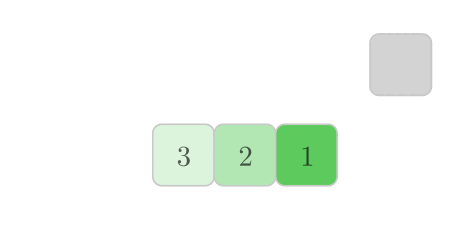

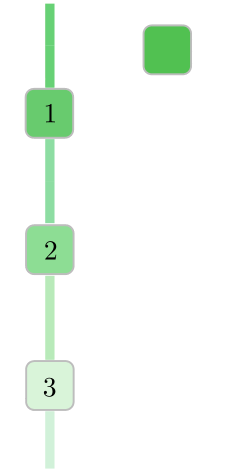

`two<n<one:`

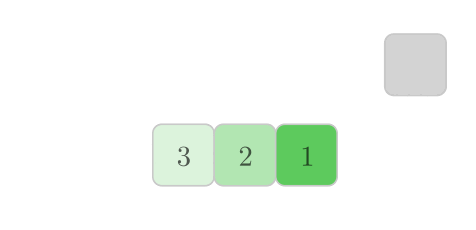

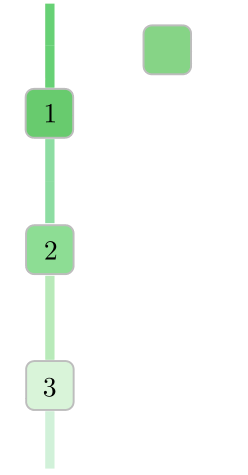

`three<n<two`

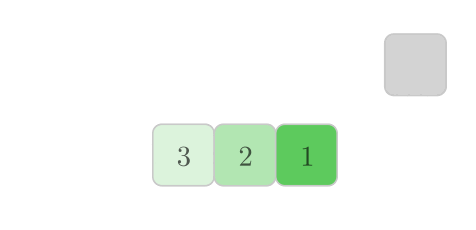

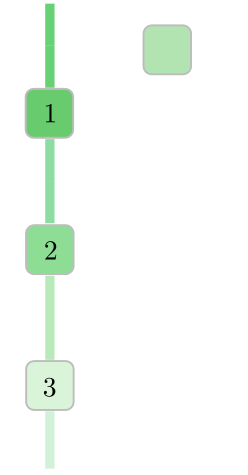

## Find and invert

[2375. Construct Smallest Number From DI String](https://leetcode.com/problems/construct-smallest-number-from-di-string/discuss/2444054/reverse-'s)

```
You are given a 0-indexed string pattern of length n consisting of the characters 'I' meaning increasing and 'D' meaning decreasing.
A 0-indexed string num of length n + 1 is created using the following conditions:
• num consists of the digits '1' to '9', where each digit is used at most once.
• If pattern[i] == 'I', then num[i] < num[i + 1].
• If pattern[i] == 'D', then num[i] > num[i + 1].
Return the lexicographically smallest possible string num that meets the conditions.

Example 1:
Input: pattern = "IIIDIDDD"
Output: "123549876"
Explanation:
At indices 0, 1, 2, and 4 we must have that num[i] < num[i+1].
At indices 3, 5, 6, and 7 we must have that num[i] > num[i+1].
Some possible values of num are "245639871", "135749862", and "123849765".
It can be proven that "123549876" is the smallest possible num that meets the conditions.
Note that "123414321" is not possible because the digit '1' is used more than once.

Example 2:
Input: pattern = "DDD"
Output: "4321"
Explanation:
Some possible values of num are "9876", "7321", and "8742".
It can be proven that "4321" is the smallest possible num that meets the conditions.

Constraints:
1 <= pattern.length <= 8
pattern consists of only the letters 'I' and 'D'.
```

In [ ]:
#@title Find and reverse
%%html

<svg width="110mm" height="129mm" version="1.1" viewBox="0 0 140.36 161.45" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:ns38="http://www.iki.fi/pav/software/textext/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <defs>
  <marker id="Arrow1Mstart" style="overflow:visible" orient="auto">
   <path transform="matrix(.4 0 0 .4 4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-rule:evenodd;fill:#000000;stroke-width:1pt;stroke:#000000"/>
  </marker>
  <marker id="marker4852" style="overflow:visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-rule:evenodd;fill:#000000;stroke-width:1pt;stroke:#000000"/>
  </marker>
  <marker id="Arrow1Mstart-8" style="overflow:visible" orient="auto">
   <path transform="matrix(.4 0 0 .4 4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-rule:evenodd;fill:#000000;stroke-width:1pt;stroke:#000000"/>
  </marker>
  <marker id="marker4852-2" style="overflow:visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-rule:evenodd;fill:#000000;stroke-width:1pt;stroke:#000000"/>
  </marker>
 </defs>
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(-292.43 164.15)">
  <g transform="matrix(.82755 0 0 .82755 80.675 -31.655)" style="fill-opacity:.54167;fill:#000000" ns38:alignment="middle center" ns38:jacobian_sqrt="1.0" ns38:pdfconverter="inkscape" ns38:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns38:scale="2.834645669291339" ns38:texconverter="pdflatex" ns38:text="$$local max$$\n$$local min$$\n$$buy/sell sequence$$\n$$profit$$" ns38:version="1.1.0">
   <defs id="id-a0684ba1-5153-41ce-adf2-becf0084c4db"></defs>
   <g transform="translate(-268.48 -139.8)" style="fill-opacity:.61742;fill:#000000">
    <rect x="532.75" y="120.85" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="552.61" y="120.85" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="532.75" y="100.98" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="552.61" y="100.98" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="532.75" y="81.122" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="552.61" y="81.122" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="532.75" y="61.259" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="552.61" y="61.259" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="572.47" y="120.85" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="592.33" y="120.85" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="572.47" y="100.98" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="592.33" y="100.98" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="572.47" y="81.122" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="592.33" y="81.122" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="572.47" y="61.259" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="592.33" y="61.259" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="532.75" y="41.397" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="552.61" y="41.397" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="532.75" y="21.535" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="552.61" y="21.535" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="532.75" y="1.6721" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="552.61" y="1.6721" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="532.75" y="-18.19" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="552.61" y="-18.19" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="572.47" y="41.397" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="592.33" y="41.397" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="572.47" y="21.535" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="592.33" y="21.535" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="572.47" y="1.6721" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="592.33" y="1.6721" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="572.47" y="-18.19" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="592.33" y="-18.19" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="612.2" y="41.397" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="632.06" y="41.397" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="612.2" y="21.535" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="632.06" y="21.535" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="612.2" y="1.6721" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="632.06" y="1.6721" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="612.2" y="-18.19" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="632.06" y="-18.19" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="651.92" y="41.397" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="671.78" y="41.397" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="651.92" y="21.535" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="671.78" y="21.535" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="651.92" y="1.6721" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="671.78" y="1.6721" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="651.92" y="-18.19" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="671.78" y="-18.19" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="612.2" y="120.85" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="632.06" y="120.85" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="612.2" y="100.98" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="632.06" y="100.98" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="612.2" y="81.122" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="632.06" y="81.122" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="612.2" y="61.259" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="632.06" y="61.259" width="19.862" height="19.862" style="fill:none;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="651.92" y="120.85" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="671.78" y="120.85" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="651.92" y="100.98" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="671.78" y="100.98" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="651.92" y="81.122" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="671.78" y="81.122" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="651.92" y="61.259" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <rect x="671.78" y="61.259" width="19.862" height="19.862" style="fill-opacity:.11742;fill:#00d900;opacity:.999;stroke-linecap:round;stroke-opacity:.98485;stroke-width:.25578;stroke:#c5c5c5"/>
    <path d="m532.75 140.71 158.9-158.9" style="fill:none;stroke-dasharray:2.56179, 2.56179;stroke-width:.32022;stroke:#000000"/>
    <text x="524.26654" y="143.20723" style="font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="524.26654" y="143.20723" style="stroke-width:.19426">1</tspan></text>
    <text x="523.94135" y="123.63566" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="523.94135" y="123.63566" style="stroke-width:.19426">2</tspan></text>
    <text x="524.31384" y="103.39497" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="524.31384" y="103.39497" style="stroke-width:.19426">3</tspan></text>
    <text x="523.98865" y="83.823135" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="523.98865" y="83.823135" style="stroke-width:.19426">4</tspan></text>
    <text x="524.2655" y="63.920227" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="524.2655" y="63.920227" style="stroke-width:.19426">5</tspan></text>
    <text x="523.94031" y="44.348541" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="523.94031" y="44.348541" style="stroke-width:.19426">6</tspan></text>
    <text x="524.31281" y="24.10795" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="524.31281" y="24.10795" style="stroke-width:.19426">7</tspan></text>
    <text x="523.98761" y="4.5361443" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="523.98761" y="4.5361443" style="stroke-width:.19426">8</tspan></text>
    <text x="524.18311" y="-15.268345" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="524.18311" y="-15.268345" style="stroke-width:.19426">9</tspan></text>
    <text x="550.43866" y="154.11333" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="550.43866" y="154.11333" style="stroke-width:.19426">I</tspan></text>
    <text x="570.00415" y="153.90967" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="570.00415" y="153.90967" style="stroke-width:.19426">I</tspan></text>
    <text x="590.24432" y="154.04846" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="590.24432" y="154.04846" style="stroke-width:.19426">D</tspan></text>
    <text x="610.1698" y="153.96281" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="610.1698" y="153.96281" style="stroke-width:.19426">D</tspan></text>
    <text x="629.94653" y="153.979" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="629.94653" y="153.979" style="stroke-width:.19426">D</tspan></text>
    <text x="649.53223" y="154.01756" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="649.53223" y="154.01756" style="stroke-width:.19426">I</tspan></text>
    <text x="669.7522" y="153.91414" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="669.7522" y="153.91414" style="stroke-width:.19426">D</tspan></text>
    <text x="689.67767" y="153.82849" style="fill-opacity:.61742;fill:#000000;font-family:'Courier New';font-size:7.7704px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.19426;word-spacing:0px" xml:space="preserve"><tspan x="689.67767" y="153.82849" style="stroke-width:.19426">D</tspan></text>
    <path d="m530.9 139.09 18.983-18.649" style="fill:none;stroke-width:1.0453;stroke:#00a600"/>
    <path d="m630.81 99.935-57.194-57.396" style="fill:none;stroke-width:1.0453;stroke:#00a600"/>
    <path d="m690.65 20.621-37.313-37.439" style="fill:none;stroke-width:1.0453;stroke:#00a600"/>
    <ellipse cx="530.08" cy="139.79" rx="1.6004" ry="1.5748" style="fill-opacity:1;fill:#ffffff;opacity:.999;stroke-linecap:round;stroke-width:1.0453;stroke:#00a600"/>
    <ellipse cx="551.07" cy="118.95" rx="1.6004" ry="1.5748" style="fill-opacity:1;fill:#ffffff;opacity:.999;stroke-linecap:round;stroke-width:1.0453;stroke:#00a600"/>
    <ellipse cx="572.43" cy="41.316" rx="1.6004" ry="1.5748" style="fill-opacity:1;fill:#ffffff;opacity:.999;stroke-linecap:round;stroke-width:1.0453;stroke:#00a600"/>
    <ellipse cx="632.03" cy="101.04" rx="1.6004" ry="1.5748" style="fill-opacity:1;fill:#ffffff;opacity:.999;stroke-linecap:round;stroke-width:1.0453;stroke:#00a600"/>
    <ellipse cx="612.03" cy="81.059" rx="1.6004" ry="1.5748" style="fill-opacity:1;fill:#ffffff;opacity:.999;stroke-linecap:round;stroke-width:1.0453;stroke:#00a600"/>
    <ellipse cx="592.24" cy="61.166" rx="1.6004" ry="1.5748" style="fill-opacity:1;fill:#ffffff;opacity:.999;stroke-linecap:round;stroke-width:1.0453;stroke:#00a600"/>
    <ellipse cx="651.83" cy="-18.052" rx="1.6004" ry="1.5748" style="fill-opacity:1;fill:#ffffff;opacity:.999;stroke-linecap:round;stroke-width:1.0453;stroke:#00a600"/>
    <ellipse cx="671.73" cy="1.5859" rx="1.6004" ry="1.5748" style="fill-opacity:1;fill:#ffffff;opacity:.999;stroke-linecap:round;stroke-width:1.0453;stroke:#00a600"/>
    <ellipse cx="691.49" cy="21.547" rx="1.6004" ry="1.5748" style="fill-opacity:1;fill:#ffffff;opacity:.999;stroke-linecap:round;stroke-width:1.0453;stroke:#00a600"/>
    <path d="m651.71 159.34v7.2668" style="fill:none;stroke-width:.31972px;stroke:#000000"/>
    <path d="m691.65 159.25v7.2668" style="fill:none;stroke-width:.31972px;stroke:#000000"/>
    <path d="m652.7 162.95 38.065 0.0285" style="fill:none;marker-end:url(#marker4852);marker-start:url(#Arrow1Mstart);stroke-width:.32022;stroke:#000000"/>
    <path d="m572.08 159.31v7.2668" style="fill:none;stroke-width:.31972px;stroke:#000000"/>
    <path d="m631.2 159.22v7.2668" style="fill:none;stroke-width:.31972px;stroke:#000000"/>
    <path d="m573.16 162.92 57.157 0.0285" style="fill:none;marker-end:url(#marker4852-2);marker-start:url(#Arrow1Mstart-8);stroke-width:.32143;stroke:#000000"/>
    <g transform="translate(585.04 170.28)" ns38:alignment="middle center" ns38:inkscapeversion="1.0" ns38:jacobian_sqrt="1.0" ns38:pdfconverter="inkscape" ns38:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns38:scale="2.834645669291339" ns38:texconverter="pdflatex" ns38:text="$reverse$" ns38:version="1.1.0">
     <defs id="id-79941340-3d63-4dfb-903d-4d220776d7ce"></defs>
     <g transform="translate(-149.01 -130.36)">
      <g style="fill-opacity:1;fill:#000000">
       <g transform="translate(148.71 134.76)">
        <path d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0.015625-0.03125 0.34375-1.3906 0.39062-1.5781 0.078125-0.32812 0.26562-1.0156 0.3125-1.2969 0.046875-0.125 0.32812-0.59375 0.5625-0.8125 0.078125-0.0625 0.375-0.32812 0.79688-0.32812 0.26562 0 0.40625 0.125 0.42188 0.125-0.29688 0.046875-0.51562 0.28125-0.51562 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375s0.54688-0.23438 0.54688-0.59375c0-0.34375-0.3125-0.64062-0.82812-0.64062-0.64062 0-1.0781 0.48438-1.2656 0.76562-0.09375-0.45312-0.45312-0.76562-0.92188-0.76562-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.15625 0 0.29688 0.078125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
       </g>
      </g>
      <g style="fill-opacity:1;fill:#000000">
       <g transform="translate(153.49 134.76)">
        <path d="m1.8594-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z"/>
       </g>
       <g transform="translate(158.12 134.76)">
        <path d="m4.6719-3.7031c0-0.54688-0.26562-0.70312-0.4375-0.70312-0.25 0-0.5 0.26562-0.5 0.48438 0 0.125 0.046875 0.1875 0.15625 0.29688 0.21875 0.20312 0.34375 0.45312 0.34375 0.8125 0 0.42188-0.60938 2.7031-1.7656 2.7031-0.51562 0-0.75-0.34375-0.75-0.875 0-0.54688 0.28125-1.2812 0.57812-2.1094 0.078125-0.17188 0.125-0.3125 0.125-0.5 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.9375 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.29688-1 0.71875-1.2344 1.0156-1.2344 0.078125 0 0.25 0 0.25 0.3125 0 0.25-0.10938 0.53125-0.17188 0.70312-0.4375 1.1562-0.5625 1.6094-0.5625 2.0469 0 1.0781 0.875 1.2344 1.3281 1.2344 1.6719 0 2.25-3.2969 2.25-3.8125z"/>
       </g>
      </g>
      <g id="id-407af144-972b-48a1-b878-1c5070160a4c" style="fill-opacity:1;fill:#000000">
       <g transform="translate(163.31 134.76)">
        <path id="id-8be5bf3e-0c00-419b-81a5-bf4f48d3ef9f" d="m1.8594-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z"/>
       </g>
       <g transform="translate(167.95 134.76)">
        <path id="id-3bceda93-e103-4865-bad9-7b885c1ef44b" d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0.015625-0.03125 0.34375-1.3906 0.39062-1.5781 0.078125-0.32812 0.26562-1.0156 0.3125-1.2969 0.046875-0.125 0.32812-0.59375 0.5625-0.8125 0.078125-0.0625 0.375-0.32812 0.79688-0.32812 0.26562 0 0.40625 0.125 0.42188 0.125-0.29688 0.046875-0.51562 0.28125-0.51562 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375s0.54688-0.23438 0.54688-0.59375c0-0.34375-0.3125-0.64062-0.82812-0.64062-0.64062 0-1.0781 0.48438-1.2656 0.76562-0.09375-0.45312-0.45312-0.76562-0.92188-0.76562-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.15625 0 0.29688 0.078125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
       </g>
      </g>
      <g style="fill-opacity:1;fill:#000000">
       <g transform="translate(172.72 134.76)">
        <path id="id-8c69ec45-5595-4421-b8f9-8a3522cb511b" d="m3.8906-3.7344c-0.26562 0.015625-0.46875 0.23438-0.46875 0.45312 0 0.14062 0.09375 0.29688 0.3125 0.29688s0.45312-0.17188 0.45312-0.5625c0-0.45312-0.42188-0.85938-1.1875-0.85938-1.3125 0-1.6875 1.0156-1.6875 1.4531 0 0.78125 0.73438 0.92188 1.0312 0.98438 0.51562 0.10938 1.0312 0.21875 1.0312 0.76562 0 0.25-0.21875 1.0938-1.4219 1.0938-0.14062 0-0.90625 0-1.1406-0.53125 0.39062 0.046875 0.64062-0.25 0.64062-0.53125 0-0.21875-0.17188-0.34375-0.375-0.34375-0.26562 0-0.5625 0.20312-0.5625 0.65625 0 0.5625 0.57812 0.96875 1.4219 0.96875 1.625 0 2.0156-1.2031 2.0156-1.6562 0-0.35938-0.1875-0.60938-0.3125-0.71875-0.26562-0.28125-0.5625-0.34375-1-0.42188-0.35938-0.078125-0.75-0.15625-0.75-0.60938 0-0.28125 0.23438-0.89062 1.1094-0.89062 0.25 0 0.75 0.078125 0.89062 0.45312z"/>
       </g>
       <g transform="translate(177.38 134.76)">
        <path d="m1.8594-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z"/>
       </g>
      </g>
     </g>
    </g>
    <g transform="translate(655.38 170.28)" style="fill-opacity:.61742;fill:#000000" ns38:alignment="middle center" ns38:inkscapeversion="1.0" ns38:jacobian_sqrt="1.0" ns38:pdfconverter="inkscape" ns38:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns38:scale="2.834645669291339" ns38:texconverter="pdflatex" ns38:text="$reverse$" ns38:version="1.1.0">
     <defs></defs>
     <g transform="translate(-149.01 -130.36)">
      <g style="fill-opacity:1;fill:#000000">
       <g transform="translate(148.71 134.76)">
        <path d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0.015625-0.03125 0.34375-1.3906 0.39062-1.5781 0.078125-0.32812 0.26562-1.0156 0.3125-1.2969 0.046875-0.125 0.32812-0.59375 0.5625-0.8125 0.078125-0.0625 0.375-0.32812 0.79688-0.32812 0.26562 0 0.40625 0.125 0.42188 0.125-0.29688 0.046875-0.51562 0.28125-0.51562 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375s0.54688-0.23438 0.54688-0.59375c0-0.34375-0.3125-0.64062-0.82812-0.64062-0.64062 0-1.0781 0.48438-1.2656 0.76562-0.09375-0.45312-0.45312-0.76562-0.92188-0.76562-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.15625 0 0.29688 0.078125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
       </g>
      </g>
      <g style="fill-opacity:1;fill:#000000">
       <g transform="translate(153.49 134.76)">
        <path d="m1.8594-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z"/>
       </g>
       <g transform="translate(158.12 134.76)">
        <path d="m4.6719-3.7031c0-0.54688-0.26562-0.70312-0.4375-0.70312-0.25 0-0.5 0.26562-0.5 0.48438 0 0.125 0.046875 0.1875 0.15625 0.29688 0.21875 0.20312 0.34375 0.45312 0.34375 0.8125 0 0.42188-0.60938 2.7031-1.7656 2.7031-0.51562 0-0.75-0.34375-0.75-0.875 0-0.54688 0.28125-1.2812 0.57812-2.1094 0.078125-0.17188 0.125-0.3125 0.125-0.5 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.9375 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.29688-1 0.71875-1.2344 1.0156-1.2344 0.078125 0 0.25 0 0.25 0.3125 0 0.25-0.10938 0.53125-0.17188 0.70312-0.4375 1.1562-0.5625 1.6094-0.5625 2.0469 0 1.0781 0.875 1.2344 1.3281 1.2344 1.6719 0 2.25-3.2969 2.25-3.8125z"/>
       </g>
      </g>
      <g style="fill-opacity:1;fill:#000000">
       <g transform="translate(163.31 134.76)">
        <path d="m1.8594-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z"/>
       </g>
       <g transform="translate(167.95 134.76)">
        <path d="m0.875-0.59375c-0.03125 0.15625-0.09375 0.39062-0.09375 0.4375 0 0.17188 0.14062 0.26562 0.29688 0.26562 0.125 0 0.29688-0.078125 0.375-0.28125 0.015625-0.03125 0.34375-1.3906 0.39062-1.5781 0.078125-0.32812 0.26562-1.0156 0.3125-1.2969 0.046875-0.125 0.32812-0.59375 0.5625-0.8125 0.078125-0.0625 0.375-0.32812 0.79688-0.32812 0.26562 0 0.40625 0.125 0.42188 0.125-0.29688 0.046875-0.51562 0.28125-0.51562 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375s0.54688-0.23438 0.54688-0.59375c0-0.34375-0.3125-0.64062-0.82812-0.64062-0.64062 0-1.0781 0.48438-1.2656 0.76562-0.09375-0.45312-0.45312-0.76562-0.92188-0.76562-0.45312 0-0.64062 0.39062-0.73438 0.5625-0.17188 0.34375-0.29688 0.9375-0.29688 0.96875 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.015625 0.17188-0.23438 0.17188-0.70312 0.375-1.1875 0.73438-1.1875 0.15625 0 0.29688 0.078125 0.29688 0.45312 0 0.21875-0.03125 0.32812-0.15625 0.84375z"/>
       </g>
      </g>
      <g style="fill-opacity:1;fill:#000000">
       <g transform="translate(172.72 134.76)">
        <path d="m3.8906-3.7344c-0.26562 0.015625-0.46875 0.23438-0.46875 0.45312 0 0.14062 0.09375 0.29688 0.3125 0.29688s0.45312-0.17188 0.45312-0.5625c0-0.45312-0.42188-0.85938-1.1875-0.85938-1.3125 0-1.6875 1.0156-1.6875 1.4531 0 0.78125 0.73438 0.92188 1.0312 0.98438 0.51562 0.10938 1.0312 0.21875 1.0312 0.76562 0 0.25-0.21875 1.0938-1.4219 1.0938-0.14062 0-0.90625 0-1.1406-0.53125 0.39062 0.046875 0.64062-0.25 0.64062-0.53125 0-0.21875-0.17188-0.34375-0.375-0.34375-0.26562 0-0.5625 0.20312-0.5625 0.65625 0 0.5625 0.57812 0.96875 1.4219 0.96875 1.625 0 2.0156-1.2031 2.0156-1.6562 0-0.35938-0.1875-0.60938-0.3125-0.71875-0.26562-0.28125-0.5625-0.34375-1-0.42188-0.35938-0.078125-0.75-0.15625-0.75-0.60938 0-0.28125 0.23438-0.89062 1.1094-0.89062 0.25 0 0.75 0.078125 0.89062 0.45312z"/>
       </g>
       <g transform="translate(177.38 134.76)">
        <path d="m1.8594-2.2969c0.29688 0 1.0312-0.03125 1.5312-0.23438 0.70312-0.29688 0.75-0.89062 0.75-1.0312 0-0.4375-0.375-0.84375-1.0625-0.84375-1.1094 0-2.625 0.96875-2.625 2.7188 0 1.0156 0.59375 1.7969 1.5781 1.7969 1.4219 0 2.25-1.0625 2.25-1.1719 0-0.0625-0.046875-0.14062-0.10938-0.14062s-0.078125 0.03125-0.14062 0.10938c-0.78125 0.98438-1.875 0.98438-1.9844 0.98438-0.78125 0-0.875-0.84375-0.875-1.1562 0-0.125 0.015625-0.42188 0.15625-1.0312zm-0.46875-0.21875c0.39062-1.5156 1.4219-1.6719 1.6875-1.6719 0.45312 0 0.73438 0.29688 0.73438 0.625 0 1.0469-1.5938 1.0469-2.0156 1.0469z"/>
       </g>
      </g>
     </g>
    </g>
   </g>
  </g>
 </g>
</svg>


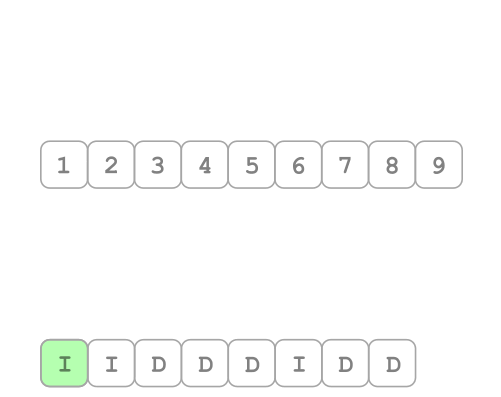

In [ ]:
def reverse(nums, l, r):
  while l<r:
    nums[l],nums[r] = nums[r],nums[l]
    l += 1
    r -= 1

# time: O(N); aux. space: O(1)
def smallestNumber(pattern):
  out = [str(i+1) for i in range(0, len(pattern)+1)]
  i = j = 0
  while i<len(pattern):
    while i<len(pattern) and pattern[i]=='I':
      i += 1
    j = i
    while j<len(pattern) and pattern[j]=='D':
      j += 1
    reverse(out, i, j)
    i = j
  return ''.join(out)

## Rotate array

[189. Rotate Array](https://leetcode.com/problems/rotate-array/)

```
Given an integer array nums, rotate the array to the right by k steps, where k is non-negative.

Example 1:
Input: nums = [1,2,3,4,5,6,7], k = 3
Output: [5,6,7,1,2,3,4]
Explanation:
rotate 1 steps to the right: [7,1,2,3,4,5,6]
rotate 2 steps to the right: [6,7,1,2,3,4,5]
rotate 3 steps to the right: [5,6,7,1,2,3,4]

Example 2:
Input: nums = [-1,-100,3,99], k = 2
Output: [3,99,-1,-100]
Explanation:
rotate 1 steps to the right: [99,-1,-100,3]
rotate 2 steps to the right: [3,99,-1,-100]

Constraints:
1 <= nums.length <= 10^5
-2^31 <= nums[i] <= 2^31 - 1
0 <= k <= 10^5
```

This is not in-place algorithm that requires additional `time: O(N); space: O(N)`.

In [ ]:
def rotate(nums, k):
  k = k%len(nums)
  return nums[-k:]+nums[:-k]


Let's come up with an inplace algorithm.
The following algorithm simulates the process of a single rotation and repeats it `k` times. This leads to a bubble-sort-like algorithm `time O(k*N); space: O(1)`.

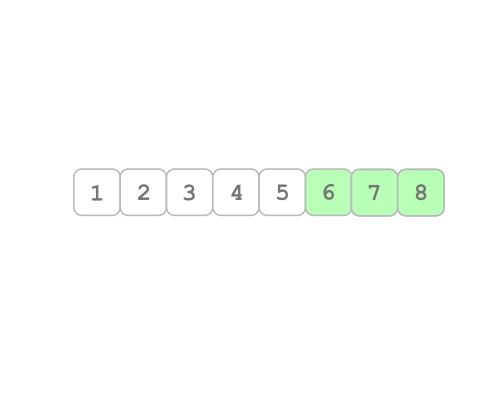

In [ ]:
# inplace time: O(k*N); space: O(1)
def rotate(nums, k):
  for _ in range(k):
    for i in range(1,len(nums)):
      nums[-i],nums[-i-1] = nums[-i-1],nums[-i]
  return nums

Here's an elegent inplace algorithm that is based on `rotation` subroutine that requires `time: O(N); space: O(1)`

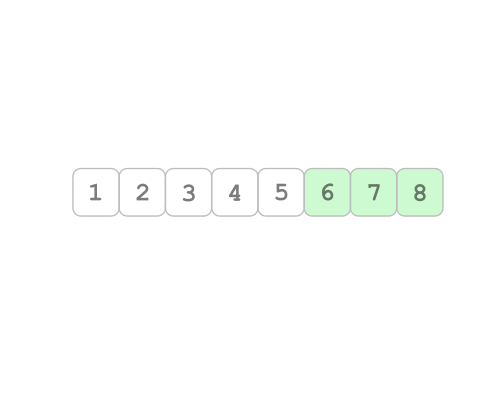

In [ ]:
def reverse(nums, l, r):
  while l<r:
    nums[l],nums[r] = nums[r],nums[l]
    l += 1
    r -= 1

# inplace time: O(N); space: O(1)
def rotate(nums, k):
  k %= len(nums)
  reverse(nums, 0, len(nums)-1)
  reverse(nums, 0, len(nums)-k-1)
  reverse(nums, len(nums)-k, len(nums)-1)


[8, 9, 10, 1, 2, 3, 4, 5, 6, 7]


> The reversal code is time- and space-efficient, and is so short and simple
that it's pretty hard to get wrong. It is exactly the code that Kernighan and
Plauger use in the text editor in their book. Brian Kernighan reports that this
code ran correctly the first time it was executed, while their previous code for a similar task based on linked lists contained several bugs. This code is used in several text editors, including the UNIX system's ed editor with which I originally typed this column. Ken Thompson wrote the editor and the reversal
code in 1971, and claims that it was part of the folklore even then.
(*Programming perls*, Bentley J.)


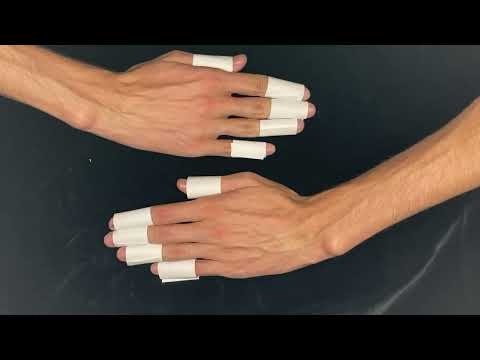

In [ ]:
#@title Rotate array
from IPython.display import YouTubeVideo
YouTubeVideo('JXDNfiO6cSA', width=600, height=400)

# U-turn: delete subarray to make array sorted

[1574. Shortest Subarray to be Removed to Make Array Sorted](https://leetcode.com/problems/shortest-subarray-to-be-removed-to-make-array-sorted/)

```
Given an integer array arr, remove a subarray (can be empty) from arr such that the remaining elements in arr are non-decreasing.
Return the length of the shortest subarray to remove. A subarray is a contiguous subsequence of the array.

Example 1:
Input: arr = [1,2,3,10,4,2,3,5]
Output: 3

Example 2:
Input: arr = [5,4,3,2,1]
Output: 4
Explanation: Since the array is strictly decreasing, we can only keep a single element.
Therefore we need to remove a subarray of length 4, either [5,4,3,2] or [4,3,2,1].

Example 3:
Input: arr = [1,2,3]
Output: 0
Explanation: The array is already non-decreasing. We do not need to remove any elements.

Constraints:
1 <= arr.length <= 10^5
0 <= arr[i] <= 10^9
```

In [ ]:
#@title U-turn
%%html

<svg width="149.71mm" height="102.38mm" version="1.1" viewBox="0 0 149.71 102.38" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:ns38="http://www.iki.fi/pav/software/textext/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <defs>
  <marker id="marker4852-7" style="overflow:visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-opacity:.33333;fill-rule:evenodd;fill:#000000;stroke-opacity:.33333;stroke-width:1pt;stroke:#000000"/>
  </marker>
  <marker id="marker4852-7-4" style="overflow:visible" orient="auto">
   <path transform="matrix(-.4 0 0 -.4 -4 0)" d="m0 0 5-5-17.5 5 17.5 5z" style="fill-opacity:.33333;fill-rule:evenodd;fill:#000000;stroke-opacity:.33333;stroke-width:1pt;stroke:#000000"/>
  </marker>
 </defs>
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(-293.73 360.97)">
  <g transform="matrix(.82755 0 0 .82755 80.675 -31.655)" style="fill-opacity:.54167;fill:#000000" ns38:alignment="middle center" ns38:jacobian_sqrt="1.0" ns38:pdfconverter="inkscape" ns38:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns38:scale="2.834645669291339" ns38:texconverter="pdflatex" ns38:text="$$local max$$\n$$local min$$\n$$buy/sell sequence$$\n$$profit$$" ns38:version="1.1.0">
   <defs id="id-a0684ba1-5153-41ce-adf2-becf0084c4db"></defs>
   <g transform="matrix(1.1771 0 0 1.1771 244.19 -237.76)" ns38:alignment="middle center" ns38:inkscapeversion="1.0" ns38:jacobian_sqrt="1.0" ns38:pdfconverter="inkscape" ns38:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns38:scale="2.834645669291339" ns38:texconverter="pdflatex" ns38:text="$$subarray$$\n$$subsequence$$" ns38:version="1.1.0">
    <defs></defs>
    <g transform="translate(-279.12 -139.8)">
     <path d="m349.99 5.5286 42.253 76.275" style="fill:none;stroke-opacity:.19697;stroke-width:.3747;stroke:#000000"/>
     <circle cx="371.83" cy="44.922" r="1.8673" style="fill-opacity:.25758;fill:#000000;opacity:.999"/>
     <circle cx="339.82" cy="17.961" r="1.8673" style="fill-opacity:.25758;fill:#000000;opacity:.999"/>
     <circle cx="325.22" cy="36.092" r="1.8673" style="fill-opacity:.25758;fill:#000000;opacity:.999"/>
     <circle cx="301.14" cy="65.667" r="1.8673" style="fill-opacity:.25758;fill:#000000;opacity:.999"/>
     <circle cx="312.13" cy="52.08" r="1.8673" style="fill-opacity:.25758;fill:#000000;opacity:.999"/>
     <circle cx="392.34" cy="81.632" r="1.8673" style="fill-opacity:.70454;fill:#ff7000;opacity:.999"/>
     <circle cx="409.49" cy="60.608" r="1.8673" style="fill-opacity:.25758;fill:#000000;opacity:.999"/>
     <circle cx="429.59" cy="35.984" r="1.8673" style="fill-opacity:.25758;fill:#000000;opacity:.999"/>
     <circle cx="442.21" cy="20.447" r="1.8673" style="fill-opacity:.25758;fill:#000000;opacity:.999"/>
     <path d="m392.24 81.803 50.072-61.459" style="fill:none;stroke-width:.58001;stroke:#ff9a00"/>
     <path d="m301.04 65.854 48.949-60.325" style="fill:none;stroke-width:.58001;stroke:#009a00"/>
     <text x="309.36774" y="94.392853" style="font-family:'Courier New';font-size:9.6369px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.24092;word-spacing:0px" xml:space="preserve"><tspan x="309.36774" y="94.392853" style="stroke-width:.24092">i</tspan></text>
     <text x="435.20798" y="82.536827" style="fill-opacity:.54167;fill:#000000;font-family:'Courier New';font-size:9.6369px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.24092;word-spacing:0px" xml:space="preserve"><tspan x="435.20798" y="82.536827" style="stroke-width:.24092">j</tspan></text>
     <path d="m440.36 86.471c-27.164 0.06723-45.106-0.94903-45.447 11.529 0.0502 9.3144 9.9868 9.3415 24.014 9.3521" style="fill:none;marker-end:url(#marker4852-7);stroke-opacity:.33333;stroke-width:.58001;stroke:#000000"/>
     <path d="m290.97 96.611 38.757 0.0285" style="fill:none;marker-end:url(#marker4852-7-4);stroke-opacity:.33333;stroke-width:.58001;stroke:#000000"/>
     <circle cx="349.94" cy="5.5913" r="1.8673" style="fill-opacity:.70454;fill:#007000;opacity:.999"/>
    </g>
   </g>
  </g>
 </g>
</svg>



In [ ]:
# time: O(N); space: O(1)
def findLengthOfShortestSubarray(nums):
  j = len(nums)-1
  while j and nums[j-1]<=nums[j]:
    j -= 1

  out,i = j,0
  while i<len(nums) and (i==0 or nums[i-1]<=nums[i]):
    if j<len(nums) and nums[j]<nums[i] or j<=i:
      j += 1
    else:
      i += 1
    out = min(out, j-i)
  return out

All the action happens at the green and orange segments. One of the pointers operates in green region, another in the orange one.

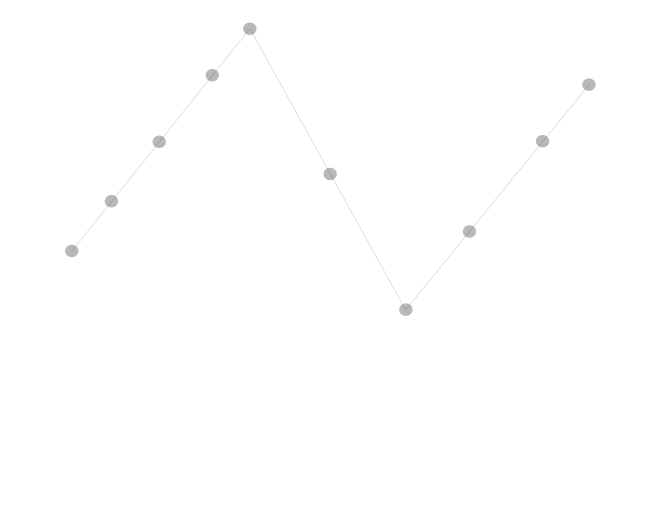

## U-turn: next permutation

The **lexicographic** or **lexicographical** order (also known as lexical order, or dictionary order) is a generalization of the alphabetical order of the dictionaries to sequences of ordered symbols.
The lexicographical order on the set of all these finite words orders the words as follows:

* Given two different words of the same length, say `a = a1, a2...ak` and `b = b1, b2...bk`, the order of the two words depends on the alphabetic order of the symbols in the first place i where the two words differ (counting from the beginning of the words): `a < b` if and only if `ai < bi` in the underlying order of the alphabet `A`.
* If two words have different lengths, the usual lexicographical order pads the shorter one with "blanks" (a special symbol that is treated as smaller than every element of `A`) at the end until the words are the same length, and then the words are compared as in the previous case.

In [ ]:
#@title Lexicographic compare
%%html

<svg width="112mm" height="44mm" version="1.1" viewBox="0 0 189.24 75.072" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:ns9="http://www.iki.fi/pav/software/textext/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(27.979 -6.1018)">
  <rect x="11.303" y="59.509" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.13258;fill:#00ac00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="-10.142" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.13258;fill:#00ac00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="11.24" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.13258;fill:#00ac00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.621" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.13258;fill:#00ac00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.003" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.13258;fill:#00ac00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="75.384" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="96.766" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="118.15" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="-10.079" y="59.509" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.13258;fill:#00ac00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.684" y="59.509" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.13258;fill:#00ac00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.066" y="59.509" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.13258;fill:#00ac00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="75.447" y="59.509" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="96.829" y="59.509" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="118.21" y="59.509" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="139.59" y="59.509" width="21.382" height="21.382" ry="3.2" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="-2.4392822" y="39.310387" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="-2.4392822" y="39.310387" style="fill-opacity:.49242;fill:#000000;stroke-width:.26458">3</tspan></text>
  <text x="18.653261" y="39.209202" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="18.653261" y="39.209202" style="fill-opacity:.49242;fill:#000000;stroke-width:.26458">5</tspan></text>
  <text x="39.951481" y="39.265526" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="39.951481" y="39.265526" style="fill-opacity:.49242;fill:#000000;stroke-width:.26458">1</tspan></text>
  <text x="61.7122" y="39.164341" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="61.7122" y="39.164341" style="fill-opacity:.49242;fill:#000000;stroke-width:.26458">8</tspan></text>
  <text x="-1.8781509" y="73.617149" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="-1.8781509" y="73.617149" style="fill-opacity:.49242;fill:#000000;stroke-width:.26458">3</tspan></text>
  <text x="18.868843" y="73.708313" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="18.868843" y="73.708313" style="fill-opacity:.49242;fill:#000000;stroke-width:.26458">5</tspan></text>
  <text x="40.481575" y="74.017082" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="40.481575" y="74.017082" style="fill-opacity:.49242;fill:#000000;stroke-width:.26458">1</tspan></text>
  <text x="61.975025" y="73.694489" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="61.975025" y="73.694489" style="fill-opacity:.49242;fill:#000000;stroke-width:.26458">8</tspan></text>
  <text x="83.546989" y="39.280933" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="83.546989" y="39.280933" style="fill-opacity:.49242;fill:#000000;stroke-width:.26458">1</tspan></text>
  <text x="83.142891" y="74.141174" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="83.142891" y="74.141174" style="fill-opacity:.49242;fill:#000000;stroke-width:.26458">5</tspan></text>
  <text x="100.32912" y="71.497726" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:7.5647px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.18912;word-spacing:0px" xml:space="preserve"><tspan x="100.32912" y="71.497726" style="fill-opacity:.49242;fill:#000000;stroke-width:.18912">...</tspan></text>
  <text x="122.38992" y="71.455513" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:7.5647px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.18912;word-spacing:0px" xml:space="preserve"><tspan x="122.38992" y="71.455513" style="fill-opacity:.49242;fill:#000000;stroke-width:.18912">...</tspan></text>
  <text x="144.31857" y="71.446419" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:7.5647px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.18912;word-spacing:0px" xml:space="preserve"><tspan x="144.31857" y="71.446419" style="fill-opacity:.49242;fill:#000000;stroke-width:.18912">...</tspan></text>
  <text x="100.81752" y="36.784973" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:7.5647px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.18912;word-spacing:0px" xml:space="preserve"><tspan x="100.81752" y="36.784973" style="fill-opacity:.49242;fill:#000000;stroke-width:.18912">...</tspan></text>
  <text x="122.217" y="36.775879" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:7.5647px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.18912;word-spacing:0px" xml:space="preserve"><tspan x="122.217" y="36.775879" style="fill-opacity:.49242;fill:#000000;stroke-width:.18912">...</tspan></text>
  <g transform="translate(30.203 6.1014)" ns9:alignment="middle center" ns9:inkscapeversion="1.0" ns9:jacobian_sqrt="1.0" ns9:pdfconverter="inkscape" ns9:preamble="C:\\Users\\User\\AppData\\Roaming\\inkscape\\extensions\\textext\\default_packages.tex" ns9:scale="2.834645669291339" ns9:texconverter="pdflatex" ns9:text="$x= y= x&lt;y$" ns9:version="1.1.0">
   <defs id="id-c8e1bb0a-51aa-4fcc-8487-f7c692f68aae"></defs>
   <g transform="translate(-149.01 -129.37)">
    <g transform="translate(-58.181 26.29)" style="fill:#000000">
     <g transform="translate(148.71 134.76)">
      <path d="m3.3281-3.0156c0.0625-0.25 0.29688-1.1719 0.98438-1.1719 0.046875 0 0.29688 0 0.5 0.125-0.28125 0.0625-0.46875 0.29688-0.46875 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375 0.21875 0 0.53125-0.17188 0.53125-0.57812 0-0.51562-0.57812-0.65625-0.92188-0.65625-0.57812 0-0.92188 0.53125-1.0469 0.75-0.25-0.65625-0.78125-0.75-1.0781-0.75-1.0312 0-1.6094 1.2812-1.6094 1.5312 0 0.10938 0.10938 0.10938 0.125 0.10938 0.078125 0 0.10938-0.03125 0.125-0.10938 0.34375-1.0625 1-1.3125 1.3438-1.3125 0.1875 0 0.53125 0.09375 0.53125 0.67188 0 0.3125-0.17188 0.96875-0.53125 2.375-0.15625 0.60938-0.51562 1.0312-0.95312 1.0312-0.0625 0-0.28125 0-0.5-0.125 0.25-0.0625 0.46875-0.26562 0.46875-0.54688 0-0.26562-0.21875-0.34375-0.35938-0.34375-0.3125 0-0.54688 0.25-0.54688 0.57812 0 0.45312 0.48438 0.65625 0.92188 0.65625 0.67188 0 1.0312-0.70312 1.0469-0.75 0.125 0.35938 0.48438 0.75 1.0781 0.75 1.0312 0 1.5938-1.2812 1.5938-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.09375 0-0.10938 0.046875-0.14062 0.10938-0.32812 1.0781-1 1.3125-1.3125 1.3125-0.39062 0-0.54688-0.3125-0.54688-0.65625 0-0.21875 0.046875-0.4375 0.15625-0.875z"/>
     </g>
    </g>
    <g transform="translate(-58.181 26.29)" style="fill:#000000">
     <g transform="translate(157.17 134.76)">
      <path d="m6.8438-3.2656c0.15625 0 0.34375 0 0.34375-0.1875 0-0.20312-0.1875-0.20312-0.32812-0.20312h-5.9688c-0.14062 0-0.32812 0-0.32812 0.20312 0 0.1875 0.1875 0.1875 0.32812 0.1875zm0.015625 1.9375c0.14062 0 0.32812 0 0.32812-0.20312 0-0.1875-0.1875-0.1875-0.34375-0.1875h-5.9531c-0.14062 0-0.32812 0-0.32812 0.1875 0 0.20312 0.1875 0.20312 0.32812 0.20312z"/>
     </g>
    </g>
    <g transform="translate(-76.706 62.274)" style="fill:#000000">
     <g transform="translate(167.69 134.76)">
      <path d="m4.8438-3.7969c0.046875-0.14062 0.046875-0.15625 0.046875-0.23438 0-0.17188-0.14062-0.26562-0.29688-0.26562-0.09375 0-0.25 0.0625-0.34375 0.20312-0.015625 0.0625-0.10938 0.35938-0.14062 0.54688-0.078125 0.25-0.14062 0.53125-0.20312 0.79688l-0.45312 1.7969c-0.03125 0.14062-0.46875 0.84375-1.125 0.84375-0.5 0-0.60938-0.4375-0.60938-0.8125 0-0.45312 0.17188-1.0781 0.5-1.9531 0.15625-0.40625 0.20312-0.51562 0.20312-0.71875 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.95312 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.28125-0.9375 0.67188-1.2344 1.0156-1.2344 0.078125 0 0.25 0 0.25 0.3125 0 0.25-0.10938 0.51562-0.17188 0.70312-0.40625 1.0625-0.57812 1.625-0.57812 2.0938 0 0.89062 0.625 1.1875 1.2188 1.1875 0.39062 0 0.71875-0.17188 1-0.45312-0.125 0.51562-0.25 1.0156-0.64062 1.5469-0.26562 0.32812-0.64062 0.625-1.0938 0.625-0.14062 0-0.59375-0.03125-0.76562-0.42188 0.15625 0 0.29688 0 0.42188-0.125 0.10938-0.078125 0.20312-0.21875 0.20312-0.40625 0-0.3125-0.26562-0.34375-0.35938-0.34375-0.23438 0-0.5625 0.15625-0.5625 0.64062 0 0.5 0.4375 0.875 1.0625 0.875 1.0156 0 2.0469-0.90625 2.3281-2.0312z"/>
     </g>
    </g>
    <g transform="translate(-76.706 62.274)" style="fill:#000000">
     <g transform="translate(175.7 134.76)">
      <path id="id-23844a54-e9d2-4447-87f7-baca0d02b1de" d="m6.8438-3.2656c0.15625 0 0.34375 0 0.34375-0.1875 0-0.20312-0.1875-0.20312-0.32812-0.20312h-5.9688c-0.14062 0-0.32812 0-0.32812 0.20312 0 0.1875 0.1875 0.1875 0.32812 0.1875zm0.015625 1.9375c0.14062 0 0.32812 0 0.32812-0.20312 0-0.1875-0.1875-0.1875-0.34375-0.1875h-5.9531c-0.14062 0-0.32812 0-0.32812 0.1875 0 0.20312 0.1875 0.20312 0.32812 0.20312z"/>
     </g>
    </g>
    <g id="id-9ddf25aa-cd3f-4670-9b31-f6c71bcad95f" style="fill:#000000">
     <g transform="translate(186.22 134.76)">
      <path d="m3.3281-3.0156c0.0625-0.25 0.29688-1.1719 0.98438-1.1719 0.046875 0 0.29688 0 0.5 0.125-0.28125 0.0625-0.46875 0.29688-0.46875 0.54688 0 0.15625 0.10938 0.34375 0.375 0.34375 0.21875 0 0.53125-0.17188 0.53125-0.57812 0-0.51562-0.57812-0.65625-0.92188-0.65625-0.57812 0-0.92188 0.53125-1.0469 0.75-0.25-0.65625-0.78125-0.75-1.0781-0.75-1.0312 0-1.6094 1.2812-1.6094 1.5312 0 0.10938 0.10938 0.10938 0.125 0.10938 0.078125 0 0.10938-0.03125 0.125-0.10938 0.34375-1.0625 1-1.3125 1.3438-1.3125 0.1875 0 0.53125 0.09375 0.53125 0.67188 0 0.3125-0.17188 0.96875-0.53125 2.375-0.15625 0.60938-0.51562 1.0312-0.95312 1.0312-0.0625 0-0.28125 0-0.5-0.125 0.25-0.0625 0.46875-0.26562 0.46875-0.54688 0-0.26562-0.21875-0.34375-0.35938-0.34375-0.3125 0-0.54688 0.25-0.54688 0.57812 0 0.45312 0.48438 0.65625 0.92188 0.65625 0.67188 0 1.0312-0.70312 1.0469-0.75 0.125 0.35938 0.48438 0.75 1.0781 0.75 1.0312 0 1.5938-1.2812 1.5938-1.5312 0-0.10938-0.078125-0.10938-0.10938-0.10938-0.09375 0-0.10938 0.046875-0.14062 0.10938-0.32812 1.0781-1 1.3125-1.3125 1.3125-0.39062 0-0.54688-0.3125-0.54688-0.65625 0-0.21875 0.046875-0.4375 0.15625-0.875z"/>
     </g>
    </g>
    <g style="fill:#000000">
     <g transform="translate(194.68 134.76)">
      <path id="id-4e898c43-b2fa-4183-b6cd-db0a1474826c" d="m6.7344-4.9688c0.10938-0.0625 0.1875-0.10938 0.1875-0.21875s-0.09375-0.20312-0.20312-0.20312c-0.03125 0-0.046875 0-0.17188 0.078125l-5.5312 2.5938c-0.10938 0.0625-0.1875 0.10938-0.1875 0.21875 0 0.125 0.078125 0.17188 0.1875 0.23438l5.5312 2.5938c0.125 0.078125 0.14062 0.078125 0.17188 0.078125 0.10938 0 0.20312-0.09375 0.20312-0.20312s-0.078125-0.15625-0.1875-0.21875l-5.2344-2.4844z"/>
     </g>
    </g>
    <g id="id-ed50ff53-d2a9-41fa-b052-ce642de0c63c" style="fill:#000000">
     <g transform="translate(205.2 134.76)">
      <path d="m4.8438-3.7969c0.046875-0.14062 0.046875-0.15625 0.046875-0.23438 0-0.17188-0.14062-0.26562-0.29688-0.26562-0.09375 0-0.25 0.0625-0.34375 0.20312-0.015625 0.0625-0.10938 0.35938-0.14062 0.54688-0.078125 0.25-0.14062 0.53125-0.20312 0.79688l-0.45312 1.7969c-0.03125 0.14062-0.46875 0.84375-1.125 0.84375-0.5 0-0.60938-0.4375-0.60938-0.8125 0-0.45312 0.17188-1.0781 0.5-1.9531 0.15625-0.40625 0.20312-0.51562 0.20312-0.71875 0-0.4375-0.3125-0.8125-0.8125-0.8125-0.95312 0-1.3125 1.4531-1.3125 1.5312 0 0.10938 0.09375 0.10938 0.10938 0.10938 0.10938 0 0.10938-0.03125 0.15625-0.1875 0.28125-0.9375 0.67188-1.2344 1.0156-1.2344 0.078125 0 0.25 0 0.25 0.3125 0 0.25-0.10938 0.51562-0.17188 0.70312-0.40625 1.0625-0.57812 1.625-0.57812 2.0938 0 0.89062 0.625 1.1875 1.2188 1.1875 0.39062 0 0.71875-0.17188 1-0.45312-0.125 0.51562-0.25 1.0156-0.64062 1.5469-0.26562 0.32812-0.64062 0.625-1.0938 0.625-0.14062 0-0.59375-0.03125-0.76562-0.42188 0.15625 0 0.29688 0 0.42188-0.125 0.10938-0.078125 0.20312-0.21875 0.20312-0.40625 0-0.3125-0.26562-0.34375-0.35938-0.34375-0.23438 0-0.5625 0.15625-0.5625 0.64062 0 0.5 0.4375 0.875 1.0625 0.875 1.0156 0 2.0469-0.90625 2.3281-2.0312z"/>
     </g>
    </g>
   </g>
  </g>
 </g>
</svg>


[31. Next Permutation](https://leetcode.com/problems/next-permutation/)

```
A permutation of an array of integers is an arrangement of its members into a sequence or linear order.
For example, for arr = [1,2,3], the following are all the permutations of arr: [1,2,3], [1,3,2], [2, 1, 3], [2, 3, 1], [3,1,2], [3,2,1].
The next permutation of an array of integers is the next lexicographically greater permutation of its integer.
More formally, if all the permutations of the array are sorted in one container according to their lexicographical order,
then the next permutation of that array is the permutation that follows it in the sorted container.
If such arrangement is not possible, the array must be rearranged as the lowest possible order (i.e., sorted in ascending order).
For example, the next permutation of arr = [1,2,3] is [1,3,2]. Similarly, the next permutation of arr = [2,3,1] is [3,1,2].
While the next permutation of arr = [3,2,1] is [1,2,3] because [3,2,1] does not have a lexicographical larger rearrangement.
Given an array of integers nums, find the next permutation of nums. The replacement must be in place and use only constant extra memory.

Example 1:
Input: nums = [1,2,3]
Output: [1,3,2]

Example 2:
Input: nums = [3,2,1]
Output: [1,2,3]

Example 3:
Input: nums = [1,1,5]
Output: [1,5,1]

Constraints:
1 <= nums.length <= 100
0 <= nums[i] <= 100
```

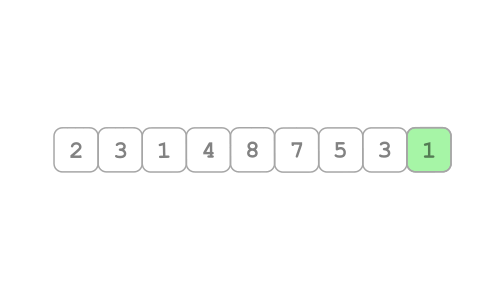

In [ ]:
def reverse(nums, l, r):
  while l<r:
    nums[l],nums[r] = nums[r],nums[l]
    l += 1
    r -= 1

# time: O(N); space: O(1)
def nextPermutation(self, nums):
  i = len(nums)-1
  while i and nums[i-1]>=nums[i]:
    i -= 1

  if i:
    j = i
    while j<len(nums) and nums[i-1]<nums[j]:
      j += 1
    nums[i-1],nums[j-1] = nums[j-1],nums[i-1]
  reverse(nums, i, len(nums)-1)

## Merge two sorted arrays

Similar Problem: [Merge Sorted Arrays](https://leetcode.com/problems/merge-sorted-array/)


```
Return sorted array that contains the elements of two given sorted arrays.
 ```

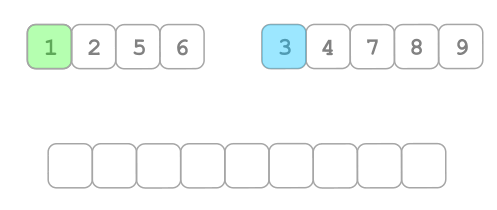

In [ ]:
# time: O(N); space: O(N)
def merge(x,y):
  i,j,out = 0,0,[]
  while i+j<len(x)+len(y):
    if j==len(y) or i<len(x) and x[i]<y[j]:
      out += [x[i]]
      i += 1
    else :
      out += [y[j]]
      j += 1
  return out

## Do inplace partition

Similar problem: [905. Sort Array By Parity](https://leetcode.com/problems/sort-array-by-parity/discuss/1150627/6%2B-solutions)

```
Given an integer array nums and an integer t. You task is to do a partition:
all numbers less than t must appear before any number that is greater than t.
```

Partition - is sorting of an array that contains `0s`(`element<=t`) and `1s`(`element>t`).


Not-inplace partition is easy:

In [ ]:
# time: O(N); space: O(N)
def partition(nums, t):
  return ([e for e in nums if e<=t],
          [e for e in nums if e>t])


Let's do it inplace.

In [ ]:
#@title ###Lomuto scheme
%%html
<div id="slide_0" style="max-width:750px; height:200px;">
<font face="helvetica" color="black" size="4">
</font><br>
<?xml version="1.0" encoding="UTF-8"?>
<svg width="181mm" height="25mm" version="1.1" viewBox="0 0 278.53 38.068" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(10.425 -24.475)">
  <rect x="-10.142" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="11.24" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.621" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.003" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="75.384" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="96.766" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="118.15" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="139.53" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="83.490356" y="60.570686" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="83.490356" y="60.570686" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="169.71138" y="60.33112" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="169.71138" y="60.33112" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">j</tspan></text>
  <rect x="203.67" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="246.43" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 </g>
 <rect x="171.34" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="192.72" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="235.48" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
</svg>
</div>

<div id="slide_1" style="max-width:750px; height:200px;">
<font face="helvetica" color="black" size="4">
</font><br>
<?xml version="1.0" encoding="UTF-8"?>
<svg width="181mm" height="25mm" version="1.1" viewBox="0 0 278.53 38.068" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(10.425 -24.475)">
  <rect x="-10.142" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="11.24" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.621" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.003" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="160.91" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="96.766" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="118.15" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="139.53" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="104.66217" y="60.570686" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="104.66217" y="60.570686" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="190.06889" y="60.33112" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="190.06889" y="60.33112" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">j</tspan></text>
  <rect x="203.67" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="246.43" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="82.72506" y="60.531654" style="fill-opacity:.23106;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="82.72506" y="60.531654" style="fill-opacity:.23106;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="168.94608" y="60.292084" style="fill-opacity:.23106;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="168.94608" y="60.292084" style="fill-opacity:.23106;fill:#000000;stroke-width:.26458">j</tspan></text>
 </g>
 <rect x="85.809" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="192.72" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="235.48" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
</svg>

</div>


<div id="slide_2" style="max-width:750px; height:200px;">
<font face="helvetica" color="black" size="4">
</font><br>
<?xml version="1.0" encoding="UTF-8"?>
<svg width="181mm" height="25mm" version="1.1" viewBox="0 0 278.53 38.068" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(10.425 -24.475)">
  <rect x="-10.142" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="11.24" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.621" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.003" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="160.91" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="182.29" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="118.15" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="139.53" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="126.64827" y="60.570686" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="126.64827" y="60.570686" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="211.24071" y="60.33112" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="211.24071" y="60.33112" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">j</tspan></text>
  <rect x="203.67" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="246.43" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="104.71117" y="60.531654" style="fill-opacity:.23106;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="104.71117" y="60.531654" style="fill-opacity:.23106;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="190.11789" y="60.292084" style="fill-opacity:.23106;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="190.11789" y="60.292084" style="fill-opacity:.23106;fill:#000000;stroke-width:.26458">j</tspan></text>
 </g>
 <rect x="85.809" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="107.19" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="235.48" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
</svg>
</div>


<div id="slide_3" style="max-width:750px; height:200px;">
<font face="helvetica" color="black" size="4">
</font><br>
<svg width="181mm" height="25mm" version="1.1" viewBox="0 0 278.53 38.068" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(10.425 -24.475)">
  <rect x="-10.142" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="11.24" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.621" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.003" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="160.91" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="182.29" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="118.15" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="139.53" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="126.64827" y="60.570686" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="126.64827" y="60.570686" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="233.22682" y="60.33112" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="233.22682" y="60.33112" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">j</tspan></text>
  <rect x="203.67" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="246.43" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="104.71117" y="60.531654" style="fill-opacity:.23106;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="104.71117" y="60.531654" style="fill-opacity:.23106;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="212.104" y="60.292084" style="fill-opacity:.23106;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="212.104" y="60.292084" style="fill-opacity:.23106;fill:#000000;stroke-width:.26458">j</tspan></text>
 </g>
 <rect x="85.809" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="107.19" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="235.48" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
</svg>

</div>


<div id="slide_4" style="max-width:750px; height:200px;">
<font face="helvetica" color="black" size="4">
</font><br>
<?xml version="1.0" encoding="UTF-8"?>
<svg width="181mm" height="25mm" version="1.1" viewBox="0 0 278.53 38.068" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(10.425 -24.475)">
  <rect x="-10.142" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="11.24" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.621" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.003" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="160.91" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="182.29" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="225.05" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="139.53" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="148.63438" y="60.570686" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="148.63438" y="60.570686" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="254.39864" y="60.33112" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="254.39864" y="60.33112" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">j</tspan></text>
  <rect x="203.67" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="246.43" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="126.69727" y="60.531654" style="fill-opacity:.23106;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="126.69727" y="60.531654" style="fill-opacity:.23106;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="233.27582" y="60.292084" style="fill-opacity:.23106;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="233.27582" y="60.292084" style="fill-opacity:.23106;fill:#000000;stroke-width:.26458">j</tspan></text>
 </g>
 <rect x="85.809" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="107.19" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="128.57" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
</svg>
</div>

<div id="slide_5" style="max-width:750px; height:200px;">
<font face="helvetica" color="black" size="4">
</font><br>
<?xml version="1.0" encoding="UTF-8"?>
<svg width="181mm" height="25mm" version="1.1" viewBox="0 0 278.53 38.068" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(10.425 -24.475)">
  <rect x="-10.142" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="11.24" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.621" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.003" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="160.91" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="182.29" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="225.05" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="139.53" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="148.63438" y="60.570686" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="148.63438" y="60.570686" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">i</tspan></text>
  <rect x="203.67" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="246.43" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="126.69727" y="60.531654" style="fill-opacity:.23106;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="126.69727" y="60.531654" style="fill-opacity:.23106;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="254.44763" y="60.292084" style="fill-opacity:.23106;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="254.44763" y="60.292084" style="fill-opacity:.23106;fill:#000000;stroke-width:.26458">j</tspan></text>
 </g>
 <rect x="85.809" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="107.19" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 <rect x="128.57" y=".283" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
</svg>
</div>

<div style="position:absolute; top:50px; left:270mm;">

<div id="arrow_left" style="border-width: 1px; border-style:solid; float:left; height:32px;">
<svg width="8.7464mm" height="8.7464mm" version="1.1" viewBox="0 0 8.7464 8.7464" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
<metadata>
<rdf:RDF>
<cc:Work rdf:about="">
<dc:format>image/svg+xml</dc:format>
<dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
<dc:title/>
</cc:Work>
</rdf:RDF>
</metadata>
<g transform="translate(-38.564 -29.908)">
<rect x="38.564" y="29.908" width="8.7464" height="8.7464" fill-opacity=".16425" opacity=".97" stroke-miterlimit="10.433" stroke-width="0"/>
<path d="m45.796 34.331h-5.8931" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
<path d="m40.068 34.267 2.7141-2.4238" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
<path d="m40.069 34.396 2.7141 2.4238" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
</g>
</svg>
</div>

<div id="arrow_right" style="border-width: 1px; border-style:solid; float:right; height:32px;">
<svg width="8.7464mm" height="8.7464mm" version="1.1" viewBox="0 0 8.7464 8.7464" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
<metadata>
<rdf:RDF>
<cc:Work rdf:about="">
<dc:format>image/svg+xml</dc:format>
<dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
<dc:title/>
</cc:Work>
</rdf:RDF>
</metadata>
<g transform="translate(-38.564 -29.908)">
<rect transform="scale(-1,1)" x="-47.31" y="29.908" width="8.7464" height="8.7464" fill-opacity=".16425" opacity=".97" stroke-miterlimit="10.433" stroke-width="0"/>
<path d="m40.078 34.331h5.8931" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
<path d="m45.806 34.267-2.7141-2.4238" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
<path d="m45.805 34.396-2.7141 2.4238" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
</g>
</svg>
</div>

</div>



<style>
#arrow_left:hover{color:blue;}
#arrow_right:hover{color:blue;}
</style>

<script  type="text/javascript">
var slides = ["slide_0", "slide_1", "slide_2", "slide_3", "slide_4", "slide_5"];
var left_btn_id = "arrow_left";
var right_btn_id = "arrow_right";
var current_slide = 0;

function slide_left()
{
  var old_slide = document.getElementById(slides[current_slide]);
  current_slide -= 1;
  if (current_slide < 0) {current_slide = 0;}
  var new_slide = document.getElementById(slides[current_slide]);
  old_slide.style.display='none';
  new_slide.style.display='block';
}

function slide_right()
{
  var old_slide = document.getElementById(slides[current_slide]);
  current_slide += 1;
  if (current_slide >= slides.length) {current_slide = slides.length - 1;}
  var new_slide = document.getElementById(slides[current_slide]);
  old_slide.style.display='none';
  new_slide.style.display='block';
}

for (let i=0; i < slides.length; i++)
{
  document.getElementById(slides[i]).style.display='none';
}
document.getElementById(left_btn_id).addEventListener("click", slide_left);
document.getElementById(right_btn_id).addEventListener("click", slide_right);
document.getElementById(slides[current_slide]).style.display='block';
</script>

Although two algorithms below could be classified as two pointers algorithms, the two pointers don't move independently at each iteration: sometimes both of them advance at once.

### Lomuto partition scheme

In [ ]:
# inplace time: O(N); space: O(1)
def partition(nums, t):
  i = j = 0
  while j<len(nums):
    if nums[j]<=t:
      nums[i],nums[j] = nums[j],nums[i]
      i += 1
    j += 1
  return nums

In [ ]:
#@title ###Hoare's scheme
%%html
<div id="slide_0" style="max-width:750px; height:200px;">
<font face="helvetica" color="black" size="4">
</font><br>
<?xml version="1.0" encoding="UTF-8"?>
<svg width="181mm" height="25mm" version="1.1" viewBox="0 0 278.53 38.068" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(10.425 -24.475)">
  <rect x="-10.142" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="11.24" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.621" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.003" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="182.29" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="203.67" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="225.06" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="246.44" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="83.490356" y="60.570686" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="83.490356" y="60.570686" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="169.71138" y="60.33112" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="169.71138" y="60.33112" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">j</tspan></text>
  <rect x="75.385" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="96.767" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="139.53" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="160.91" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="118.15" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
 </g>
</svg>
</div>

<div id="slide_1" style="max-width:750px; height:200px;">
<font face="helvetica" color="black" size="4">
</font><br>
<?xml version="1.0" encoding="UTF-8"?>
<svg width="181mm" height="25mm" version="1.1" viewBox="0 0 278.53 38.068" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(10.425 -24.475)">
  <rect x="-10.142" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="11.24" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.621" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.003" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="182.29" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="203.67" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="225.06" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="246.44" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="83.490356" y="60.570686" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="83.490356" y="60.570686" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="147.72527" y="60.33112" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="147.72527" y="60.33112" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">j</tspan></text>
  <rect x="75.385" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="96.767" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="139.53" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="160.91" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="118.15" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="169.71024" y="60.336468" style="fill-opacity:.22348;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="169.71024" y="60.336468" style="fill-opacity:.22348;fill:#000000;stroke-width:.26458">j</tspan></text>
 </g>
</svg>

</div>


<div id="slide_2" style="max-width:750px; height:200px;">
<font face="helvetica" color="black" size="4">
</font><br>
<?xml version="1.0" encoding="UTF-8"?>
<svg width="181mm" height="25mm" version="1.1" viewBox="0 0 278.53 38.068" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(10.425 -24.475)">
  <rect x="-10.142" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="11.24" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.621" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.003" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="182.29" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="203.67" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="225.06" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="246.44" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="83.490356" y="60.570686" style="fill-opacity:.21212;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="83.490356" y="60.570686" style="fill-opacity:.21212;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="147.72527" y="60.33112" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="147.72527" y="60.33112" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">j</tspan></text>
  <rect x="75.385" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="96.767" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="139.53" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="160.91" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="118.15" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="104.63732" y="60.524246" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="104.63732" y="60.524246" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">i</tspan></text>
 </g>
</svg>
</div>


<div id="slide_3" style="max-width:750px; height:200px;">
<font face="helvetica" color="black" size="4">
</font><br>
<?xml version="1.0" encoding="UTF-8"?>
<svg width="181mm" height="25mm" version="1.1" viewBox="0 0 278.53 38.068" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(10.425 -24.475)">
  <rect x="-10.142" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="11.24" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.621" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.003" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="182.29" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="203.67" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="225.06" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="246.44" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="104.66217" y="60.570686" style="fill-opacity:.21212;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="104.66217" y="60.570686" style="fill-opacity:.21212;fill:#000000;stroke-width:.26458">i</tspan></text>
  <text x="147.72527" y="60.33112" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="147.72527" y="60.33112" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">j</tspan></text>
  <rect x="75.385" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="96.767" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="118.15" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="160.91" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="139.53" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="125.80912" y="60.524246" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="125.80912" y="60.524246" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">i</tspan></text>
 </g>
</svg>
</div>

<div id="slide_4" style="max-width:750px; height:200px;">
<font face="helvetica" color="black" size="4">
</font><br>
<?xml version="1.0" encoding="UTF-8"?>
<svg width="181mm" height="25mm" version="1.1" viewBox="0 0 278.53 38.068" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(10.425 -24.475)">
  <rect x="-10.142" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="11.24" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="32.621" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="54.003" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="182.29" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="203.67" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="225.06" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="246.44" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="147.82008" y="60.570686" style="fill-opacity:.21212;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="147.82008" y="60.570686" style="fill-opacity:.21212;fill:#000000;stroke-width:.26458">j</tspan></text>
  <text x="128.18205" y="60.33112" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="128.18205" y="60.33112" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">j</tspan></text>
  <rect x="75.385" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="96.767" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="118.15" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.32955;fill:#00c300;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="160.91" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <rect x="139.53" y="24.758" width="21.382" height="21.382" ry="3.2" style="fill-opacity:.34091;fill:#ff9d00;opacity:.999;stroke-linecap:round;stroke-width:.567;stroke:#c8c8c8"/>
  <text x="123.36622" y="60.524246" style="fill-opacity:.60227;fill:#000000;font-family:'Courier New';font-size:10.583px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.26458;word-spacing:0px" xml:space="preserve"><tspan x="123.36622" y="60.524246" style="fill-opacity:.60227;fill:#000000;stroke-width:.26458">i</tspan></text>
 </g>
</svg>
</div>

<div style="position:absolute; top:50px; left:270mm;">

<div id="arrow_left" style="border-width: 1px; border-style:solid; float:left; height:32px;">
<svg width="8.7464mm" height="8.7464mm" version="1.1" viewBox="0 0 8.7464 8.7464" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
<metadata>
<rdf:RDF>
<cc:Work rdf:about="">
<dc:format>image/svg+xml</dc:format>
<dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
<dc:title/>
</cc:Work>
</rdf:RDF>
</metadata>
<g transform="translate(-38.564 -29.908)">
<rect x="38.564" y="29.908" width="8.7464" height="8.7464" fill-opacity=".16425" opacity=".97" stroke-miterlimit="10.433" stroke-width="0"/>
<path d="m45.796 34.331h-5.8931" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
<path d="m40.068 34.267 2.7141-2.4238" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
<path d="m40.069 34.396 2.7141 2.4238" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
</g>
</svg>
</div>

<div id="arrow_right" style="border-width: 1px; border-style:solid; float:right; height:32px;">
<svg width="8.7464mm" height="8.7464mm" version="1.1" viewBox="0 0 8.7464 8.7464" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
<metadata>
<rdf:RDF>
<cc:Work rdf:about="">
<dc:format>image/svg+xml</dc:format>
<dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
<dc:title/>
</cc:Work>
</rdf:RDF>
</metadata>
<g transform="translate(-38.564 -29.908)">
<rect transform="scale(-1,1)" x="-47.31" y="29.908" width="8.7464" height="8.7464" fill-opacity=".16425" opacity=".97" stroke-miterlimit="10.433" stroke-width="0"/>
<path d="m40.078 34.331h5.8931" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
<path d="m45.806 34.267-2.7141-2.4238" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
<path d="m45.805 34.396-2.7141 2.4238" fill="none" stroke="#fff" stroke-opacity=".98068" stroke-width=".5"/>
</g>
</svg>
</div>

</div>



<style>
#arrow_left:hover{color:blue;}
#arrow_right:hover{color:blue;}
</style>

<script  type="text/javascript">
var slides = ["slide_0", "slide_1", "slide_2", "slide_3", "slide_4"];
var left_btn_id = "arrow_left";
var right_btn_id = "arrow_right";
var current_slide = 0;

function slide_left()
{
  var old_slide = document.getElementById(slides[current_slide]);
  current_slide -= 1;
  if (current_slide < 0) {current_slide = 0;}
  var new_slide = document.getElementById(slides[current_slide]);
  old_slide.style.display='none';
  new_slide.style.display='block';
}

function slide_right()
{
  var old_slide = document.getElementById(slides[current_slide]);
  current_slide += 1;
  if (current_slide >= slides.length) {current_slide = slides.length - 1;}
  var new_slide = document.getElementById(slides[current_slide]);
  old_slide.style.display='none';
  new_slide.style.display='block';
}

for (let i=0; i < slides.length; i++)
{
  document.getElementById(slides[i]).style.display='none';
}
document.getElementById(left_btn_id).addEventListener("click", slide_left);
document.getElementById(right_btn_id).addEventListener("click", slide_right);
document.getElementById(slides[current_slide]).style.display='block';
</script>

### Hoare's partition scheme

In [ ]:
# inplace time: O(N); space: O(1)
def partition1(nums, t):
  i,j = 0,len(nums)-1
  while i<j:
    if t<=nums[i]:
      nums[i],nums[j] = nums[j],nums[i]
      j -= 1
    i += 1
  return nums

Here's another problem on the array consisting of zeroes and ones.

## Max Consecutive Ones

[1004. Max Consecutive Ones III](https://leetcode.com/problems/max-consecutive-ones-iii/discuss/1204962/easiest-1-liner-in-my-life/2067812)

```
Given a binary array nums and an integer k, return the maximum number of consecutive 1's in the array if you can flip at most k 0's.

Example 1:
Input: nums = [1,1,1,0,0,0,1,1,1,1,0], k = 2
Output: 6

Example 2:
Input: nums = [0,0,1,1,0,0,1,1,1,0,1,1,0,0,0,1,1,1,1], k = 3
Output: 10

Constraints:
1 <= nums.length <= 10^5
nums[i] is either 0 or 1.
0 <= k <= nums.length
```


In [ ]:
# time: O(N); space: O(1)
def longestOnes(nums, k):
  i = j = out = 0
  while i<len(nums):
    if nums[i] or k:
      k -= 1-nums[i]
      i += 1
    else:
      k += 1-nums[j]
      j += 1
    out = max(out, i-j)
  return out

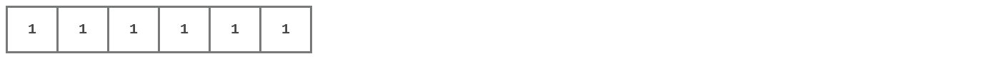

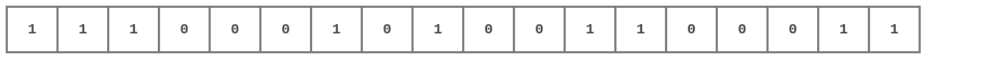

## Replace the Substring for Balanced String

[1234. Replace the Substring for Balanced String](https://leetcode.com/problems/replace-the-substring-for-balanced-string/discuss/1366164/breathing-window/1944393)

```
You are given a string s of length n containing only four kinds of characters: 'Q', 'W', 'E', and 'R'.
A string is said to be balanced if each of its characters appears n/4 times where n is the length of the string.
Return the minimum length of the substring that can be replaced with any other string of the same length to make s balanced.
If s is already balanced, return 0.

Example 1:
Input: s = "QWER"
Output: 0
Explanation: s is already balanced.

Example 2:
Input: s = "QQWE"
Output: 1
Explanation: We need to replace a 'Q' to 'R', so that "RQWE" (or "QRWE") is balanced.

Example 3:
Input: s = "QQQW"
Output: 2
Explanation: We can replace the first "QQ" to "ER".

Constraints:
n == s.length
4 <= n <= 10^5
n is a multiple of 4.
s contains only 'Q', 'W', 'E', and 'R'.
```

In [ ]:
# time: O(N); space: O(1)
def balancedString(s):
  cache = {'Q': 0, 'W': 0, 'E': 0, 'R': 0}
  for ch in s: cache[ch] += 1;

  n_symb = len(s)//4
  l,r = 0,-1
  out = len(s)
  while r<len(s) and l<len(s):
    if cache['Q'] <= n_symb and cache['W'] <= n_symb and cache['E'] <= n_symb and cache['R'] <= n_symb :
      out = min(out, r-l+1)
      cache[s[l]] += 1
      l += 1
    else:
      r += 1
      if r >= len(s):
         break;
      cache[s[r]] -= 1
  return out

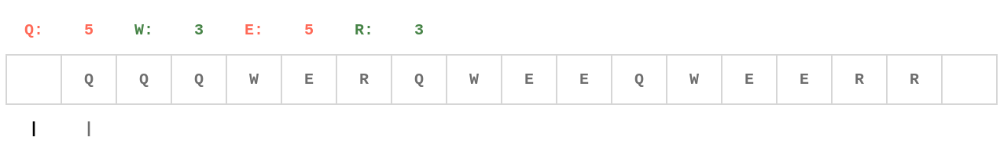

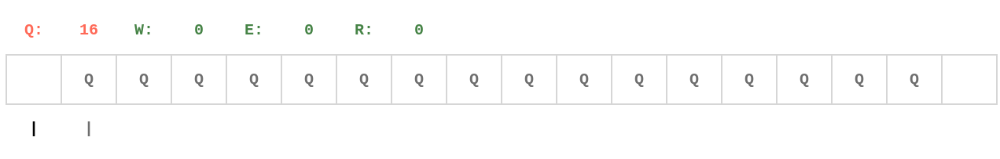

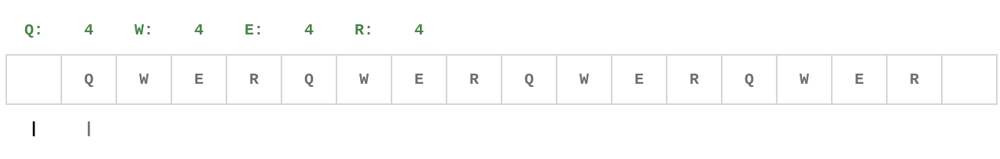

## Maximum Distance Between a Pair of Values

[1855. Maximum Distance Between a Pair of Values](https://leetcode.com/problems/maximum-distance-between-a-pair-of-values/discuss/1218846/nice-gifs)

```
You are given two non-increasing 0-indexed integer arrays nums1 and nums2.
A pair of indices (i, j), where 0 <= i < nums1.length and 0 <= j < nums2.length, is valid if both i <= j and nums1[i] <= nums2[j].
The distance of the pair is j-i.
Return the maximum distance of any valid pair (i, j). If there are no valid pairs, return 0.
An array arr is non-increasing if arr[i-1] >= arr[i] for every 1 <= i < arr.length.

Example 1:
Input: nums1 = [55,30,5,4,2], nums2 = [100,20,10,10,5]
Output: 2
Explanation: The valid pairs are (0,0), (2,2), (2,3), (2,4), (3,3), (3,4), and (4,4).
The maximum distance is 2 with pair (2,4).

Example 2:
Input: nums1 = [2,2,2], nums2 = [10,10,1]
Output: 1
Explanation: The valid pairs are (0,0), (0,1), and (1,1).
The maximum distance is 1 with pair (0,1).

Example 3:
Input: nums1 = [30,29,19,5], nums2 = [25,25,25,25,25]
Output: 2
Explanation: The valid pairs are (2,2), (2,3), (2,4), (3,3), and (3,4).
The maximum distance is 2 with pair (2,4).

Constraints:
1 <= nums1.length, nums2.length <= 10^5
1 <= nums1[i], nums2[j] <= 10^5
Both nums1 and nums2 are non-increasing.
```

In [ ]:
# time: O(N); space: O(1)
def maxDistance(nums1, nums2):
  i,j,out = 0,0,0
  while i<len(nums1) and j<len(nums2):
    if nums2[j]>=nums1[i]:
      out = max(out, j-i)
      j += 1
    else:
      i += 1
  return out

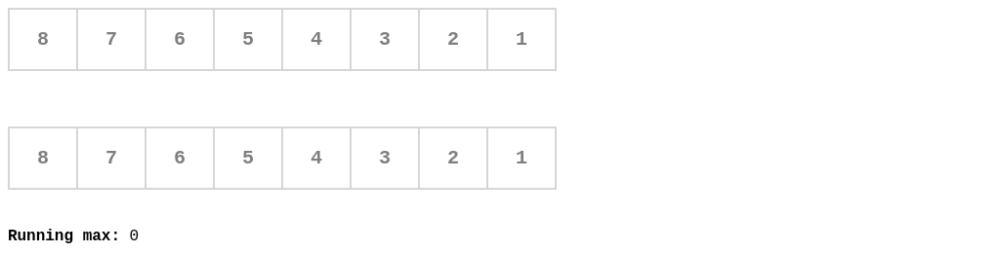

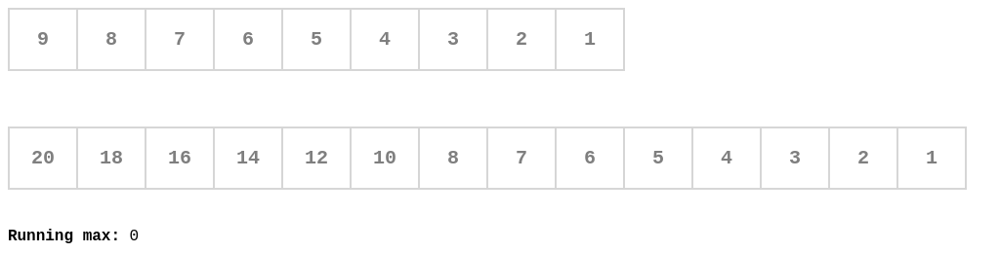

## The Dutch national flag problem

[75. Sort Colors](https://leetcode.com/problems/sort-colors/)

```
Given an array nums with n objects colored red, white, or blue, sort them in-place so that objects of the
same color are adjacent, with the colors in the order red, white, and blue.
We will use the integers 0, 1, and 2 to represent the color red, white, and blue, respectively.
You must solve this problem without using the library's sort function.

Example 1:
Input: nums = [2,0,2,1,1,0]
Output: [0,0,1,1,2,2]

Example 2:
Input: nums = [2,0,1]
Output: [0,1,2]

Constraints:
n == nums.length
1 <= n <= 300
nums[i] is either 0, 1, or 2.
```

The **Dutch national flag problem** is a computational problem proposed by Edsger Dijkstra. The flag of the Netherlands consists of three colors: red, white, and blue. Given balls of these three colors arranged randomly in a line (it does not matter how many balls there are), the task is to arrange them such that all balls of the same color are together and their collective color groups are in the correct order.

![](https://upload.wikimedia.org/wikipedia/commons/archive/2/20/20060827141536%21Flag_of_the_Netherlands.svg)

The Dutch national flag problem - is sorting of an array that contains `0s`, `1s` and `2s`.

In [ ]:
#@title Two pointer go right, one goes left
%%html

<svg width="227mm" height="35mm" version="1.1" viewBox="0 0 606.62 93.742" xmlns="http://www.w3.org/2000/svg" xmlns:cc="http://creativecommons.org/ns#" xmlns:dc="http://purl.org/dc/elements/1.1/" xmlns:rdf="http://www.w3.org/1999/02/22-rdf-syntax-ns#">
 <metadata>
  <rdf:RDF>
   <cc:Work rdf:about="">
    <dc:format>image/svg+xml</dc:format>
    <dc:type rdf:resource="http://purl.org/dc/dcmitype/StillImage"/>
    <dc:title/>
   </cc:Work>
  </rdf:RDF>
 </metadata>
 <g transform="translate(48.778 -184.12)">
  <rect x="-48.778" y="184.12" width="606.62" height="93.742" style="fill:#ffffff;opacity:.999"/>
  <g transform="translate(0 -19.579)">
   <g transform="rotate(-71.136 373.48 62.68)">
    <g transform="rotate(-33.469 207.74 139.38)">
     <g transform="rotate(-34.51 207.74 139.38)">
      <text transform="rotate(139.11)" x="-341.82208" y="-198.59862" style="fill:#ff0000;font-family:'Courier New';font-size:19.446px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.486;word-spacing:0px" xml:space="preserve"><tspan x="-341.82208" y="-198.59862" style="fill:#ff0000;stroke-width:.486">i</tspan></text>
     </g>
    </g>
   </g>
   <rect transform="rotate(179.91)" x="-443.06" y="-261.67" width="33.976" height="33.976" ry="6.454" style="fill-opacity:.31818;fill:#00a6ff;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
   <rect transform="rotate(179.91)" x="-409.08" y="-261.67" width="33.976" height="33.976" ry="6.454" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
   <text transform="rotate(-1.3432)" x="415.22351" y="259.49338" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="415.22351" y="259.49338" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">2</tspan></text>
   <rect transform="rotate(179.88)" x="-510.87" y="-262.15" width="33.976" height="33.976" ry="6.454" style="fill-opacity:.31818;fill:#00a6ff;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
   <text transform="rotate(-.25022)" x="487.87213" y="251.67674" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="487.87213" y="251.67674" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">2</tspan></text>
   <rect transform="rotate(179.88)" x="-544.84" y="-262.15" width="33.976" height="33.976" ry="6.454" style="fill-opacity:.31818;fill:#00a6ff;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
   <rect transform="rotate(179.88)" x="-476.89" y="-262.15" width="33.976" height="33.976" ry="6.454" style="fill-opacity:.31818;fill:#00a6ff;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
   <text transform="rotate(-.35155)" x="521.54321" y="252.84456" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="521.54321" y="252.84456" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">2</tspan></text>
   <text transform="rotate(1.1516)" x="458.99014" y="240.23033" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="458.99014" y="240.23033" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">2</tspan></text>
   <text x="387.1217" y="287.38245" style="fill:#ff0000;font-family:'Courier New';font-size:19.446px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.486;word-spacing:0px" xml:space="preserve"><tspan x="387.1217" y="287.38245" style="fill:#008fff;stroke-width:.486">k</tspan></text>
   <text transform="rotate(.27668)" x="387.97308" y="247.69771" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="387.97308" y="247.69771" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">0</tspan></text>
   <g transform="rotate(-71.136 439.76 -32.049)">
    <g transform="rotate(-33.469 207.74 139.38)">
     <g transform="rotate(-34.51 207.74 139.38)">
      <text transform="rotate(139.11)" x="-341.82208" y="-198.59862" style="fill:#ff0000;font-family:'Courier New';font-size:19.446px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.486;word-spacing:0px" xml:space="preserve"><tspan x="-341.82208" y="-198.59862" style="fill-opacity:.64394;fill:#000000;stroke-width:.486">j</tspan></text>
     </g>
    </g>
   </g>
  </g>
  <g transform="translate(14.846 85.466)">
   <rect x="-13.109" y="122.4" width="33.976" height="33.976" ry="6.454" style="fill-opacity:.23864;fill:#ff0000;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
   <rect x="-47.086" y="122.4" width="33.976" height="33.976" ry="6.454" style="fill-opacity:.23864;fill:#ff0000;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
   <text x="-36.057789" y="145.66258" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="-36.057789" y="145.66258" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">0</tspan></text>
   <text x="-1.3429669" y="145.53392" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="-1.3429669" y="145.53392" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">0</tspan></text>
   <g transform="rotate(-27.214 88.82 139.38)">
    <g transform="rotate(-26.479 88.82 139.38)">
     <g transform="rotate(-26.86 88.82 139.38)">
      <g transform="rotate(-25.794 88.82 139.38)">
       <g transform="rotate(-25.342 88.82 139.38)">
        <g transform="rotate(-24.358 88.82 139.38)">
         <g transform="rotate(-24.041 88.82 139.38)">
          <rect x="20.867" y="122.4" width="33.976" height="33.976" ry="6.454" style="fill-opacity:.10227;fill:#000000;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
          <rect x="54.843" y="122.4" width="33.976" height="33.976" ry="6.454" style="fill-opacity:.10227;fill:#000000;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
          <rect x="88.82" y="122.4" width="33.976" height="33.976" ry="6.454" style="fill-opacity:.23864;fill:#ff0000;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
          <rect x="122.8" y="122.4" width="33.976" height="33.976" ry="6.454" style="fill-opacity:.23864;fill:#ff0000;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
          <text transform="rotate(178.75)" x="-40.185646" y="-134.63547" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="-40.185646" y="-134.63547" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">1</tspan></text>
          <text transform="rotate(180.37)" x="-78.39666" y="-133.40285" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="-78.39666" y="-133.40285" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">1</tspan></text>
          <text transform="rotate(181.23)" x="-114.7375" y="-131.90645" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="-114.7375" y="-131.90645" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">0</tspan></text>
          <text transform="rotate(180.33)" x="-146.85165" y="-133.23749" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="-146.85165" y="-133.23749" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">0</tspan></text>
         </g>
        </g>
       </g>
      </g>
     </g>
    </g>
   </g>
   <g transform="rotate(-71.136 232.61 104.6)">
    <g transform="rotate(-33.469 121.42 142.59)">
     <g transform="rotate(-34.51 207.74 139.38)">
      <g transform="rotate(62.812 207.93 139.96)">
       <text transform="rotate(76.052)" x="180.25453" y="-162.08388" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="180.25453" y="-162.08388" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">1</tspan></text>
      </g>
      <rect transform="rotate(-41.009)" x="14.336" y="224.5" width="33.976" height="33.976" ry="6.454" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
      <rect transform="rotate(-41.009)" x="48.313" y="224.5" width="33.976" height="33.976" ry="6.454" style="fill-opacity:.10227;fill:#000000;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
      <rect transform="rotate(-41.009)" x="82.289" y="224.5" width="33.976" height="33.976" ry="6.454" style="fill-opacity:.10227;fill:#000000;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
      <text transform="rotate(138.76)" x="-35.690952" y="-236.03632" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="-35.690952" y="-236.03632" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">1</tspan></text>
      <text transform="rotate(140.27)" x="-110.87682" y="-233.86433" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="-110.87682" y="-233.86433" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">1</tspan></text>
     </g>
     <g transform="rotate(-34.51 353.86 229.76)">
      <g transform="rotate(62.812 207.93 139.96)">
       <text transform="rotate(76.052)" x="180.25453" y="-162.08388" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="180.25453" y="-162.08388" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">2</tspan></text>
      </g>
      <rect transform="rotate(-41.009)" x="14.336" y="224.5" width="33.976" height="33.976" ry="6.454" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
      <rect transform="rotate(-41.009)" x="48.313" y="224.5" width="33.976" height="33.976" ry="6.454" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
      <rect transform="rotate(-41.009)" x="82.289" y="224.5" width="33.976" height="33.976" ry="6.454" style="fill:none;opacity:.999;stroke-linecap:round;stroke-width:1.1735;stroke:#a6a6a6"/>
      <text transform="rotate(138.76)" x="-35.690952" y="-236.03632" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="-35.690952" y="-236.03632" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">2</tspan></text>
      <text transform="rotate(140.27)" x="-110.87682" y="-233.86433" style="fill-opacity:.49242;fill:#000000;font-family:'Courier New';font-size:18.75px;font-weight:bold;letter-spacing:0px;line-height:1.25;stroke-width:.46875;word-spacing:0px" xml:space="preserve"><tspan x="-110.87682" y="-233.86433" style="fill-opacity:.49242;fill:#000000;stroke-width:.46875">0</tspan></text>
     </g>
    </g>
   </g>
  </g>
 </g>
</svg>


In this algo two pointers advance from left to right and one goes from right to left. Note that three pointers are not completely independent: sometimes two of them advance at once.

In [ ]:
# inplace time: O(N); space: O(1)
def sortColors(nums):
  i,j,k = 0,0,len(nums)-1
  while j<=k:
    match nums[j]:
      case 0:
        nums[i],nums[j] = nums[j],nums[i];
        i += 1
        j += 1
      case 1:
        j += 1
      case 2:
        nums[j],nums[k] = nums[k],nums[j];
        k -= 1

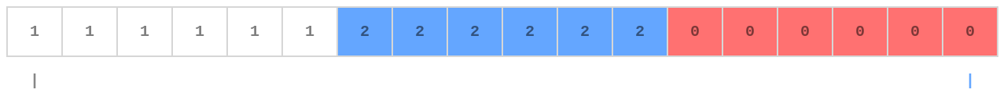

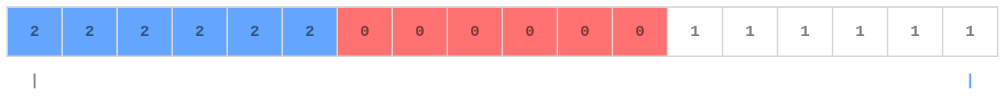

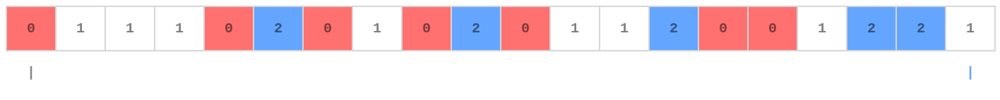